In [1]:
# PACKAGES
import numpy as np
import os, sys, librosa
from scipy import signal
from matplotlib import pyplot as plt
import IPython.display as ipd
from numba import jit, prange
import libfmp.b
%matplotlib inline

import scipy.signal as signal
from scipy.io import wavfile
from tqdm import tqdm
from scipy import stats
from scipy.signal import get_window, hilbert
from scipy.fft import fft

from enfify.enf_estimation import (
    segmented_phase_estimation_hilbert,
    phase_estimation_DFT1
)
from enfify.preprocessing import (
    bandpass_filter, downsample_ffmpeg,  cut_signal
)
from tqdm import tqdm

from enfify.enf_enhancement import RFA_STFT, RFA_DFT1, RFA

In [2]:
## IF Methods

#STFT
@jit(nopython=True)
def principal_argument(v):
    """Principal argument function

    Args:
        v (float or np.ndarray): Value (or vector of values)

    Returns:
        w (float or np.ndarray): Principle value of v
    """
    w = np.mod(v + 0.5, 1) - 0.5
    return w

@jit(nopython=True)
def compute_if(X, Fs, N, H):
    """Instantenous frequency (IF) estamation

    Args:
        X (np.ndarray): STFT
        Fs (scalar): Sampling rate
        N (int): Window size in samples
        H (int): Hop size in samples

    Returns:
        F_coef_IF (np.ndarray): Matrix of IF values
    """
    phi_1 = np.angle(X[:, 0:-1]) / (2 * np.pi)
    phi_2 = np.angle(X[:, 1:]) / (2 * np.pi)

    K = X.shape[0]
    index_k = np.arange(0, K).reshape(-1, 1)
    # Bin offset (FMP, Eq. (8.45))
    kappa = (N / H) * principal_argument(phi_2 - phi_1 - index_k * H / N)
    # Instantaneous frequencies (FMP, Eq. (8.44))
    F_coef_IF = (index_k + kappa) * Fs / N

    # Extend F_coef_IF by copying first column to match dimensions of X
    F_coef_IF = np.hstack((np.copy(F_coef_IF[:, 0]).reshape(-1, 1), F_coef_IF))

    return F_coef_IF

def compute_max_energy_frequency_over_time(X, F_coef_IF):
    """Compute the dominant frequency over time based on max energy.
    
    Args:
        X (np.ndarray): STFT matrix (complex-valued).
        F_coef_IF (np.ndarray): Instantaneous frequency matrix.
        
    Returns:
        max_energy_freq (np.ndarray): 1D array of dominant frequencies over time.
    """
    # Magnitude of STFT values (|X|)
    magnitude = np.abs(X)

    # Find the index of the frequency bin with maximum magnitude in each time frame
    max_energy_indices = np.argmax(magnitude, axis=0)

    # Use these indices to extract the corresponding instantaneous frequencies
    max_energy_freq = F_coef_IF[max_energy_indices, np.arange(F_coef_IF.shape[1])]

    return max_energy_freq


def STFT(signal, sampling_freq, step_size, window_len):
    """
    Computes the Short-Time Fourier Transform (STFT) of a given signal, extracts instantaneous frequency, and computes 
    the dominant frequency over time.

    Args:
        signal (numpy.ndarray): The input time-domain signal (1D array).
        sampling_freq (int or float): The sampling frequency of the signal (in Hz).
        step_size (int): Hop length, the number of samples between successive frames.
        window_len (int): Length of each FFT window (in samples).

    Returns:
        freqs (numpy.ndarray): Array of dominant frequencies over time (in Hz).
    """
    # Compute the Short-Time Fourier Transform (STFT)
    X = librosa.stft(signal, n_fft=window_len, hop_length=step_size, win_length=window_len, window='hamming')

    # Compute the instantaneous frequency (placeholder function)
    F_coef_IF = compute_if(X, sampling_freq, window_len, step_size)

    # Compute the dominant frequency over time (placeholder function)
    freqs = compute_max_energy_frequency_over_time(X, F_coef_IF)

    return freqs

# DFT1

# Estimate frequency with DFT¹ instantaneous estimation (Rodriguez Paper)
def freq_estimation_DFT1(s_tone, Fs, N_DFT):
    """_summary_

    Args:
        s_tone (_type_): _description_
        Fs (_type_): _description_
        N_DFT (_type_): _description_

    Returns:
        _type_: _description_
    """

    # ......Estimate the frequency......#
    window_type = "hann"
    M = len(s_tone)

    # Get the window type
    window = get_window(window_type, M - 1)

    # Calculate the approx. first derivative of single tone
    s_tone_diff = Fs * np.diff(s_tone)
    s_tone = s_tone[1:]

    # Windowing
    s_tone_windowed = s_tone * window
    s_tone_diff_windowed = s_tone_diff * window

    # Zero-Padding of the signal
    s_tone_padded = np.pad(s_tone_windowed, (0, N_DFT - M), "constant")
    s_tone_padded_diff = np.pad(s_tone_diff_windowed, (0, N_DFT - M), "constant")

    # Calculate the DFT
    X = fft(s_tone_padded, n=N_DFT)
    X_diff = fft(s_tone_padded_diff, n=N_DFT)

    # Compute the amplitude spectrum and max. amplitude
    abs_X = np.abs(X)
    k_max = np.argmax(abs_X)
    abs_X_diff = np.abs(X_diff)

    # Estimated frequency of the single tone
    F_kmax = (np.pi * k_max) / (N_DFT * np.sin(np.pi * k_max / N_DFT))
    f0_estimated = (F_kmax * abs_X_diff[k_max]) / (2 * np.pi * abs_X[k_max])

    # Validate the frequency result
    k_DFT = (N_DFT * f0_estimated) / Fs
    try:
        k_DFT >= (k_max - 0.5) and k_DFT < (k_max + 0.5)
    except ValueError:
        print("estimated frequency is not valid")

    return f0_estimated

def segmented_freq_estimation_DFT1(s_in, f_s, N_DFT, step_size, window_len):
    """_summary_

    Args:
        s_in (_type_): _description_
        f_s (_type_): _description_
        num_cycles (_type_): _description_
        N_DFT (_type_): _description_
        nominal_enf (_type_): _description_

    Returns:
        _type_: _description_
    """

    segments = []

    for i in range(0,len(s_in), step_size):
        segments.append(s_in[i:i+window_len])

    freqs = []
    for i in range(len(segments)):
        freq = freq_estimation_DFT1(segments[i], f_s, N_DFT)
        freqs.append(freq)

    return np.array(freqs)

def segmented_phase_estimation_DFT1(s_in, f_s, N_DFT, nominal_enf, step_size, window_len):
    """_summary_

    Args:
        s_in (_type_): _description_
        f_s (_type_): _description_
        num_cycles (_type_): _description_
        N_DFT (_type_): _description_
        nominal_enf (_type_): _description_

    Returns:
        _type_: _description_
    """

    segments = []

    for i in range(0,len(s_in), step_size):
        segments.append(s_in[i:i+window_len])

    phases = []
    for segment in segments:
        phase = phase_estimation_DFT1(segment, f_s, N_DFT, nominal_enf)
        phases.append(phase)

    phases = [2 *(x + np.pi/2) for x in phases]
    phases = np.unwrap(phases)
    phases = [(x/2.0 - np.pi/2) for x in phases]

    return phases

In [5]:
# RFA

@jit(nopython=True, fastmath=True)
def z_SFM(sig, n, fs, alpha, tau):
    """Computes the z_SFM value with JIT optimization."""
    sum_sig = np.sum(sig[n - tau : n + tau + 1])
    z = np.exp(1j * 2 * np.pi * (1 / fs) * alpha * sum_sig)
    return z


@jit(nopython=True, parallel=True, fastmath=True)
def kernel_function(sig, f, n, fs, alpha, tau_values, tau_dash_values):
    """Computes the kernel function using JIT and vectorized operations."""
    auto_corr = np.empty(len(tau_values), dtype=np.complex128)
    auto_corr_dash = np.empty(len(tau_dash_values), dtype=np.complex128)

    for i in range(len(tau_values)):
        auto_corr[i] = z_SFM(sig, n, fs, alpha, tau_values[i])
        auto_corr_dash[i] = z_SFM(sig, n, fs, alpha, tau_dash_values[i])

    sin_vals = np.sin(2 * np.pi * (1 / fs) * f * tau_values)
    cos_vals = np.cos(2 * np.pi * (1 / fs) * f * tau_values)

    # Precompute exponents to save time in kernel calculation
    kernel = (auto_corr**sin_vals) * (auto_corr_dash**cos_vals)
    return np.angle(kernel)


@jit(nopython=True, parallel=True, fastmath=True)
def rfa_kernel_phases(sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values):
    for n in prange(Nx - 1):
        f = f_start[n]
        kernel_phases = kernel_function(sig, f, n, fs, alpha, tau_values, tau_dash_values)
        denoised_sig[n] = np.sum(kernel_phases) / ((tau + 1) * tau * np.pi * alpha)

    return denoised_sig


# Use DFT1 as STFT method for the instantaneous frequency estimation
def RFA_DFT1(sig, fs, tau, var_I, estimated_enf, step_size, window_len, N_DFT):
    """Optimized Recursive Frequency Adaptation algorithm with partial JIT optimization."""
    Nx = len(sig)
    alpha = 1 / (4 * fs * np.max(sig))
    f_start = estimated_enf * np.ones(Nx)
    tau_values = np.arange(1, tau + 1)
    tau_dash_values = tau_values + int(np.round(fs / (4 * estimated_enf)))

    denoised_sig_arr = []
    peak_freqs_arr = []

    for k in range(var_I):
        denoised_sig = np.zeros(Nx)

        denoised_sig = rfa_kernel_phases(
            sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values
        )

        # Peak frequency estimation
        peak_freqs = segmented_freq_estimation_DFT1(denoised_sig, fs, N_DFT, step_size, window_len)

        peak_freqs_arr.append(peak_freqs)

        base_repeats = Nx // len(peak_freqs)
        remainder = Nx % len(peak_freqs)
        repeat_counts = np.full(len(peak_freqs), base_repeats)
        repeat_counts[:remainder] += 1
        new_freqs = np.repeat(peak_freqs, repeat_counts)

        f_diff = new_freqs - f_start
        f_start = new_freqs

        val = np.sum(f_diff**2) / np.sum(f_start**2)

        sig = denoised_sig  # Update the signal for the next iteration
        denoised_sig_arr.append(denoised_sig)

    return denoised_sig_arr, peak_freqs_arr


## Use STFT
def RFA_STFT(sig, fs, tau, var_I, estimated_enf, window_len, step_size):
    """Optimized Recursive Frequency Adaptation algorithm with partial JIT optimization."""

    Nx = len(sig)
    alpha = 1 / (4 * fs * np.max(sig))
    f_start = estimated_enf * np.ones(Nx)
    tau_values = np.arange(1, tau + 1)
    tau_dash_values = tau_values + int(np.round(fs / (4 * estimated_enf)))

    denoised_sig_arr = []
    peak_freqs_arr = []

    for k in range(var_I):
        denoised_sig = np.zeros(Nx)

        denoised_sig = rfa_kernel_phases(
            sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values
        )

        # Peak frequency estimation via STFT
        peak_freqs = STFT(denoised_sig, fs, step_size, window_len)
        peak_freqs_arr.append(peak_freqs)
        
        base_repeats = Nx // len(peak_freqs)
        remainder = Nx % len(peak_freqs)
        repeat_counts = np.full(len(peak_freqs), base_repeats)
        repeat_counts[:remainder] += 1
        new_freqs = np.repeat(peak_freqs, repeat_counts)

        f_diff = new_freqs - f_start
        f_start = new_freqs

        val = np.sum(f_diff**2) / np.sum(f_start**2)

        sig = denoised_sig  # Update the signal for the next iteration
        denoised_sig_arr.append(denoised_sig)

    return denoised_sig_arr, peak_freqs_arr


In [3]:
# RFA analysisi tools
def normalized_misalignment(estimated_freq, ground_truth_freq):

    nominator = np.sum((np.array(estimated_freq)-np.array(ground_truth_freq))**2)
    denominator = np.sum(np.array(ground_truth_freq)**2)

    return nominator/denominator

def correlation_coeffizient(estimated_freq, ground_truth_freq):
    mu_estimated = np.mean(estimated_freq)
    mu_ground = np.mean(ground_truth_freq)

    nominator = np.sum((np.array(estimated_freq)-mu_estimated)*(np.array(ground_truth_freq)-mu_ground))
    denominator = np.sqrt(np.sum((np.array(estimated_freq)-mu_estimated)**2)) * np.sqrt(np.sum((np.array(ground_truth_freq)-mu_ground)**2))

    return nominator/denominator

# Estimate Tau
from scipy.optimize import minimize
import time

# Define the function W
def W(tau, delta, T):
    return np.sum(np.array([i*np.cos(2*np.pi*T*delta*i) for i in range(int(tau)+1)]))

# W_0
def W_0(tau):
    tau = int(abs(tau))
    return (tau+1)*tau/2

# Constraint
def constraint(tau, delta, T, e_0):
    return e_0 - abs(W(tau, delta, T) - W_0(tau))

# Objective function to maximize tau
def objective(tau):
    return -tau  # We minimize -tau to maximize tau

# Callback function to log time during the optimization process
def callback(tau):
    global iteration_start_time
    iteration_end_time = time.time()
    iteration_time = iteration_end_time - iteration_start_time
    print(f"Iteration {callback.iteration}: tau = {tau[0]:.6f}, time = {iteration_time:.6f} seconds")
    callback.iteration += 1
    iteration_start_time = time.time()  # Reset the start time for the next iteration

# Downsample ffmpeg
import tempfile
import os
import ffmpeg
import numpy as np
from scipy.io import wavfile

def downsample_ffmpeg(sig, sample_rate, downsample_rate):
    # Ensure input signal is in float32 format
    if sig.dtype != np.float32:
        sig = sig.astype(np.float32)

    # Create temporary input and output files
    with (
        tempfile.NamedTemporaryFile(delete=False, suffix=".wav") as input_file,
        tempfile.NamedTemporaryFile(delete=False, suffix=".wav") as output_file
    ):
        input_path = input_file.name
        output_path = output_file.name

        # Write the input signal to the temporary input file
        wavfile.write(input_path, sample_rate, sig)

        # Use ffmpeg to resample the audio to the desired downsample rate
        ffmpeg.input(input_path).output(
            output_path, ar=downsample_rate, acodec="pcm_f32le"
        ).overwrite_output().global_args("-loglevel", "error").run()

        # Read the downsampled signal from the output file
        downsample_rate, downsampled_sig = wavfile.read(output_path)

        # Remove temporary files
        os.remove(input_path)
        os.remove(output_path)

    return downsampled_sig, downsample_rate


def cut_signal(sig, cut_start, cut_len):
    """Cuts numpy arrays

    Args:
        sig (nparray): numpy array signal
        F_DS (int or float): Sampling frequency of the signal

    Returns:
        _type_: Cut numpy array
    """
    cut_end = cut_start + cut_len
    cut_sig = np.concatenate((sig[:cut_start], sig[cut_end:]))

    return cut_sig

In [4]:
# Data Paths

# Wuhan
WUHAN_H1_PTH = "/home/leo_dacasi/Dokumente/summerofcode/Enfify Data Synced/external/ENF-WHU-Dataset/H1"
WUHAN_H1REF_PTH = "/home/leo_dacasi/Dokumente/summerofcode/Enfify Data Synced/external/ENF-WHU-Dataset/H1_ref"

# Carioca
CARIOCA1_MAN = "/home/leo_dacasi/Dokumente/summerofcode/Enfify Data Synced/external/Carioca/BASE CARIOCA 1/Homens"
CARIOCA2_MAN = "/home/leo_dacasi/Dokumente/summerofcode/Enfify Data Synced/external/Carioca/BASE CARIOCA 2/Fixo/Homens"

wuhan_h1_files = sorted(os.listdir(WUHAN_H1_PTH))
print(wuhan_h1_files)

wuhan_h1ref_files = sorted(os.listdir(WUHAN_H1REF_PTH))
print(wuhan_h1ref_files)

carioca1_cut = [f"HC{i}e.wav" for i in range(1,26)]
print(carioca1_cut)

carioca1_uncut = [f"HC{i}.wav" for i in range(1,26)]
print(carioca1_uncut)

['001.wav', '002.wav', '003.wav', '004.wav', '005.wav', '006.wav', '007.wav', '008.wav', '009.wav', '010.wav', '011.wav', '012.wav', '013.wav', '014.wav', '015.wav', '016.wav', '017.wav', '018.wav', '019.wav', '020.wav', '021.wav', '022.wav', '023.wav', '024.wav', '025.wav', '026.wav', '027.wav', '028.wav', '029.wav', '030.wav', '031.wav', '032.wav', '033.wav', '034.wav', '035.wav', '036.wav', '037.wav', '038.wav', '039.wav', '040.wav', '041.wav', '042.wav', '043.wav', '044.wav', '045.wav', '046.wav', '047.wav', '048.wav', '049.wav', '050.wav', '051.wav', '052.wav', '053.wav', '054.wav', '055.wav', '056.wav', '057.wav', '058.wav', '059.wav', '060.wav', '061.wav', '062.wav', '063.wav', '064.wav', '065.wav', '066.wav', '067.wav', '068.wav', '069.wav', '070.wav', '071.wav', '072.wav', '073.wav', '074.wav', '075.wav', '076.wav', '077.wav', '078.wav', '079.wav', '080.wav', '081.wav', '082.wav', '083.wav', '084.wav', '085.wav', '086.wav', '087.wav', '088.wav', '089.wav', '090.wav', '091.wav'

In [ ]:
'''from scipy.io import wavfile
pth = os.path.join(CARIOCA1_MAN, carioca1_uncut[0])

data, sample_rate = librosa.load(pth, sr=None)
print(sample_rate)
print(data)

print("LEER")
down_sig_lib = librosa.resample(data, orig_sr=sample_rate, target_sr=400)
print(down_sig_lib)

print("LEER")
down_sig_ffmpeg, _ = downsample_ffmpeg(data, sample_rate, 400)
print(down_sig_ffmpeg)

lowcut = 99.5
highcut = 100.5
order = 5

band_sig_lib = bandpass_filter(down_sig_lib, lowcut, highcut, 400, order)

band_sig_ffmpeg = bandpass_filter(down_sig_ffmpeg, lowcut, highcut, 400, order)


N_DFT = 20_000
step_size = 20
window_len = 8_000
f_s = 400
nominal_enf = 100


freqs = segmented_freq_estimation_DFT1(band_sig_ffmpeg, f_s, N_DFT, step_size, window_len)
plt.plot(freqs)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Frequency Hz")
plt.title("Frequency vs Time ffmpeg DFT1")
plt.grid(True)
plt.show()

freqs = segmented_freq_estimation_DFT1(band_sig_lib, f_s, N_DFT, step_size, window_len)
plt.plot(freqs)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Frequency Hz")
plt.title("Frequency vs Time librosa DFT1")
plt.grid(True)
plt.show()

freqs = STFT(band_sig_ffmpeg, f_s, step_size, window_len)
plt.plot(freqs)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Frequency Hz")
plt.title("Frequency vs Time ffmpeg STFT")
plt.grid(True)
plt.show()

freqs = STFT(band_sig_lib, f_s, step_size, window_len)
plt.plot(freqs)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Frequency Hz")
plt.title("Frequency vs Time librosa STFT")
plt.grid(True)
plt.show()

phases = segmented_phase_estimation_DFT1(band_sig_ffmpeg, f_s, N_DFT, nominal_enf, step_size, window_len)
plt.plot(phases)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Phases in °")
plt.title("Phases vs Time ffmpeg")
plt.grid(True)
plt.show()

phases = segmented_phase_estimation_DFT1(band_sig_lib, f_s, N_DFT, nominal_enf, step_size, window_len)
plt.plot(phases)
plt.xlabel("Cycles of nominal enf")
plt.ylabel("Phases in °")
plt.title("Phases vs Time lib")
plt.grid(True)
plt.show()'''

  0%|          | 0/26 [00:00<?, ?it/s]

Window Length : 100


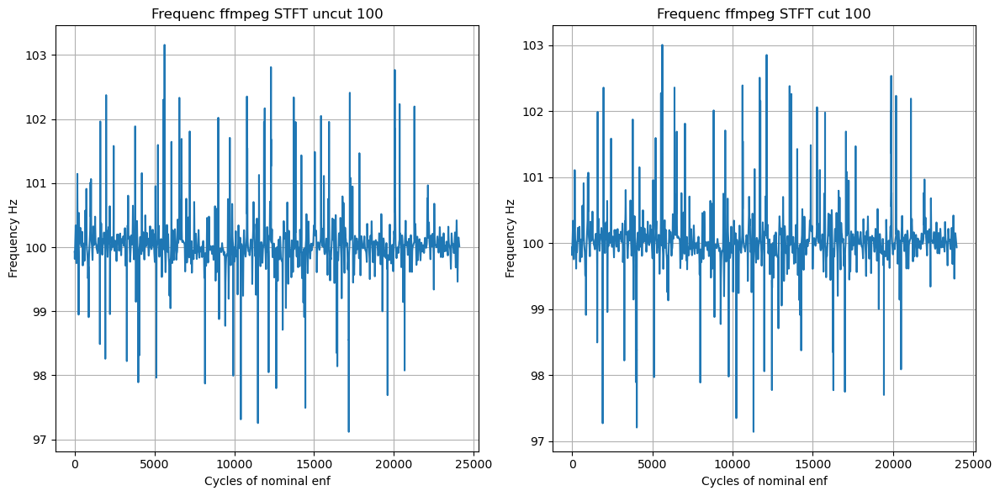

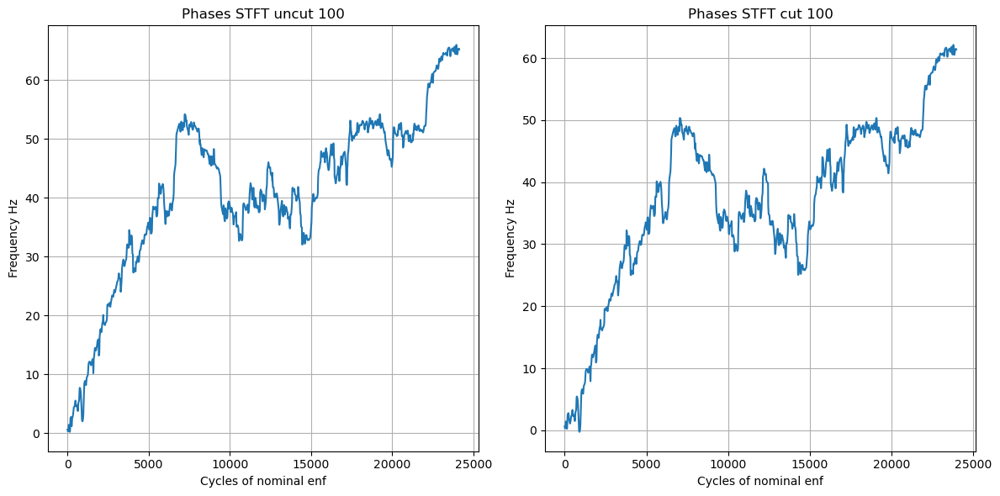

  4%|▍         | 1/26 [00:19<08:01, 19.26s/it]

Window Length : 200


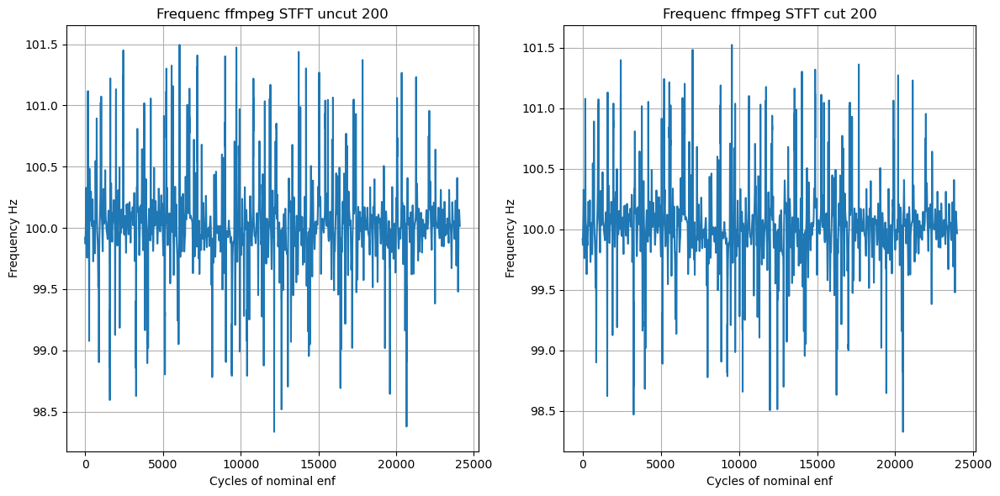

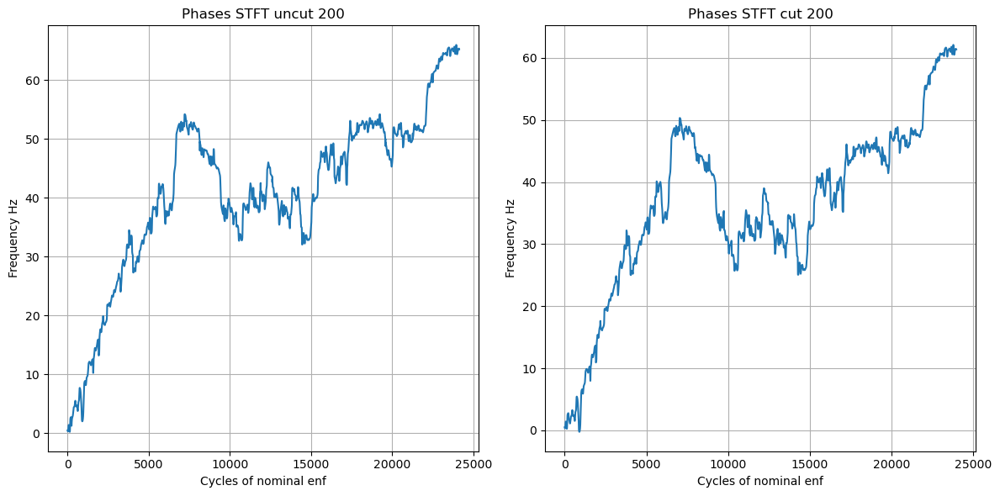

  8%|▊         | 2/26 [00:35<06:57, 17.42s/it]

Window Length : 300


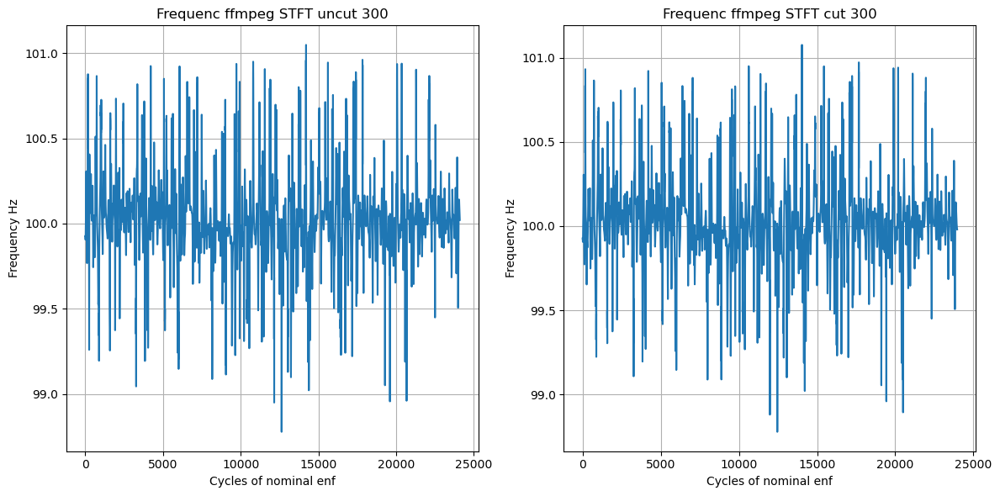

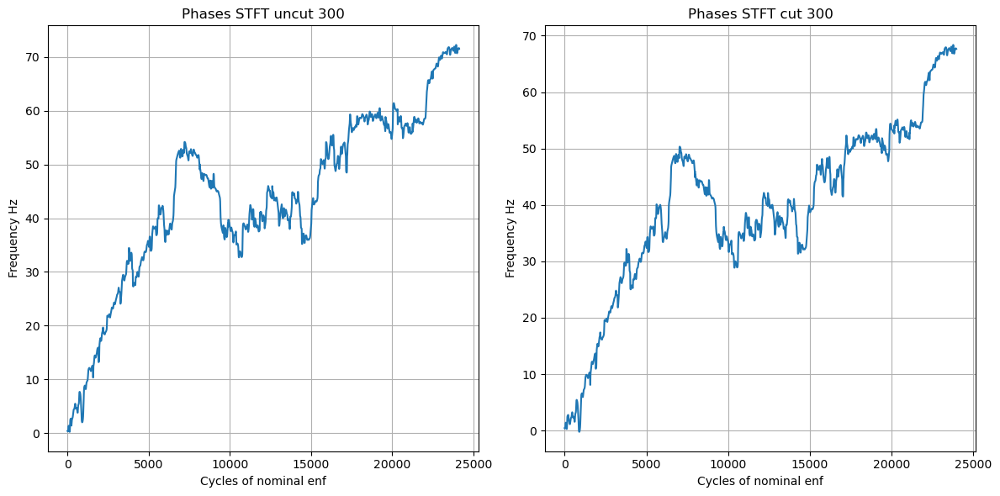

 12%|█▏        | 3/26 [00:51<06:30, 16.98s/it]

Window Length : 400


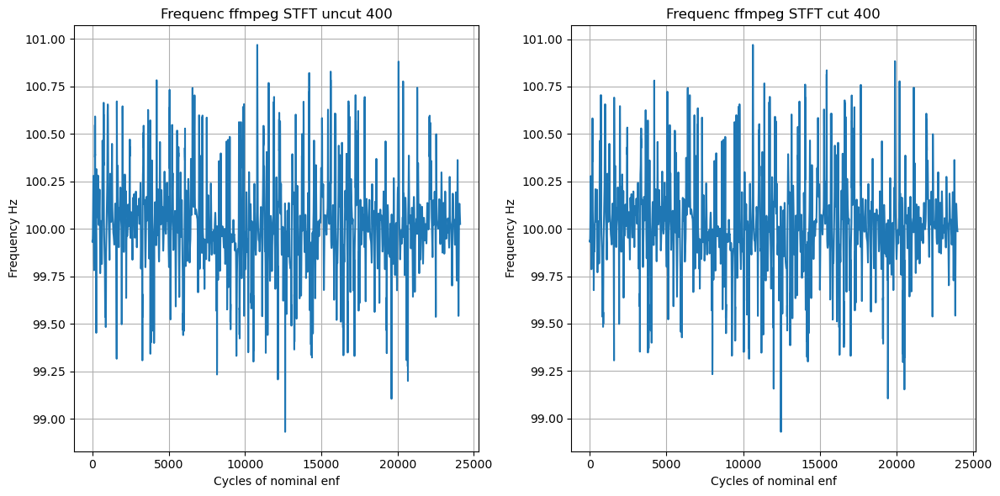

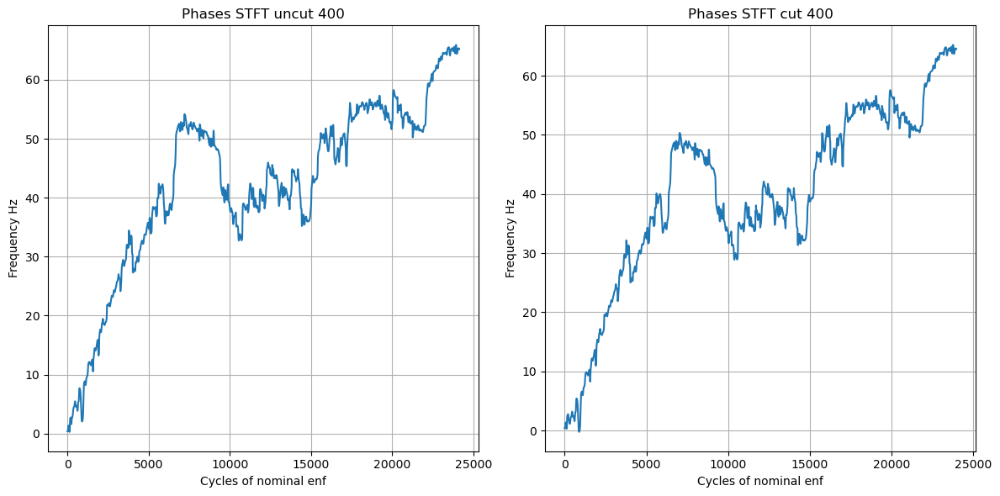

 15%|█▌        | 4/26 [01:09<06:16, 17.11s/it]

Window Length : 500


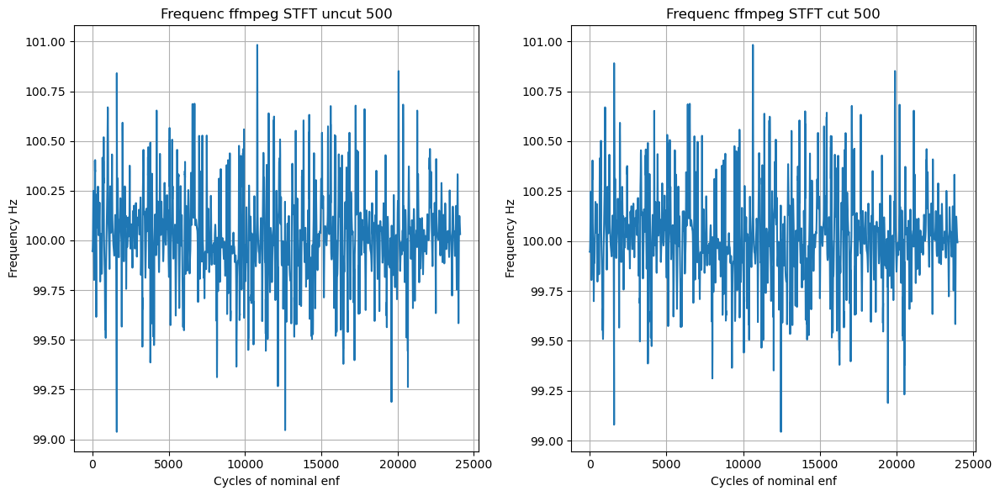

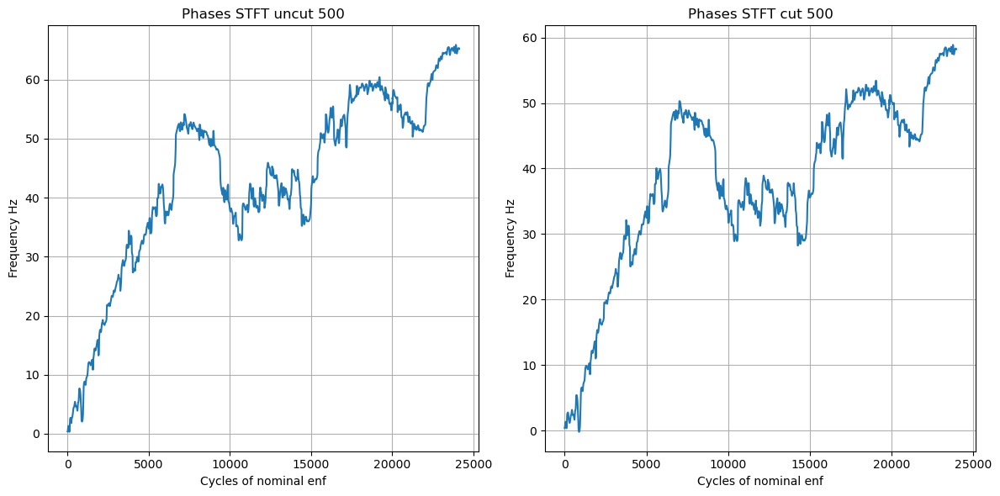

 19%|█▉        | 5/26 [01:26<06:03, 17.30s/it]

Window Length : 600


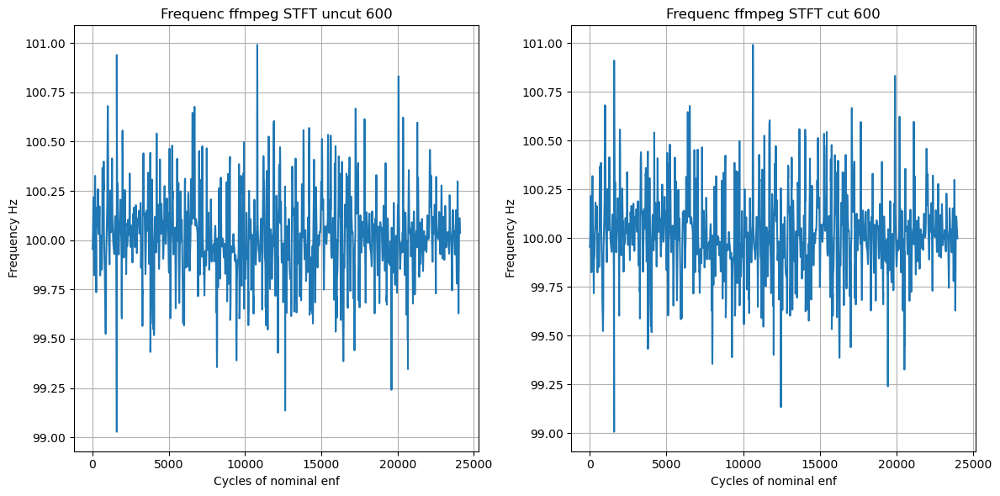

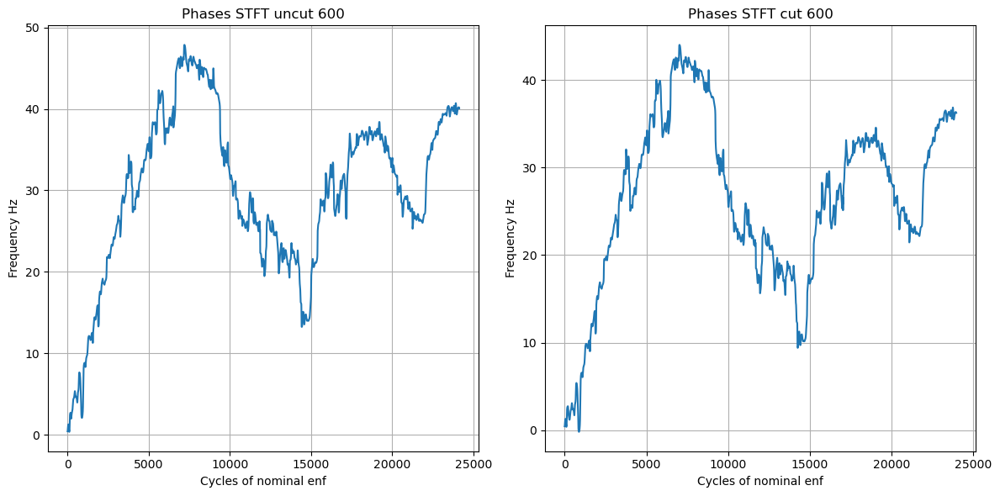

 23%|██▎       | 6/26 [01:44<05:51, 17.56s/it]

Window Length : 700


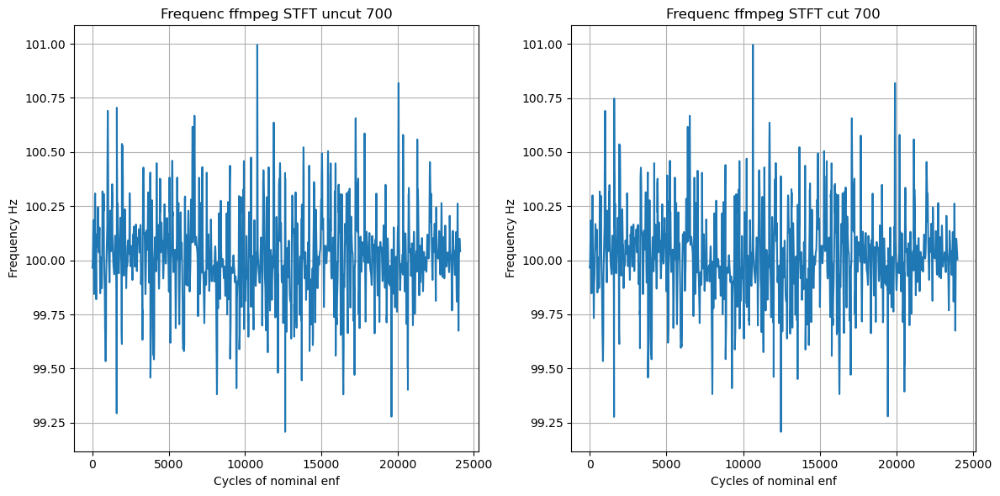

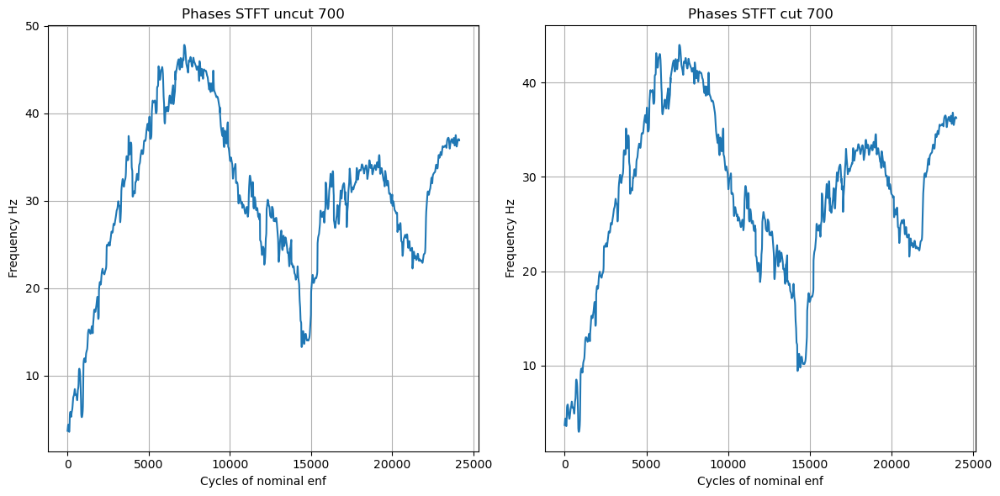

 27%|██▋       | 7/26 [02:03<05:39, 17.87s/it]

Window Length : 800


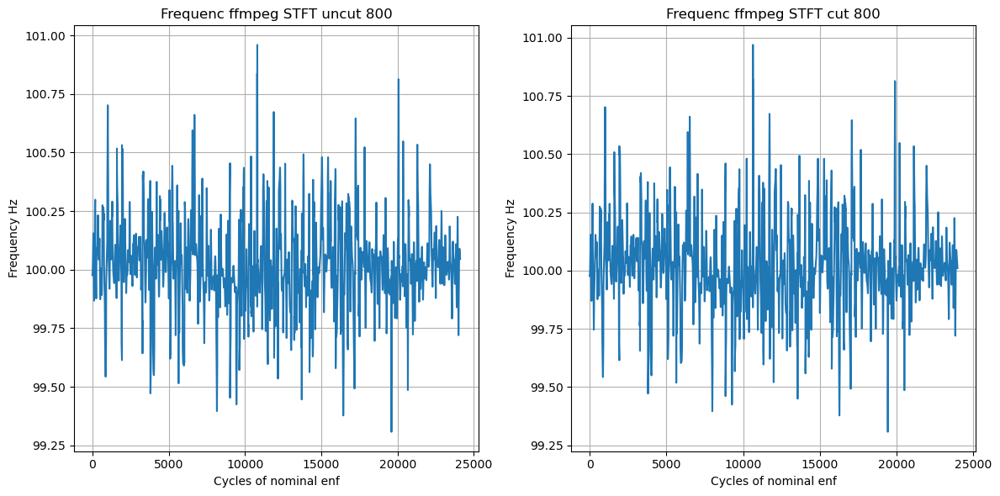

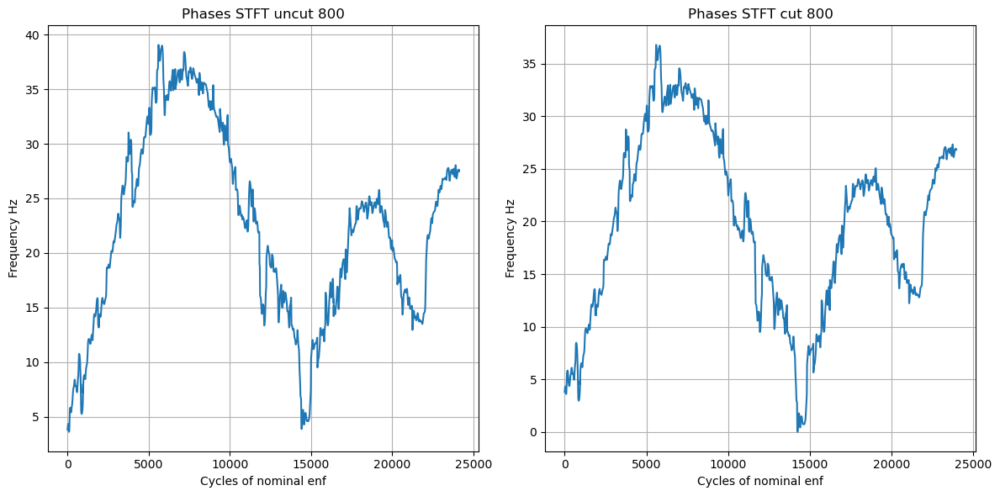

 31%|███       | 8/26 [02:22<05:28, 18.23s/it]

Window Length : 900


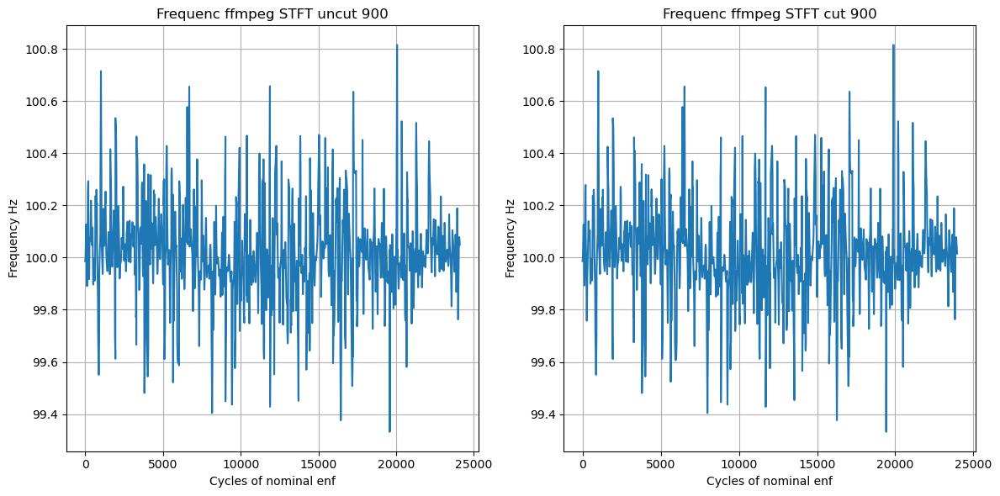

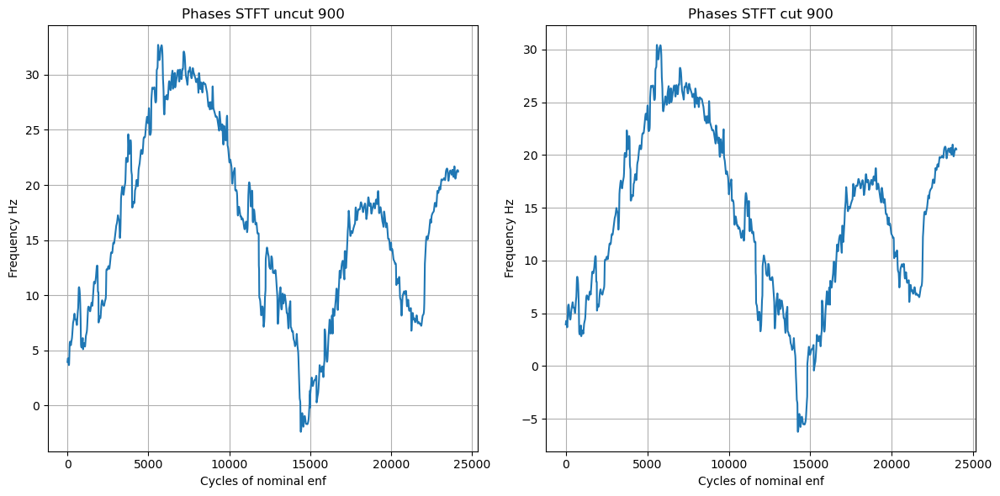

 35%|███▍      | 9/26 [02:41<05:17, 18.67s/it]

Window Length : 1000


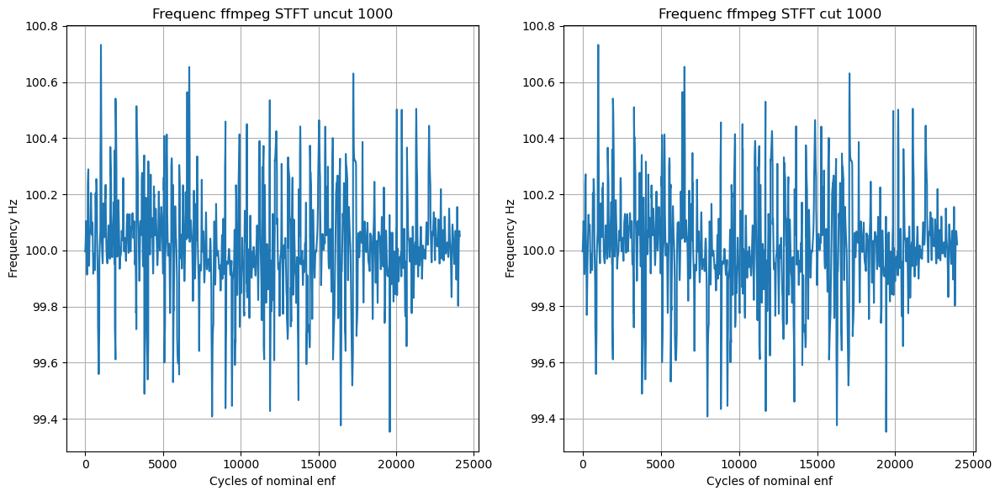

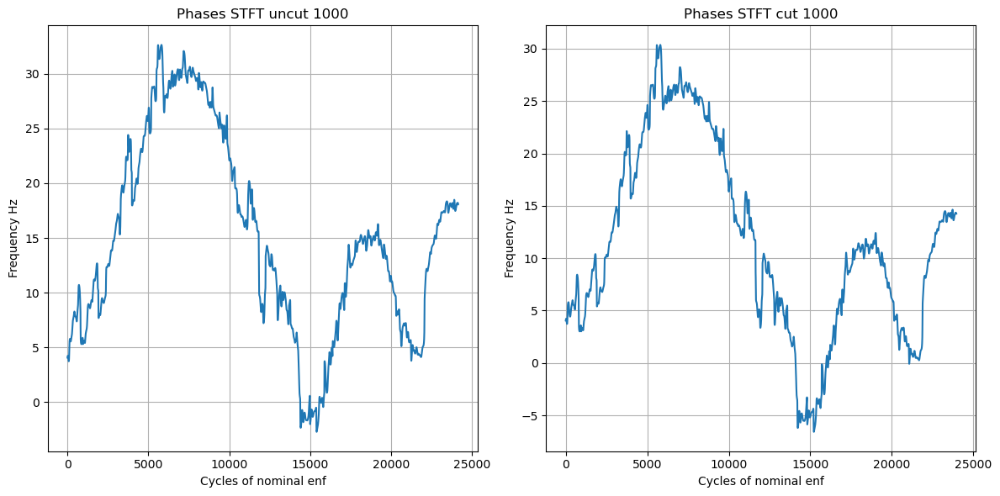

 38%|███▊      | 10/26 [03:01<05:04, 19.05s/it]

Window Length : 1500


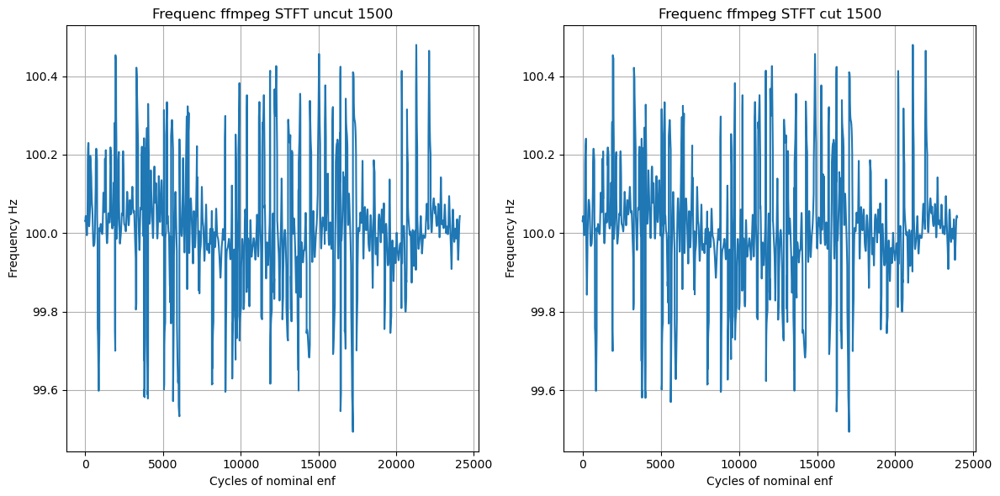

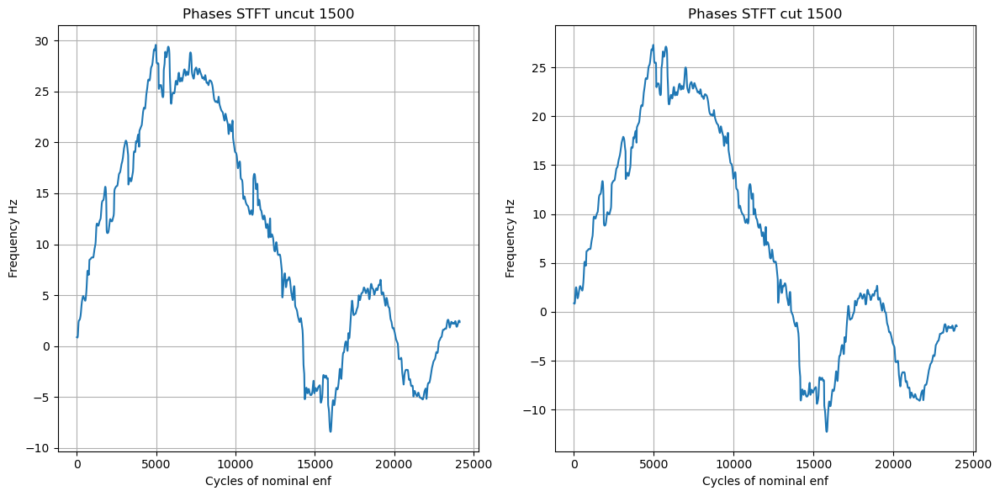

 42%|████▏     | 11/26 [03:24<05:00, 20.05s/it]

Window Length : 2000


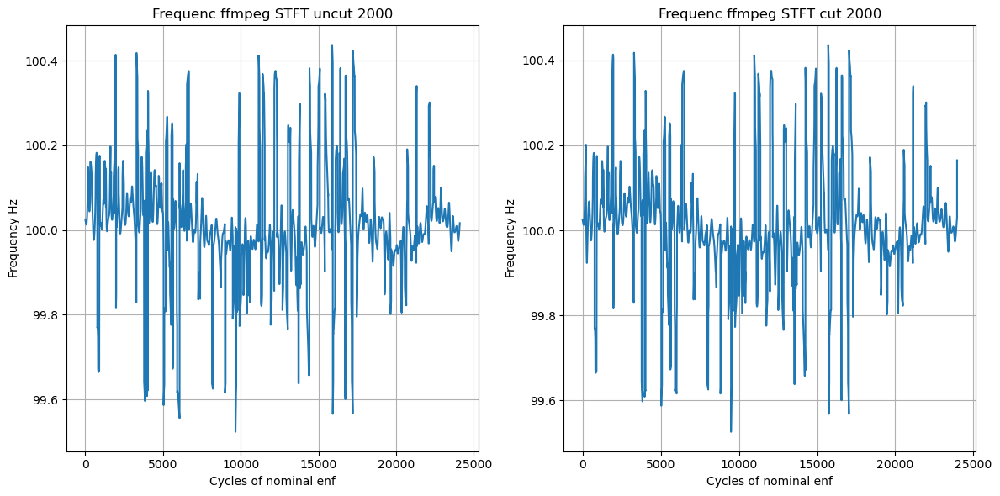

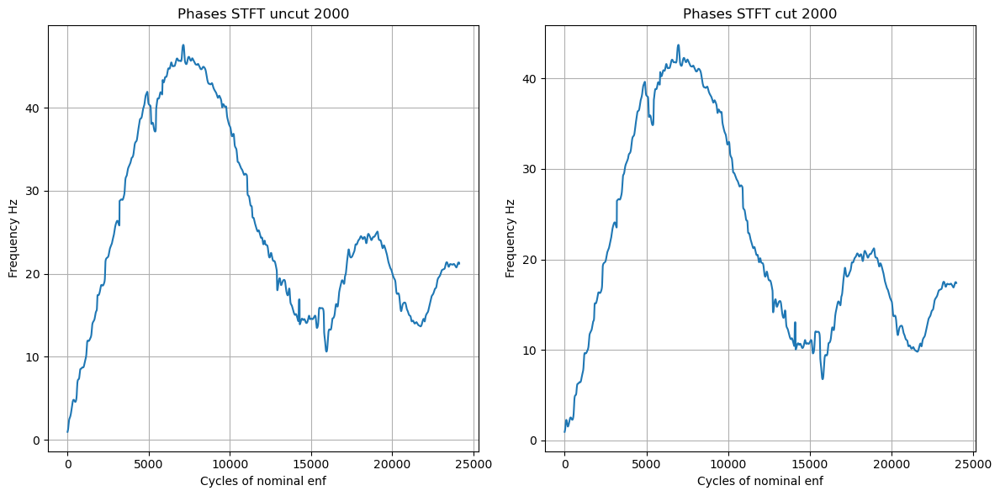

 46%|████▌     | 12/26 [03:48<05:00, 21.44s/it]

Window Length : 2500


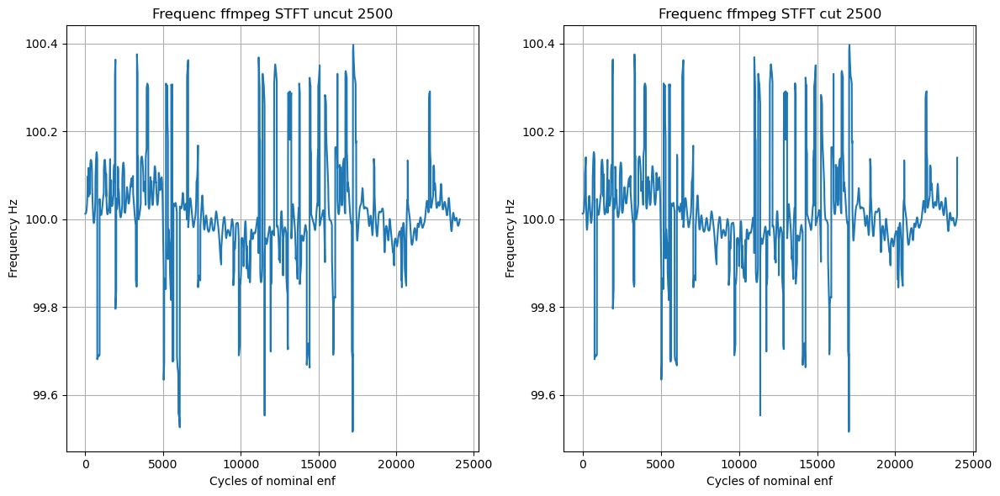

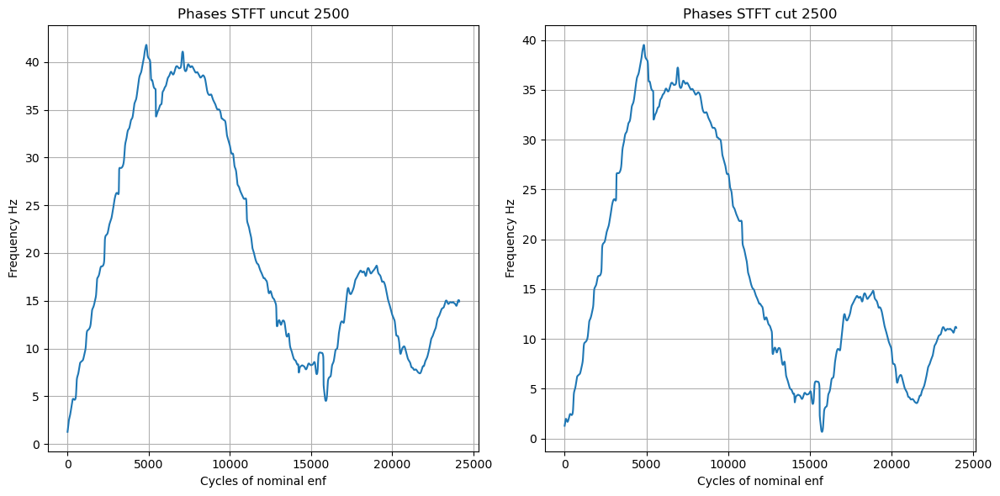

 50%|█████     | 13/26 [04:15<05:00, 23.13s/it]

Window Length : 3000


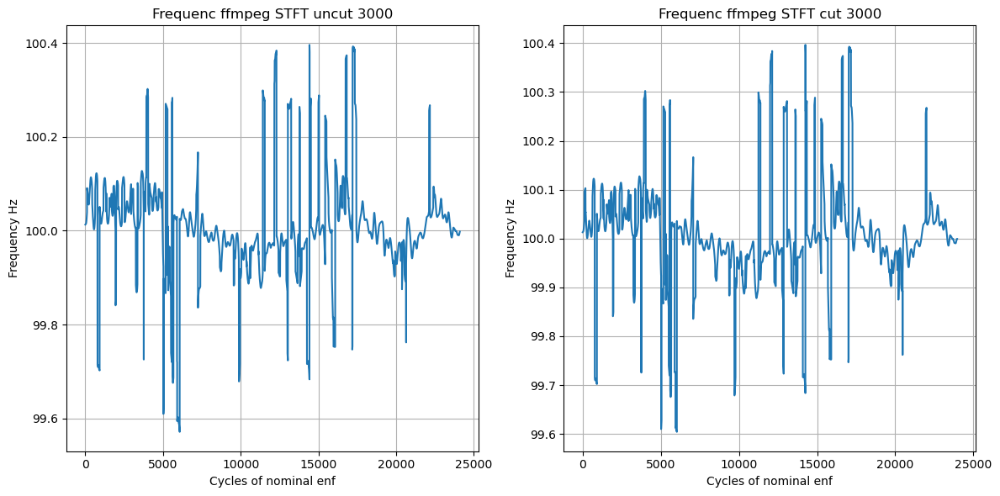

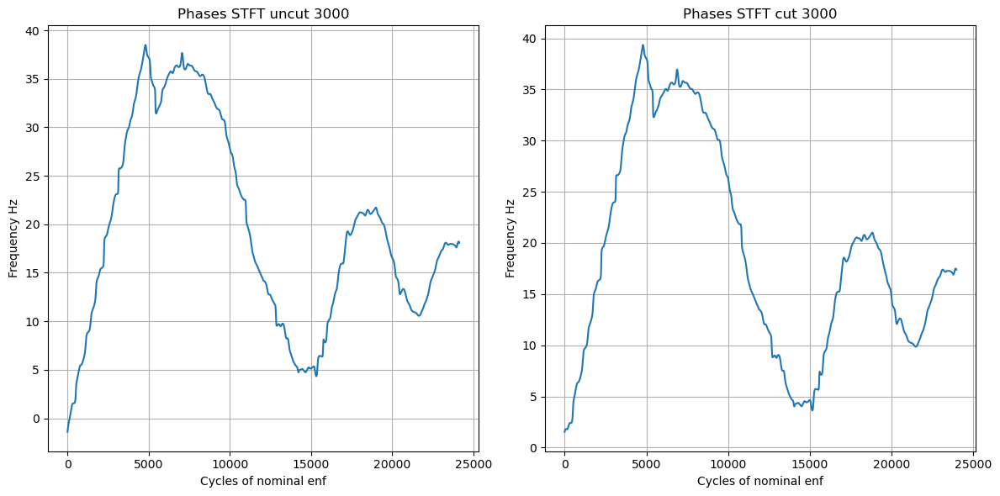

 54%|█████▍    | 14/26 [04:45<05:00, 25.01s/it]

Window Length : 3500


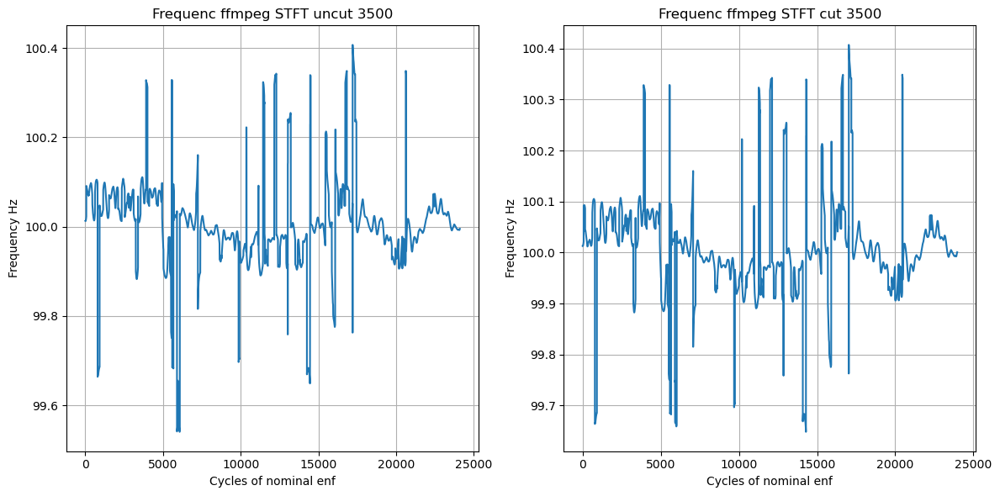

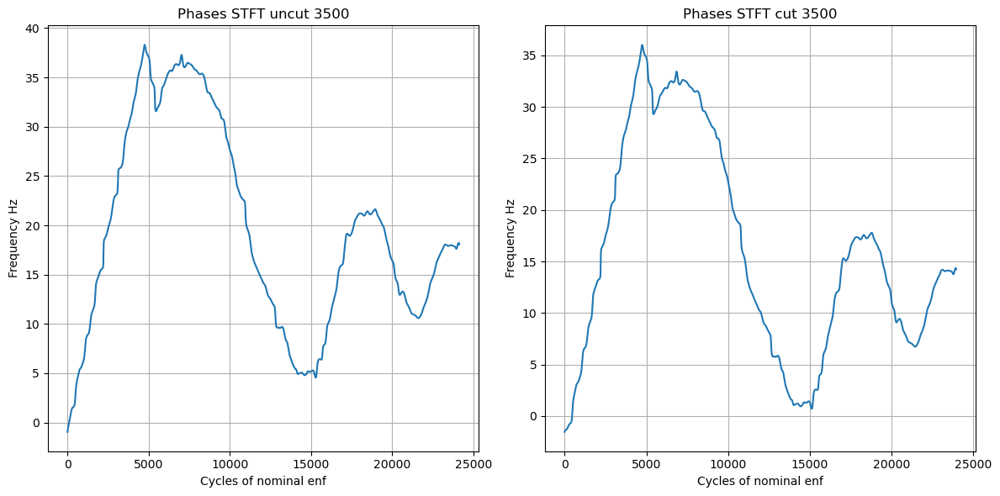

 58%|█████▊    | 15/26 [05:16<04:56, 26.98s/it]

Window Length : 4000


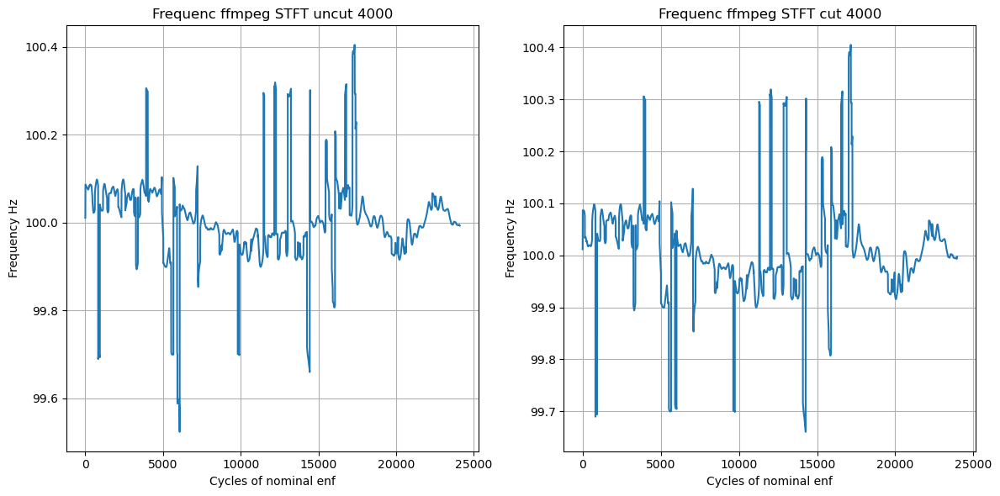

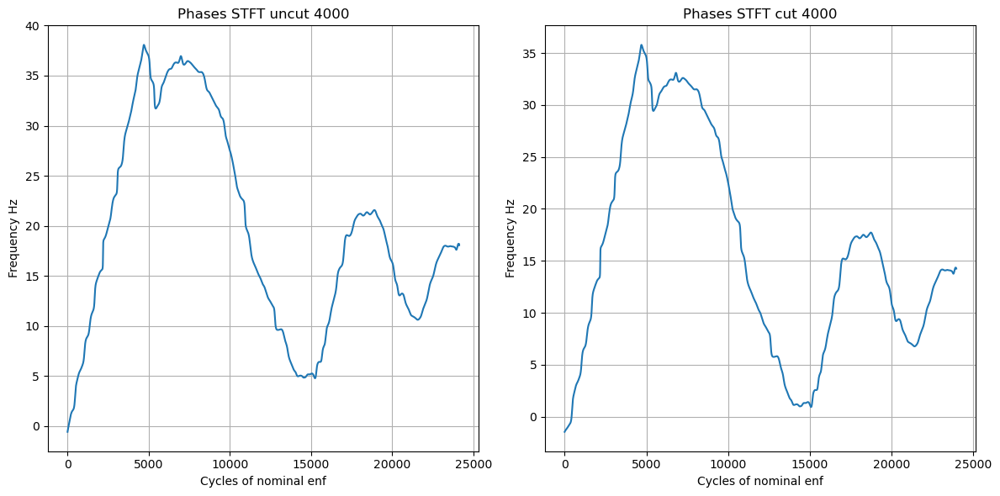

 62%|██████▏   | 16/26 [05:50<04:49, 28.96s/it]

Window Length : 5000


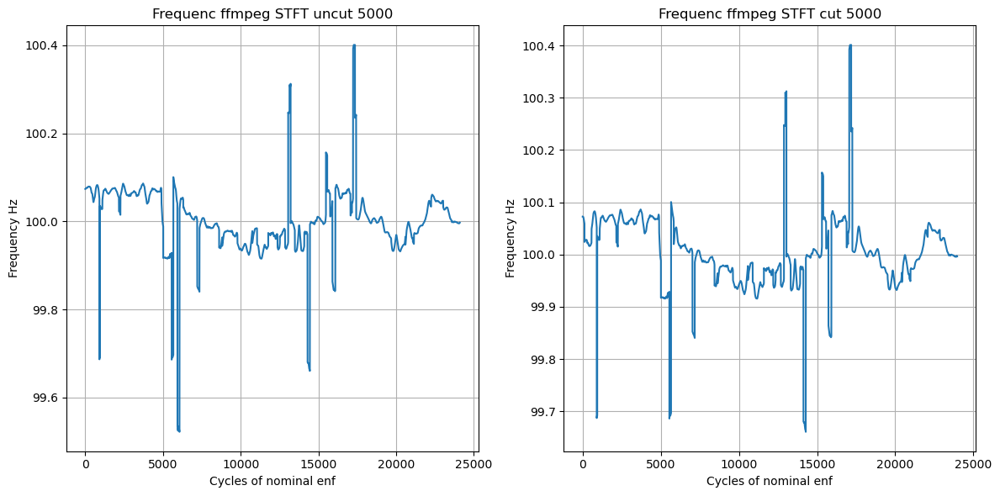

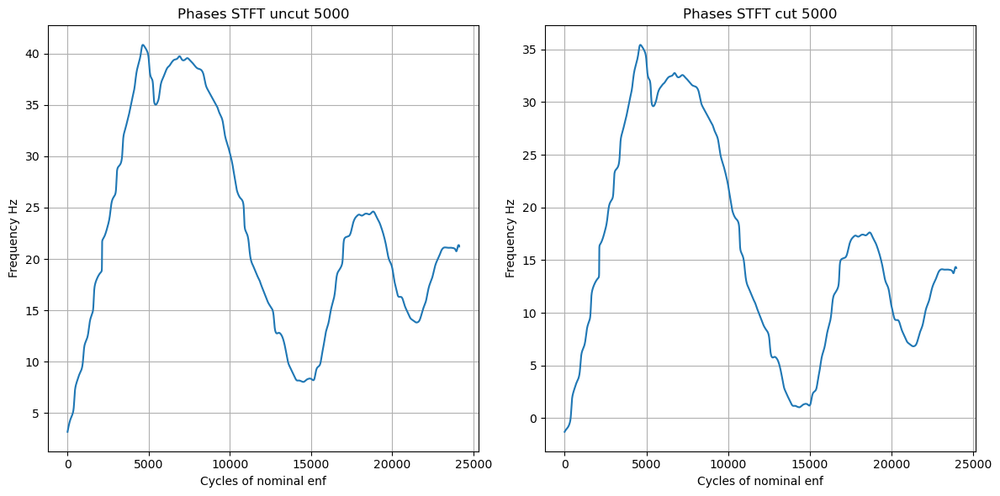

 65%|██████▌   | 17/26 [06:28<04:45, 31.70s/it]

Window Length : 6000


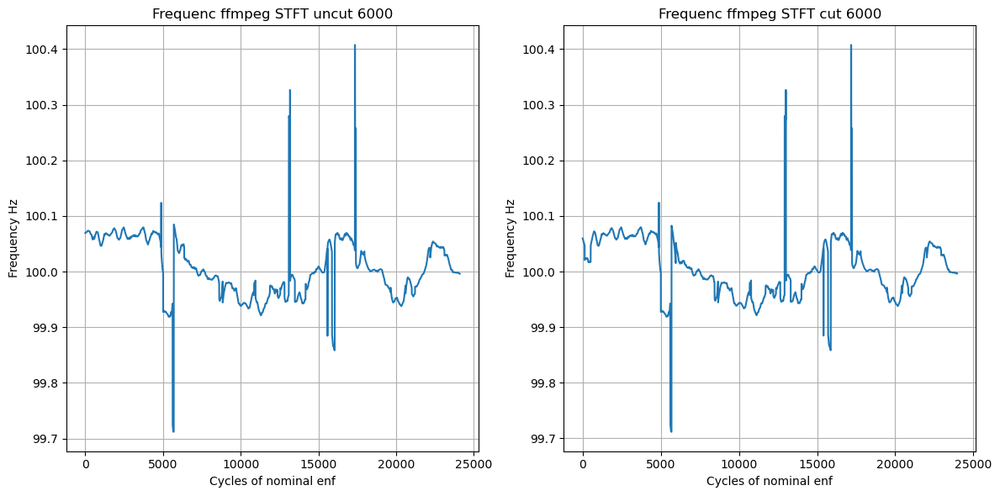

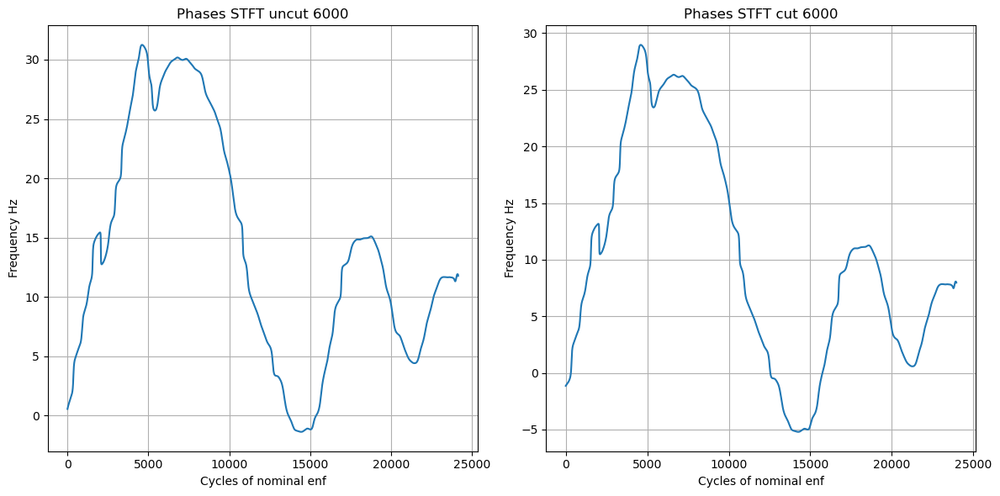

 69%|██████▉   | 18/26 [07:10<04:39, 34.89s/it]

Window Length : 7000


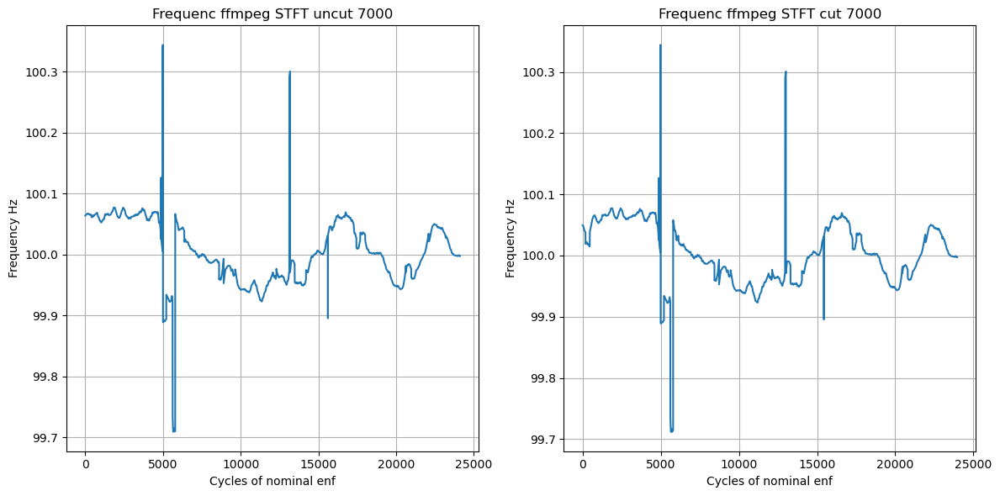

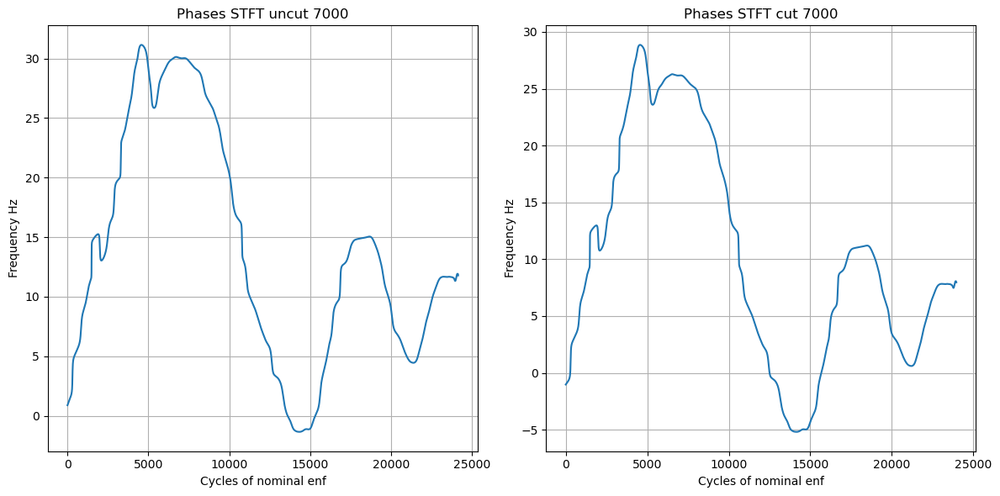

 73%|███████▎  | 19/26 [07:58<04:30, 38.69s/it]

Window Length : 8000


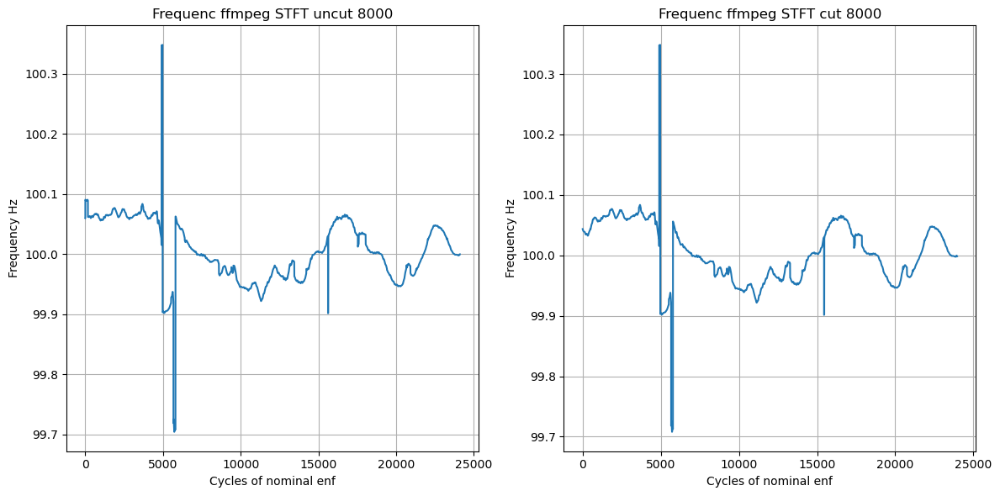

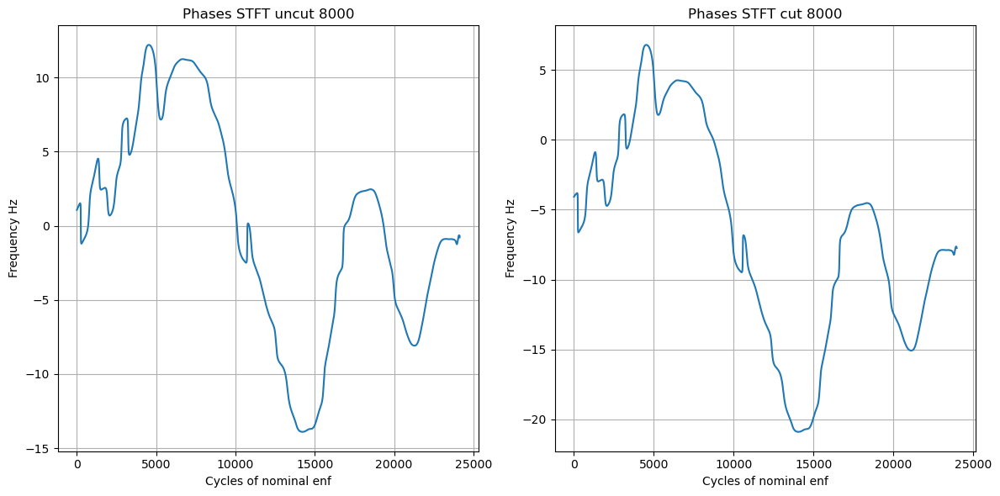

 77%|███████▋  | 20/26 [08:49<04:14, 42.50s/it]

Window Length : 9000


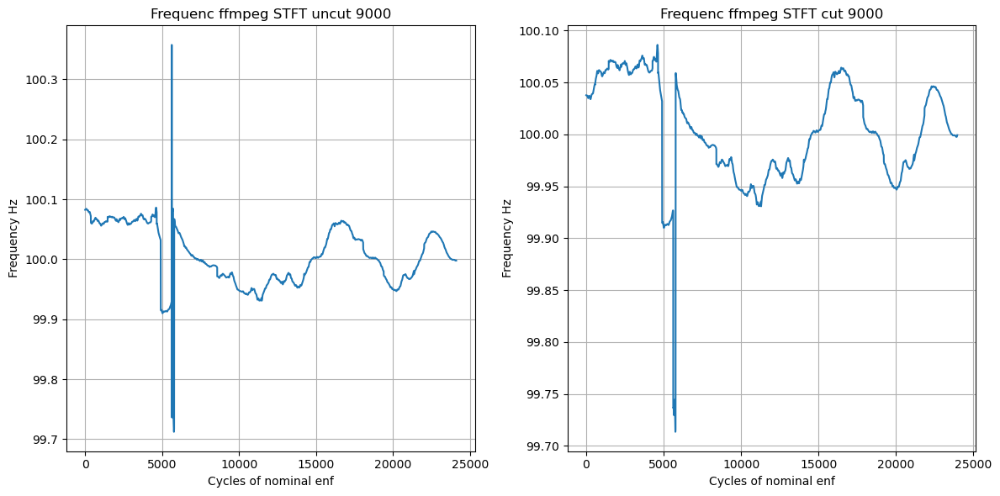

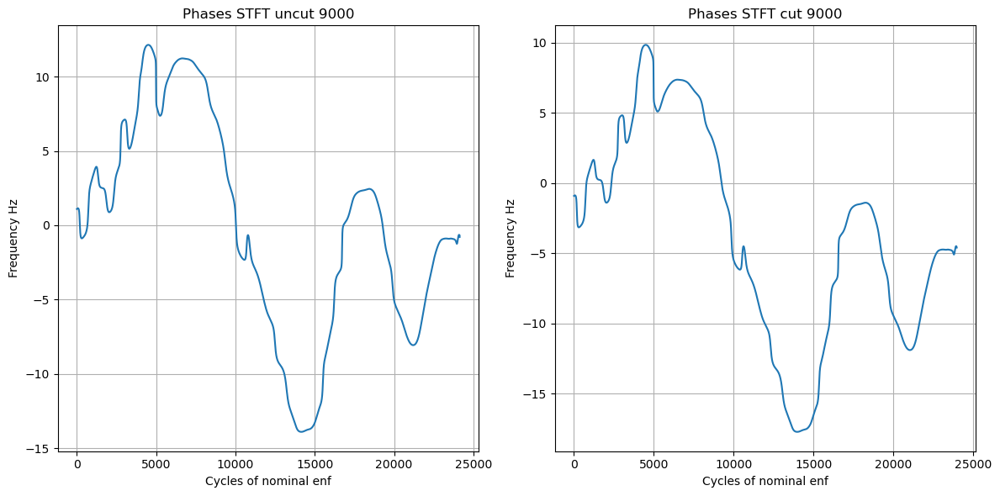

 81%|████████  | 21/26 [09:45<03:52, 46.56s/it]

Window Length : 10000


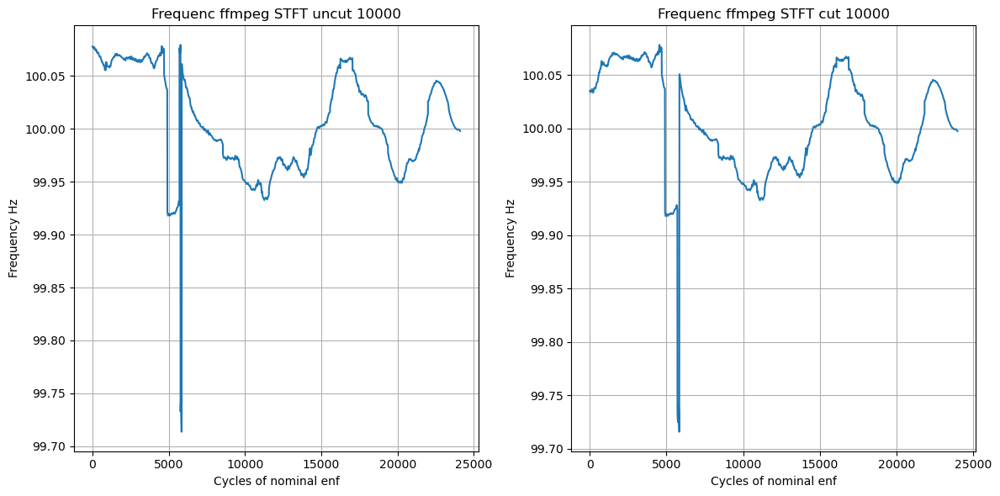

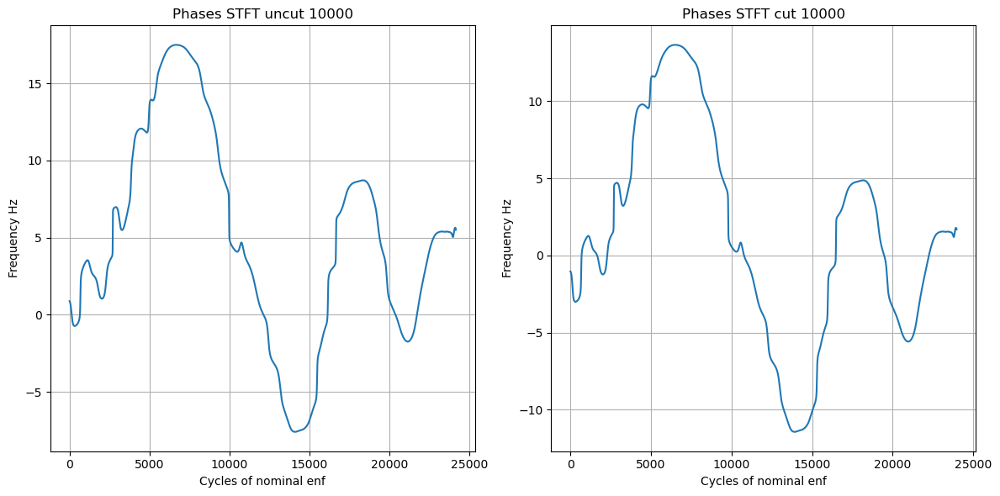

 85%|████████▍ | 22/26 [10:46<03:23, 50.91s/it]

Window Length : 11000


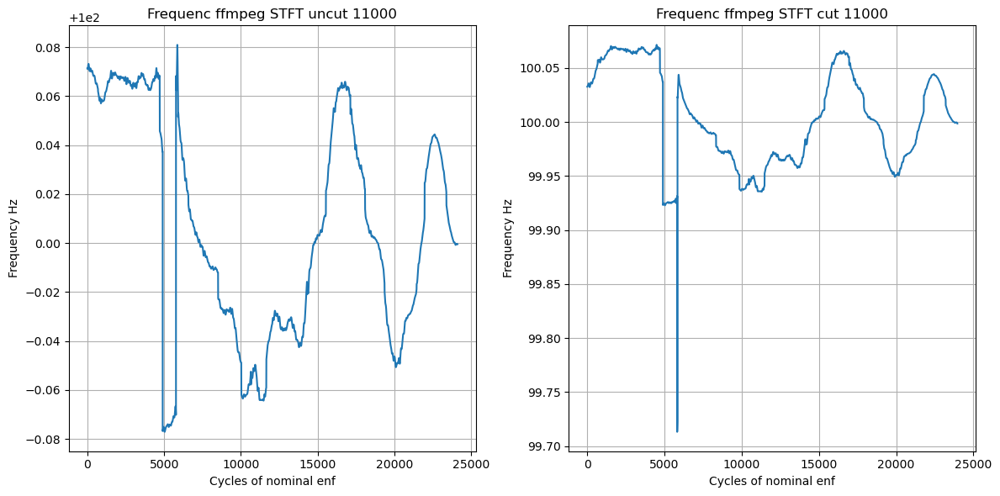

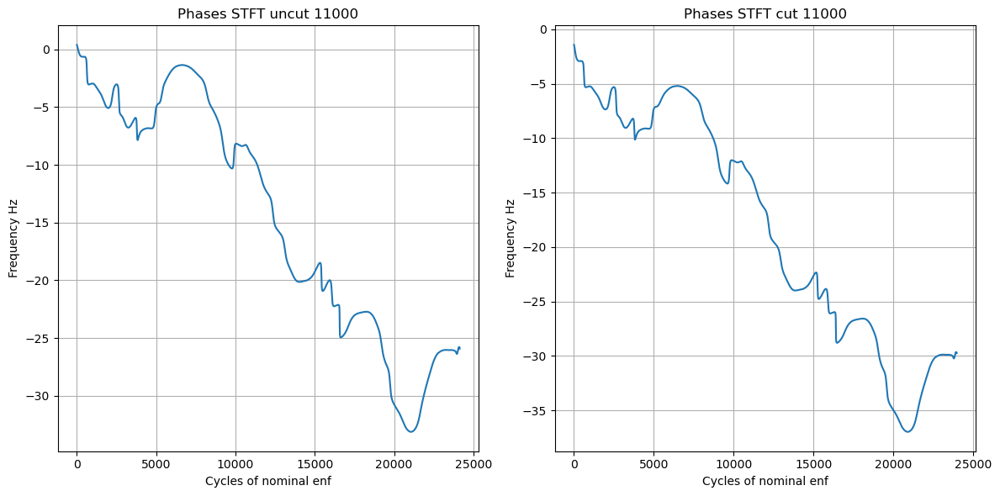

 88%|████████▊ | 23/26 [11:52<02:46, 55.47s/it]

Window Length : 12000


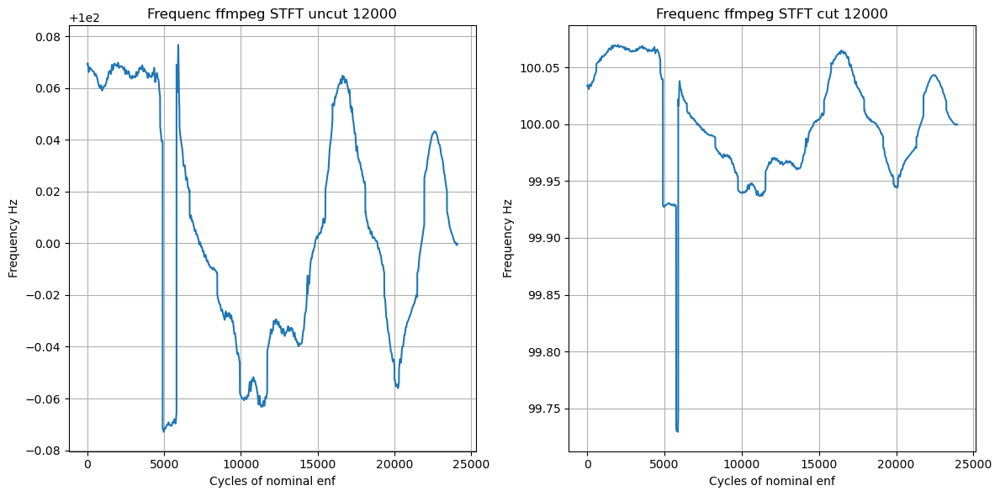

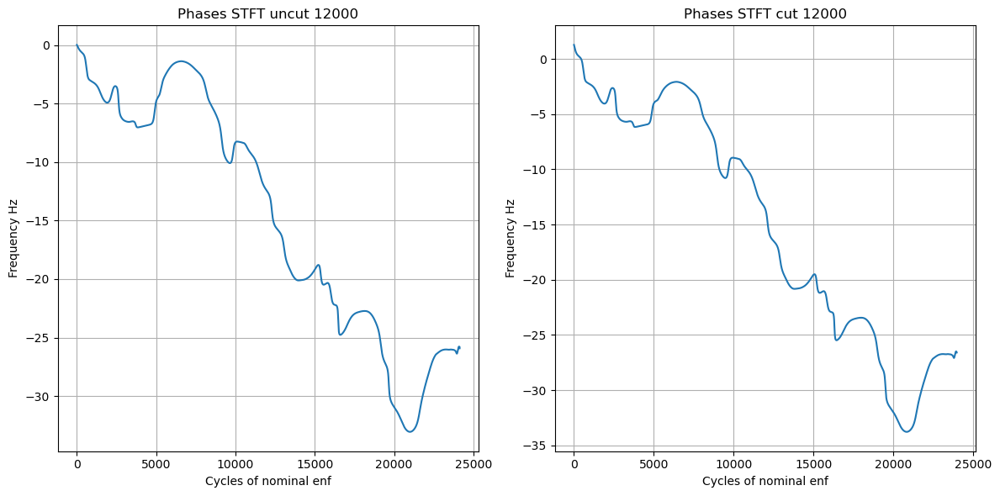

 92%|█████████▏| 24/26 [13:01<01:58, 59.47s/it]

Window Length : 13000


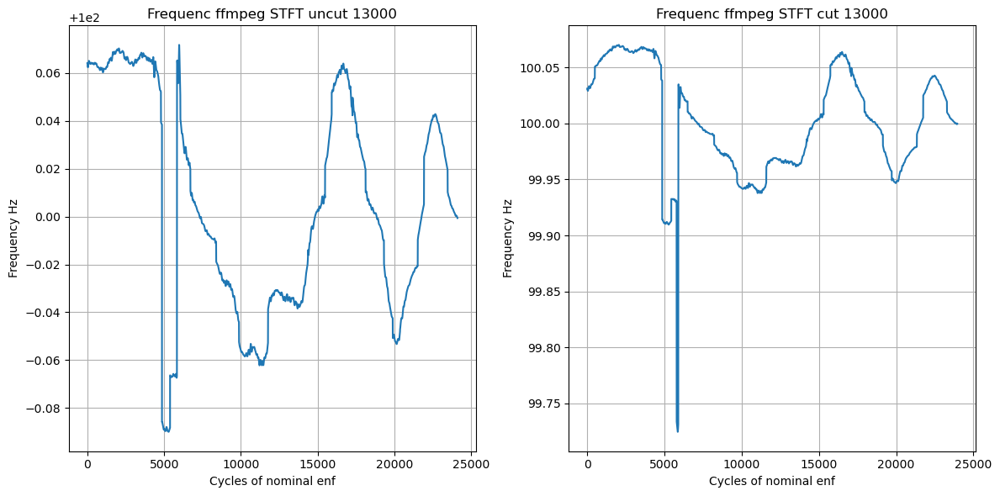

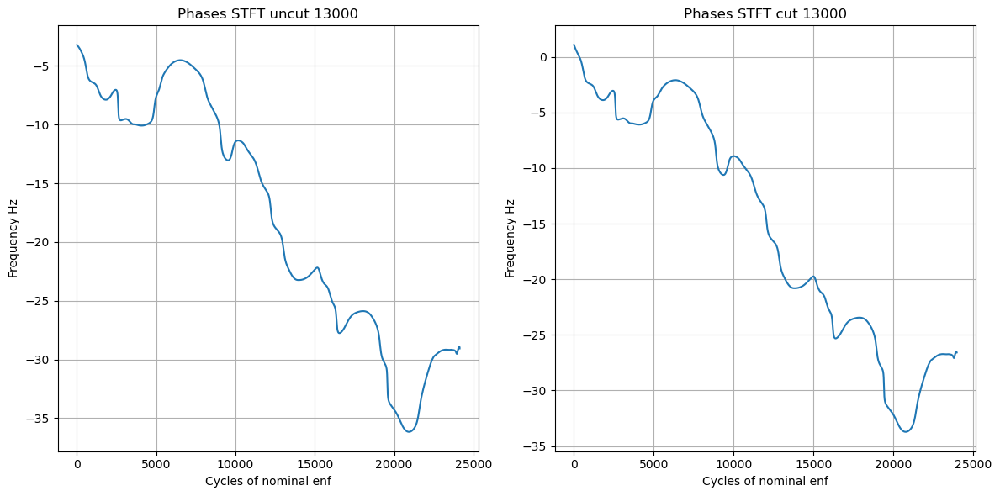

 96%|█████████▌| 25/26 [14:16<01:03, 63.99s/it]

Window Length : 14000


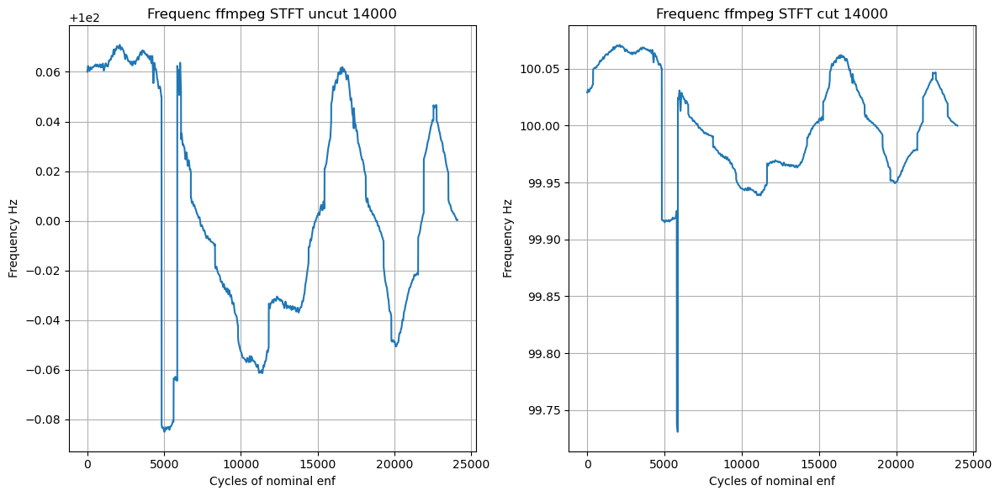

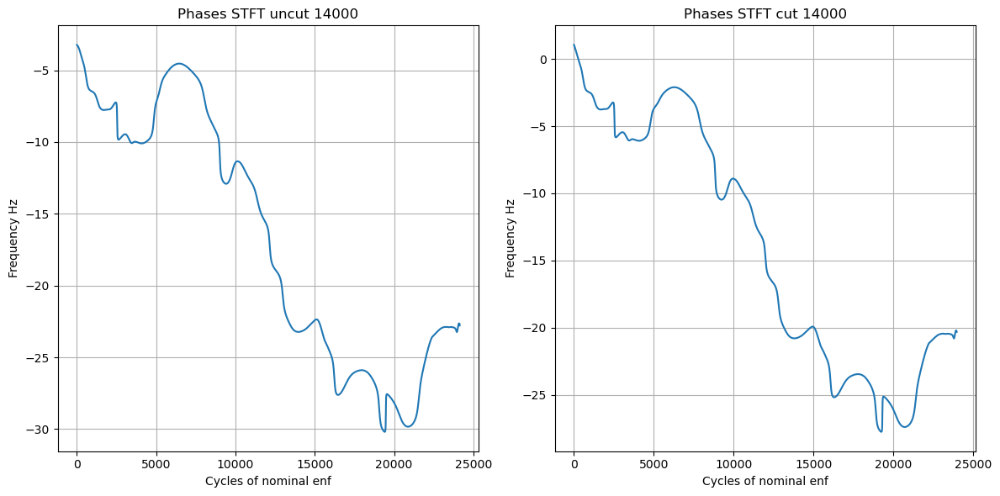

100%|██████████| 26/26 [15:36<00:00, 36.01s/it]


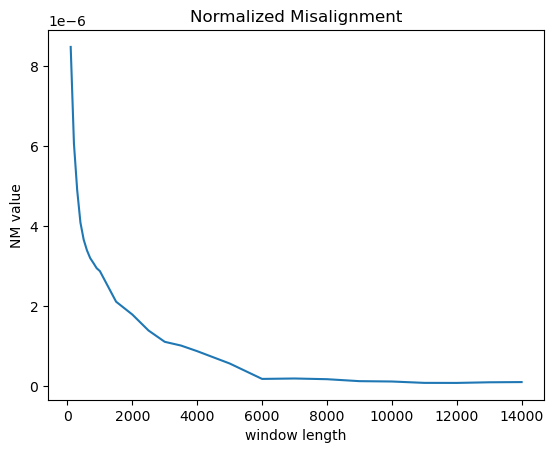

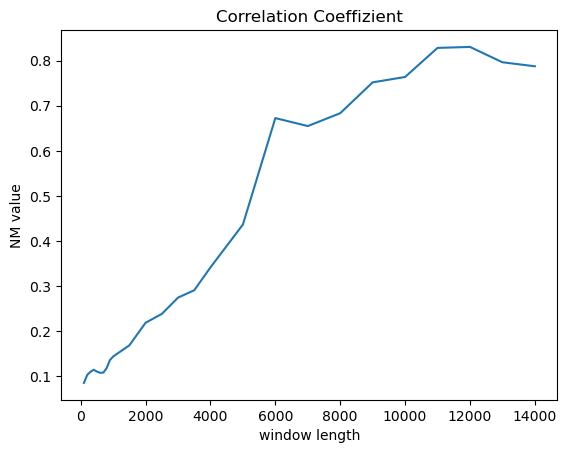

In [6]:
# Window Size comparision
window_arr = [100,200,300,400,500,600,700,800,900,1000,1500,2000,2500,3000,3500,4000,5000,6000,7000,8000,9000,10_000, 11_000, 12_000, 13_000, 14_000]
step_size = 8

lowcut = 99.5
highcut = 100.5
order = 5
down_sample_rate = 400
nominal_enf = 100
k = 0
N_DFT = 20_000

cut_start = 48_584
cut_len = 1331

cut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
cut_data, cut_sample_rate = librosa.load(cut_pth, sr=None)
cut_data = cut_signal(cut_data, cut_start, cut_len)
cut_down_sig_ffmpeg = librosa.resample(cut_data, orig_sr = cut_sample_rate, target_sr = down_sample_rate)
cut_down_sig_ffmpeg = cut_signal(cut_down_sig_ffmpeg, cut_start, cut_len)
cut_band_sig_ffmpeg = bandpass_filter(cut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

uncut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
uncut_data, uncut_sample_rate = librosa.load(uncut_pth, sr=None)
uncut_down_sig_ffmpeg = librosa.resample(uncut_data, orig_sr = uncut_sample_rate, target_sr = down_sample_rate)
uncut_band_sig_ffmpeg = bandpass_filter(uncut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

ref_pth = os.path.join(WUHAN_H1REF_PTH, wuhan_h1ref_files[k])
ref_data, ref_sample_rate = librosa.load(ref_pth, sr=None)
ref_down_sig_ffmpeg = librosa.resample(ref_data, orig_sr=ref_sample_rate, target_sr=down_sample_rate)
ref_band_sig_ffmpeg = bandpass_filter(ref_data, lowcut, highcut, down_sample_rate, order)


NM_values = []
CC_values = []

for i in tqdm(range(len(window_arr))):
    window_len = window_arr[i]
    print(f"Window Length : {window_arr[i]}")

    uncut_freqs = STFT(uncut_band_sig_ffmpeg, down_sample_rate, step_size, window_len)
    cut_freqs = STFT(cut_band_sig_ffmpeg, down_sample_rate, step_size, window_len)
    ref_freqs = STFT(ref_band_sig_ffmpeg , 400, step_size, window_len)
    reduce = len(uncut_freqs)-len(ref_freqs)
    if reduce != 0:
        uncut_freqs = uncut_freqs[:-reduce]

    NM = normalized_misalignment(uncut_freqs, ref_freqs)
    CC = correlation_coeffizient(uncut_freqs, ref_freqs)

    NM_values.append(NM)
    CC_values.append(CC)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot uncut_freqs
    axes[0].plot(uncut_freqs)
    axes[0].set_xlabel("Cycles of nominal enf")
    axes[0].set_ylabel("Frequency Hz")
    axes[0].set_title(f"Frequenc ffmpeg STFT uncut {window_arr[i]}")
    axes[0].grid(True)

    # Plot für cut_freqs
    axes[1].plot(cut_freqs)
    axes[1].set_xlabel("Cycles of nominal enf")
    axes[1].set_ylabel("Frequency Hz")
    axes[1].set_title(f"Frequenc ffmpeg STFT cut {window_arr[i]}")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Cut and uncut phases DFT1
    phases_uncut = segmented_phase_estimation_DFT1(uncut_band_sig_ffmpeg, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
    phases_cut = segmented_phase_estimation_DFT1(cut_band_sig_ffmpeg, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
    
    
    # Plot uncut_freqs
    axes[0].plot(phases_uncut)
    axes[0].set_xlabel("Cycles of nominal enf")
    axes[0].set_ylabel("Frequency Hz")
    axes[0].set_title(f"Phases STFT uncut {window_arr[i]}")
    axes[0].grid(True)

    # Plot für cut_freqs
    axes[1].plot(phases_cut)
    axes[1].set_xlabel("Cycles of nominal enf")
    axes[1].set_ylabel("Frequency Hz")
    axes[1].set_title(f"Phases STFT cut {window_arr[i]}")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


plt.plot(window_arr, NM_values)
plt.xlabel("window length")
plt.ylabel("NM value")
plt.title("Normalized Misalignment")
plt.show()

plt.plot(window_arr, CC_values)
plt.xlabel("window length")
plt.ylabel("NM value")
plt.title("Correlation Coeffizient")
plt.show()

  0%|          | 0/27 [00:00<?, ?it/s]

Window Length : 5


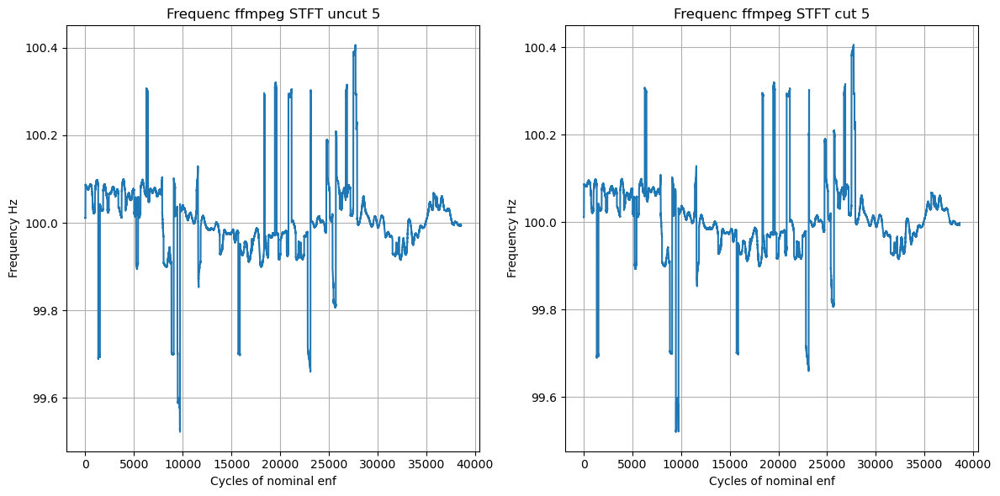

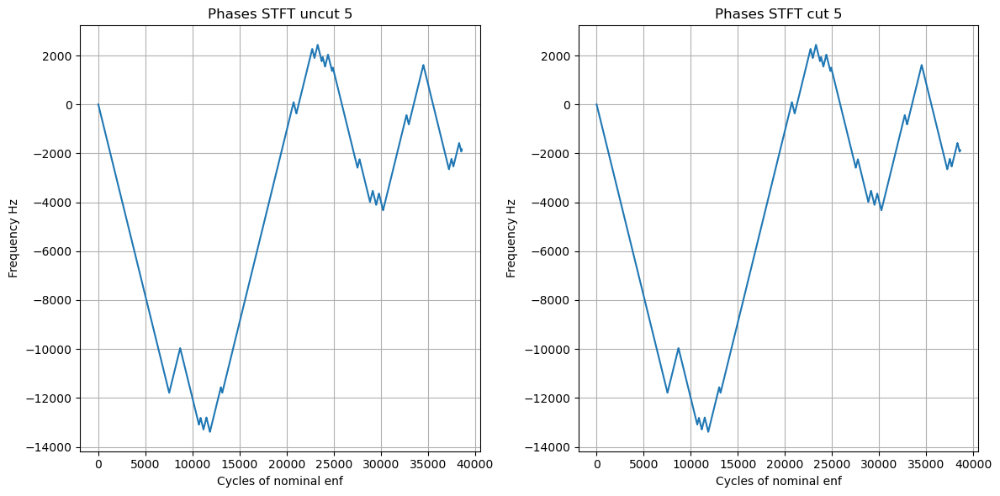

  4%|▎         | 1/27 [00:55<23:58, 55.33s/it]

Window Length : 10


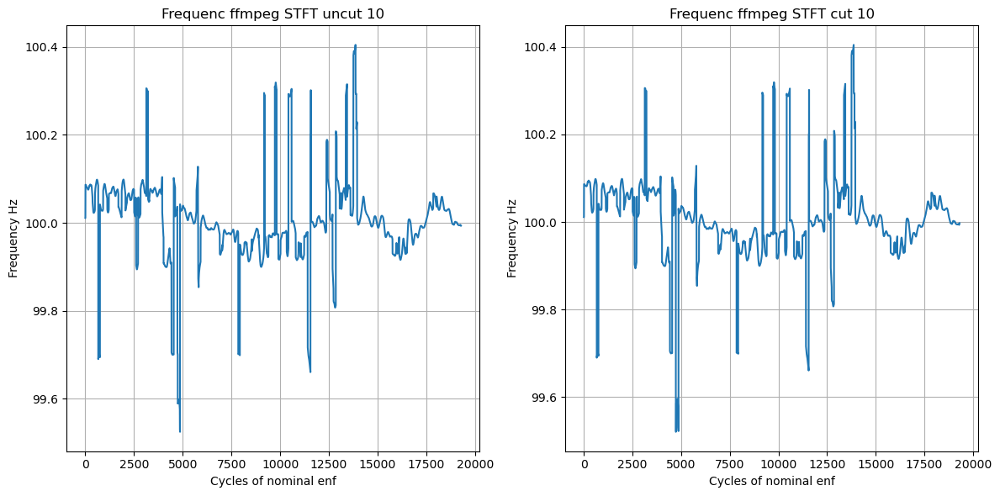

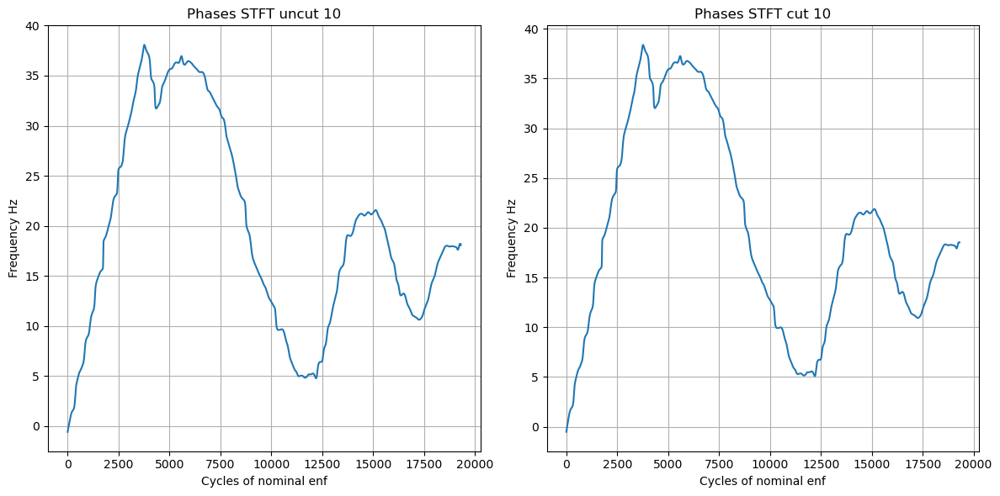

  7%|▋         | 2/27 [01:22<16:04, 38.60s/it]

Window Length : 20


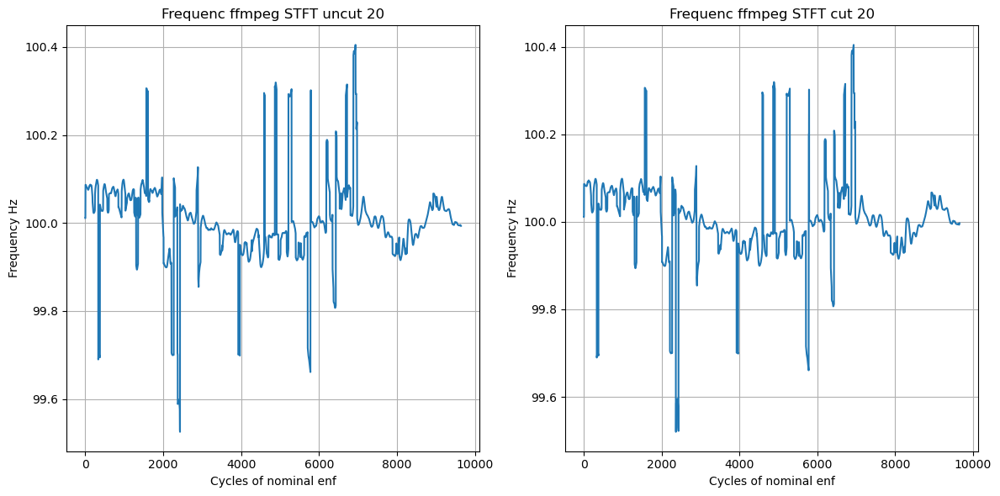

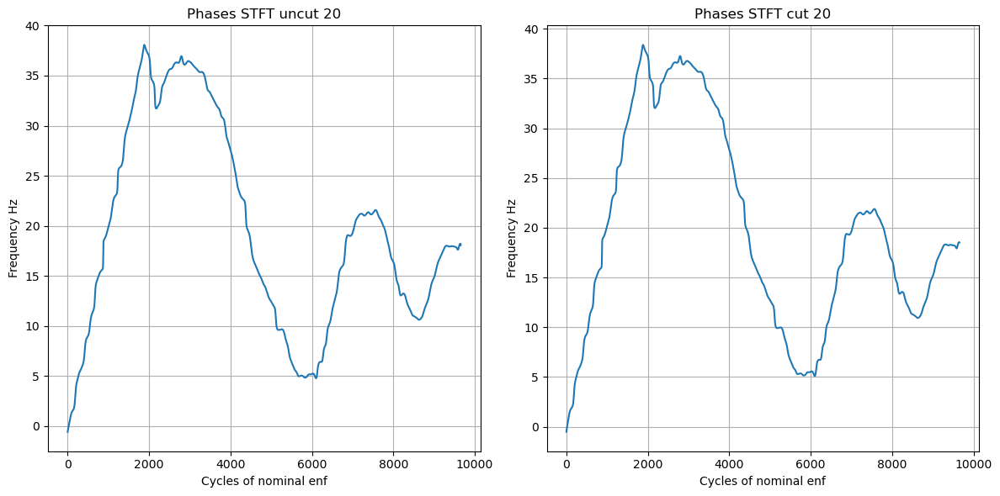

 11%|█         | 3/27 [01:35<10:51, 27.13s/it]

Window Length : 30


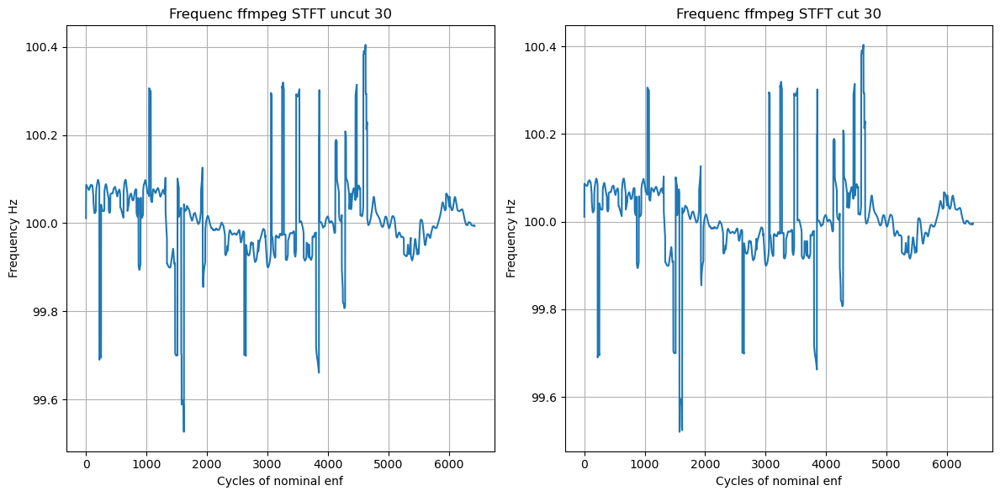

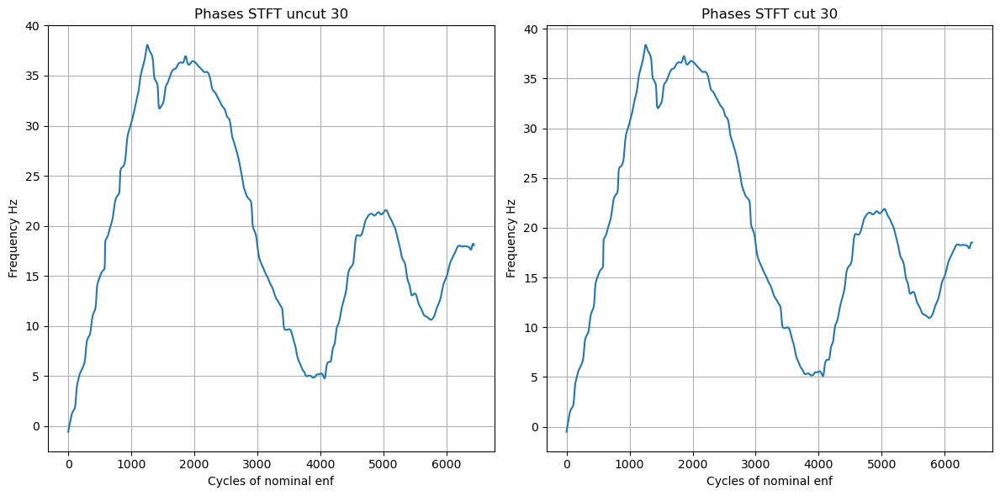

 15%|█▍        | 4/27 [01:44<07:41, 20.06s/it]

Window Length : 40


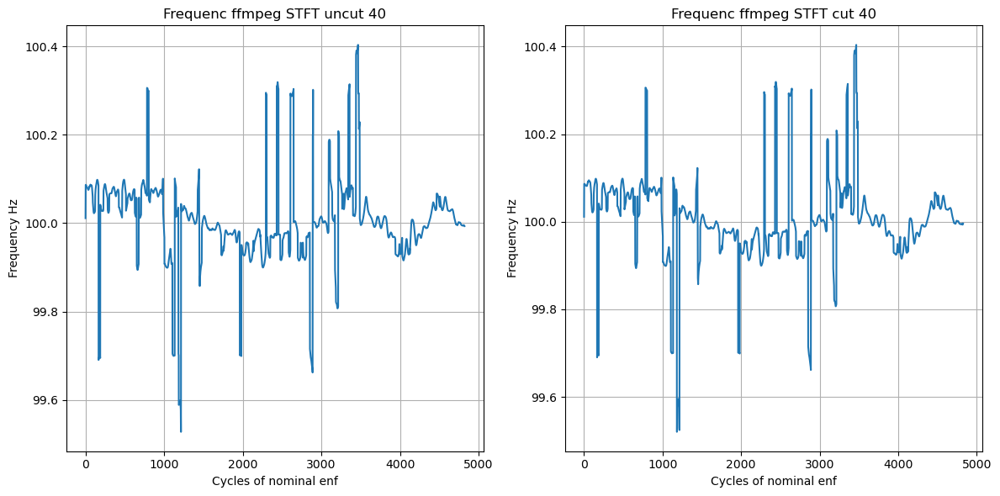

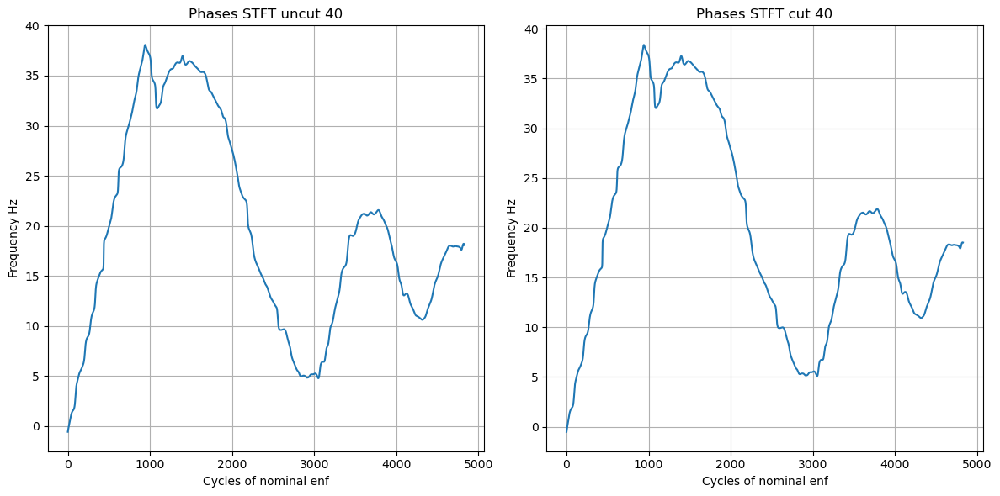

 19%|█▊        | 5/27 [01:51<05:37, 15.33s/it]

Window Length : 50


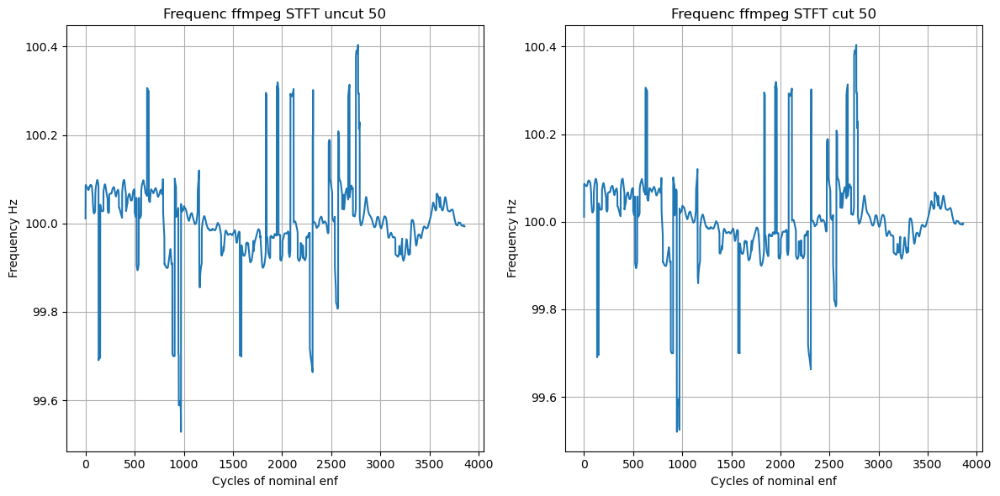

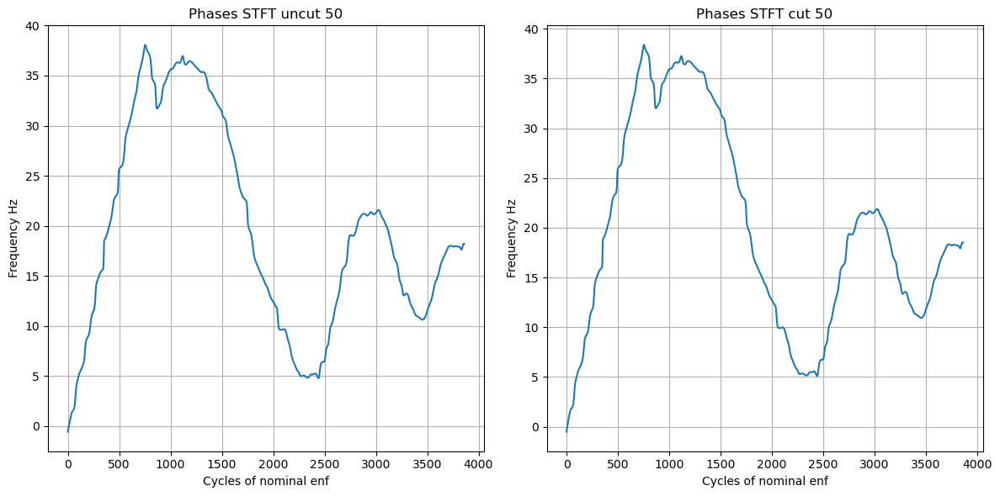

 22%|██▏       | 6/27 [01:57<04:11, 11.99s/it]

Window Length : 60


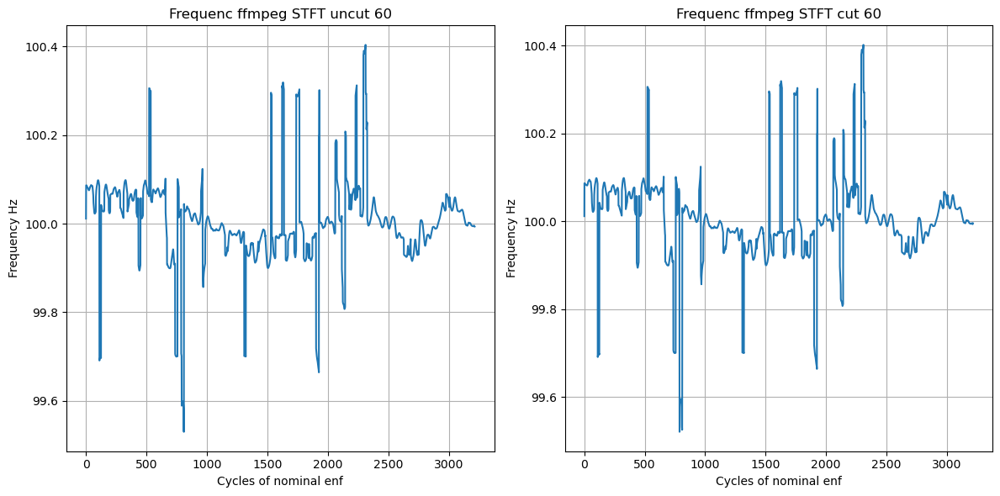

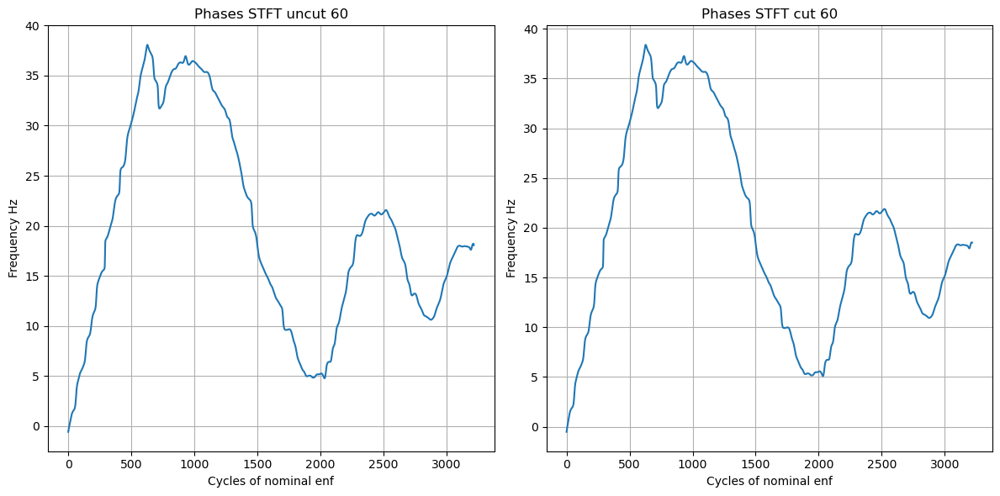

 26%|██▌       | 7/27 [02:01<03:10,  9.51s/it]

Window Length : 70


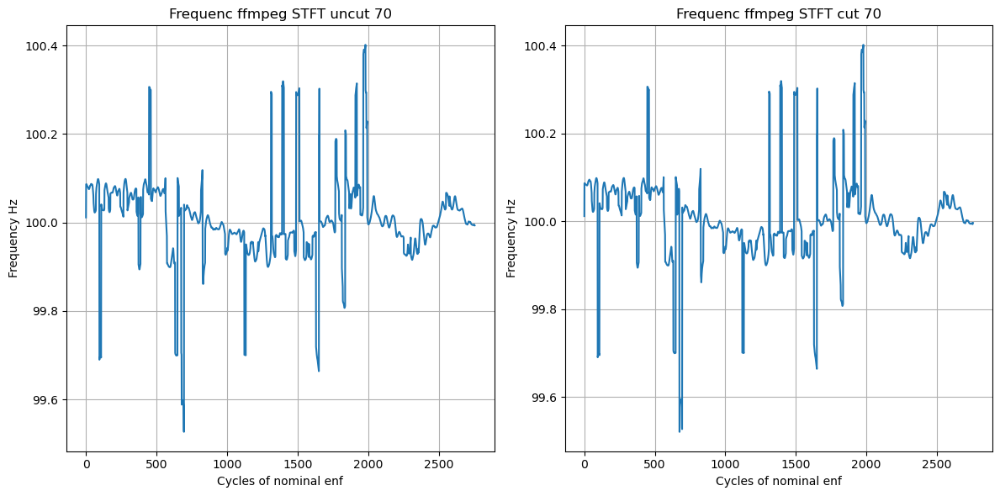

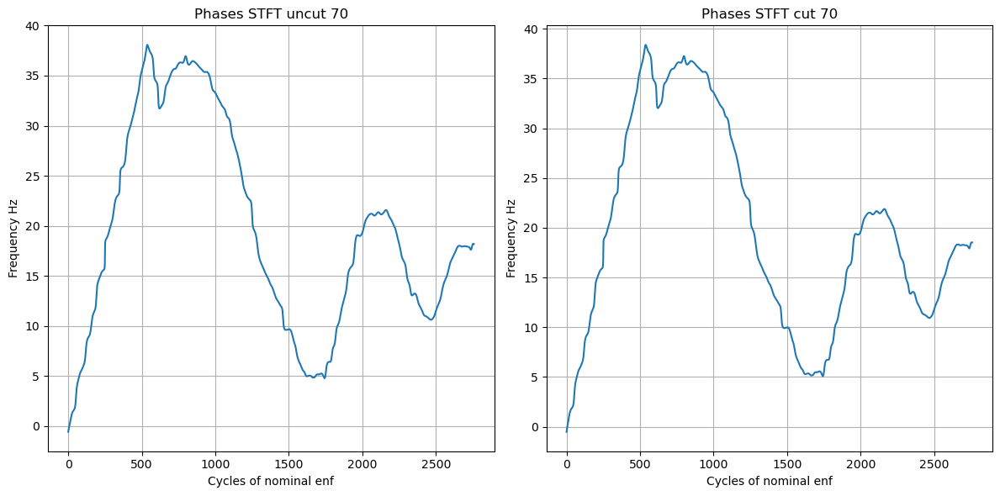

 30%|██▉       | 8/27 [02:05<02:27,  7.77s/it]

Window Length : 80


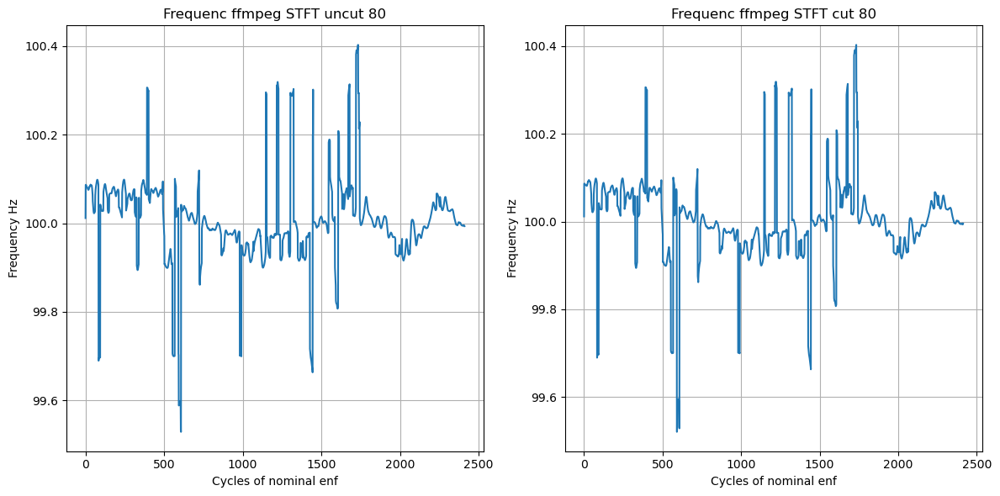

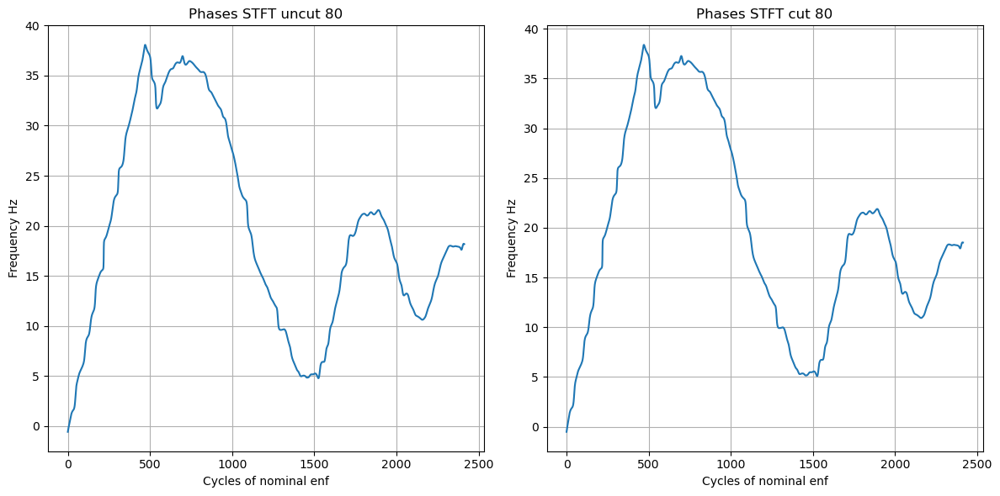

 33%|███▎      | 9/27 [02:09<01:57,  6.50s/it]

Window Length : 90


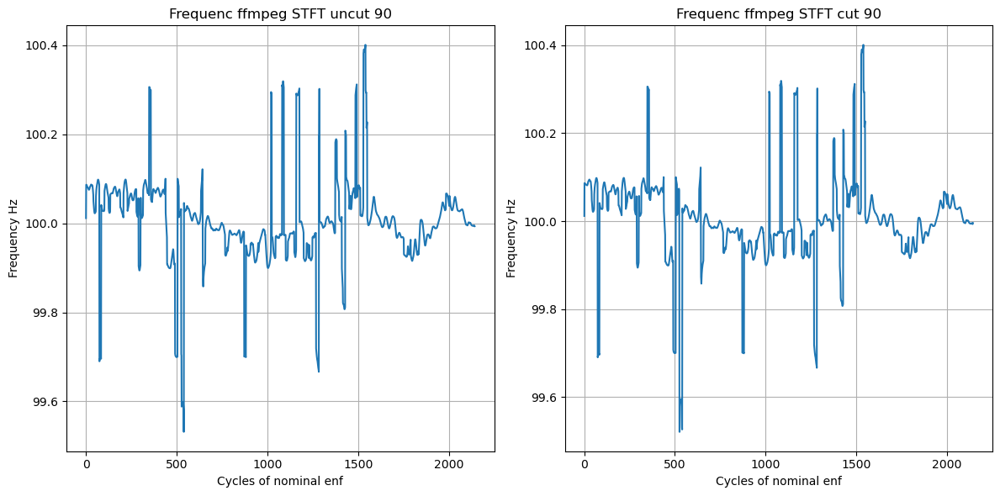

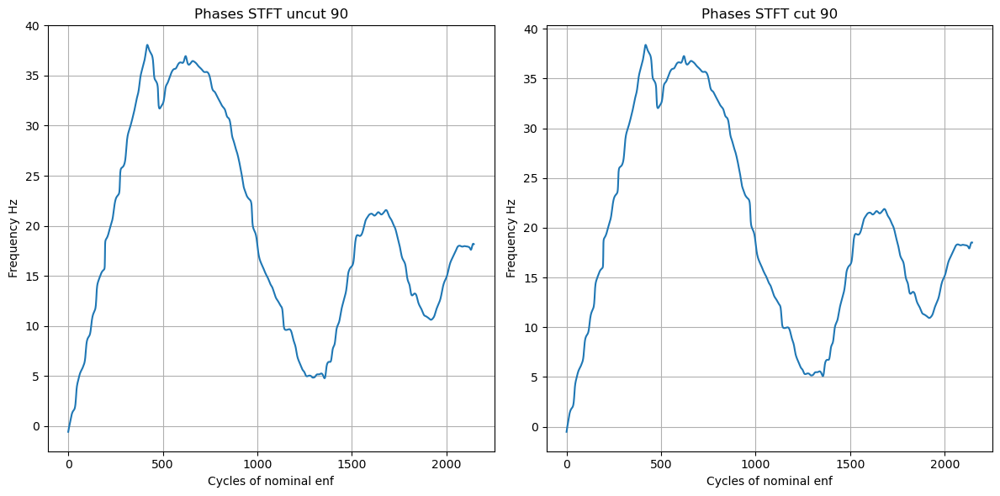

 37%|███▋      | 10/27 [02:12<01:33,  5.53s/it]

Window Length : 100


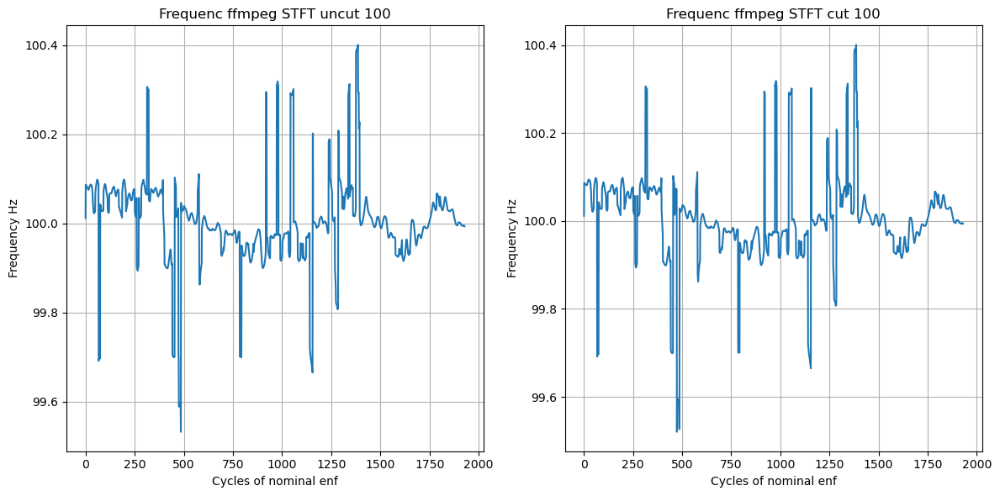

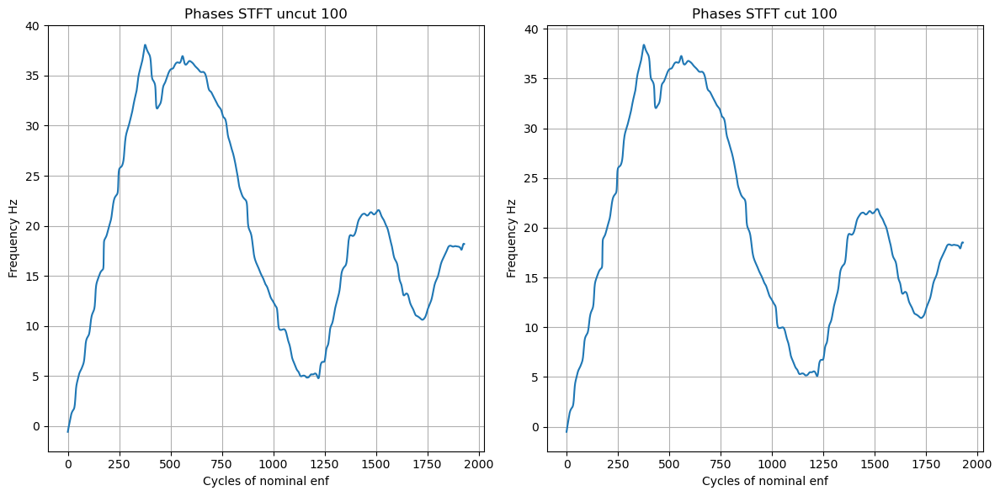

 41%|████      | 11/27 [02:15<01:15,  4.72s/it]

Window Length : 120


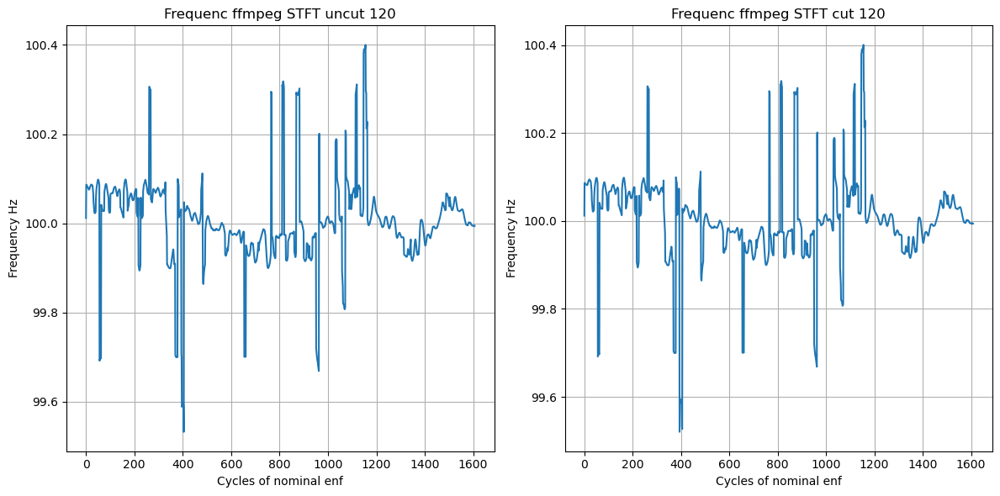

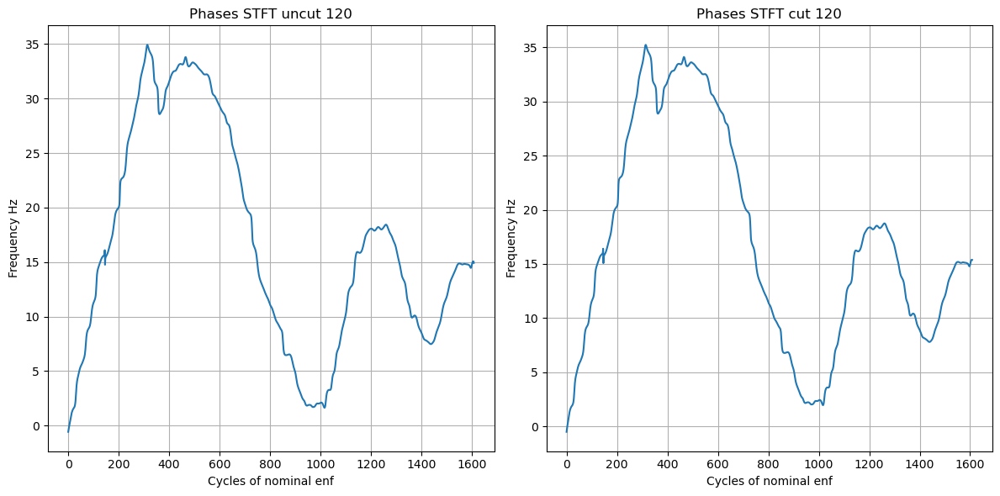

 44%|████▍     | 12/27 [02:18<01:02,  4.14s/it]

Window Length : 140


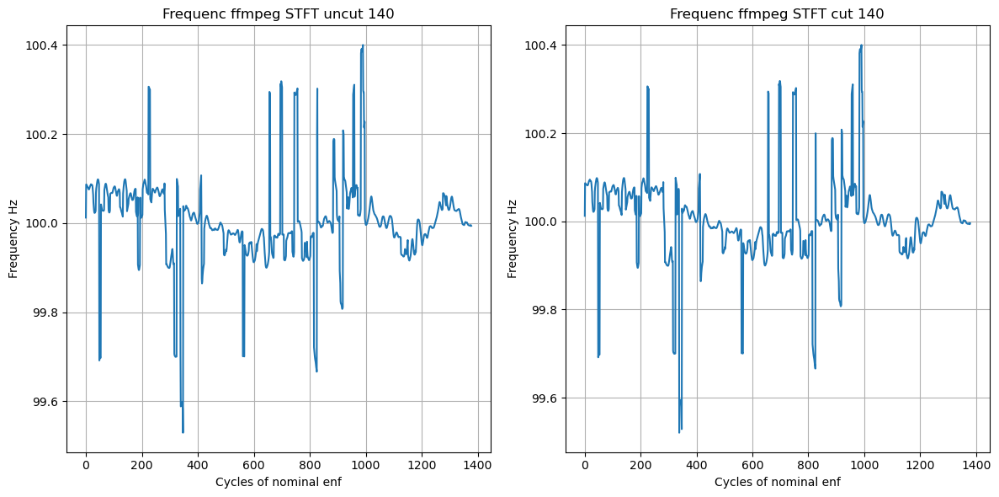

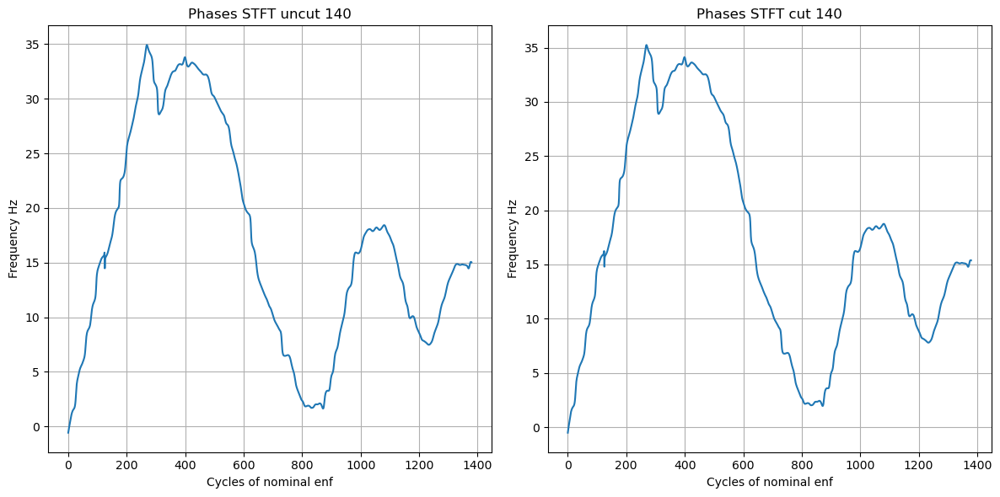

 48%|████▊     | 13/27 [02:20<00:49,  3.55s/it]

Window Length : 160


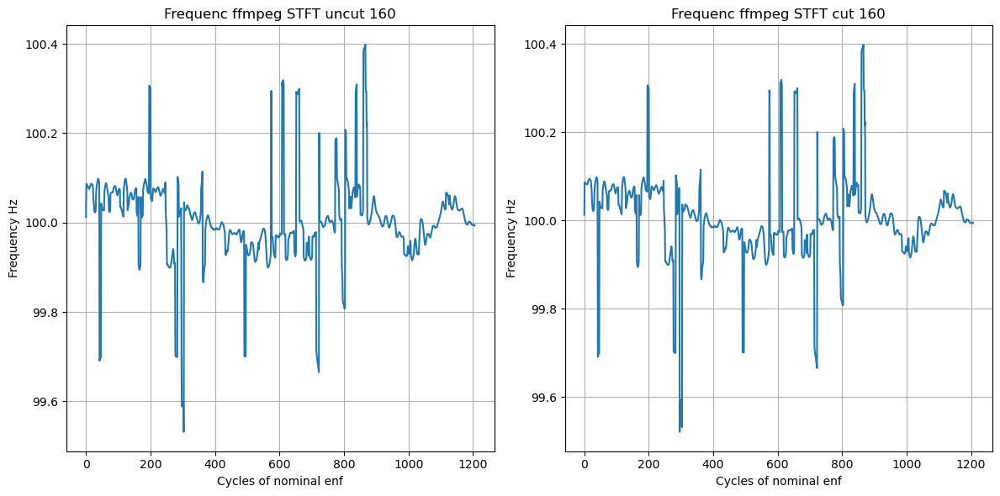

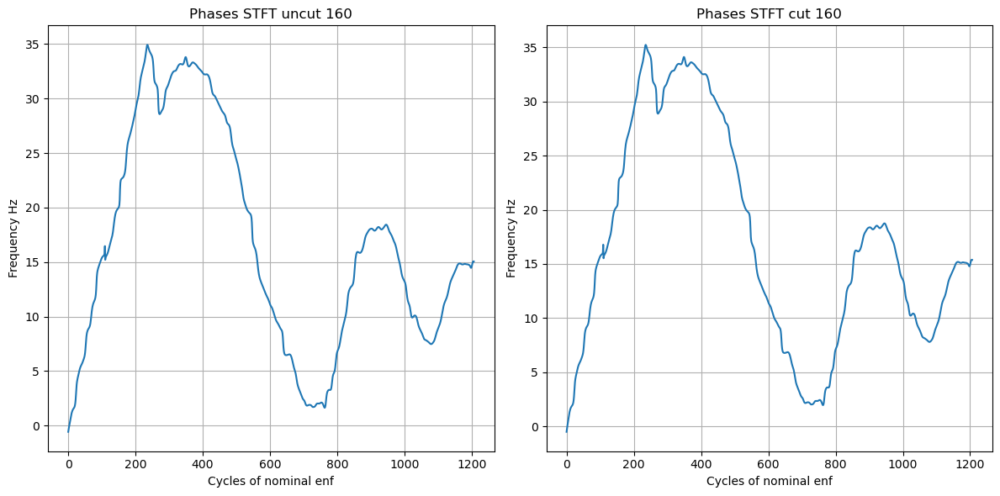

 52%|█████▏    | 14/27 [02:22<00:38,  3.00s/it]

Window Length : 180


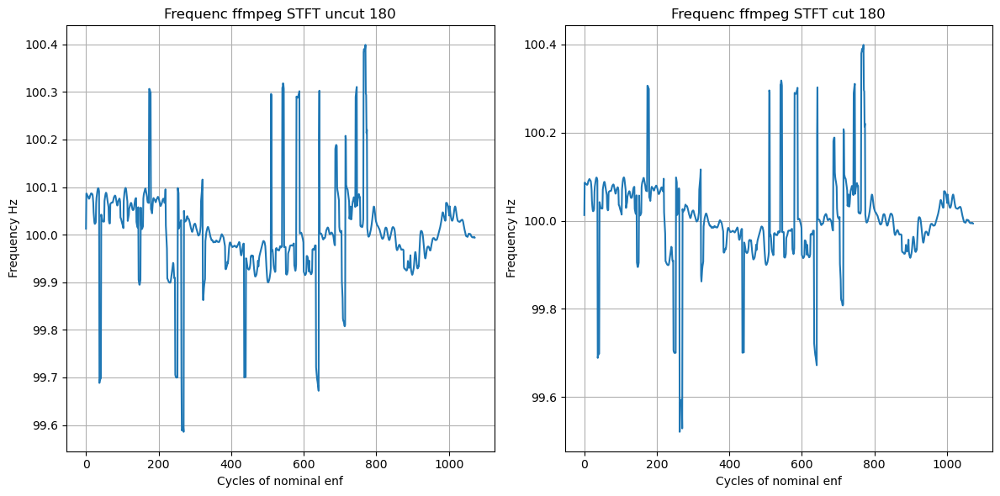

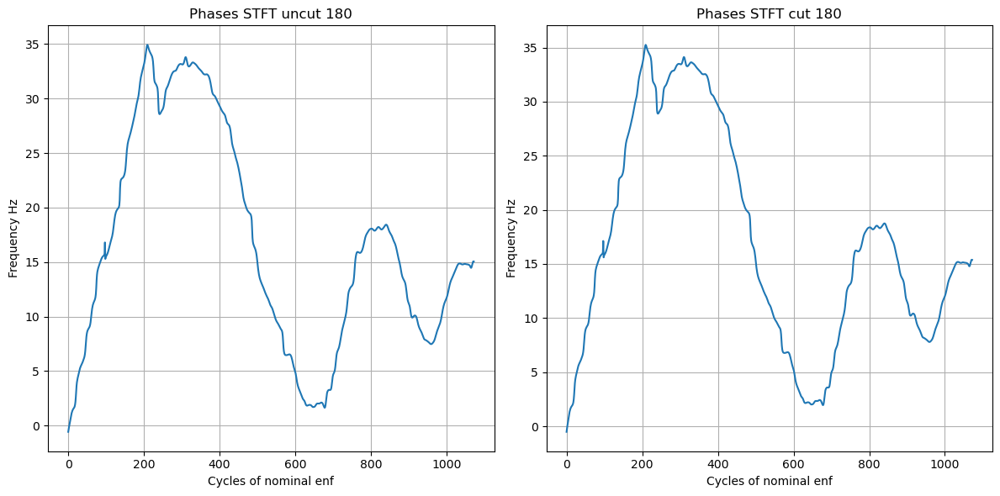

 56%|█████▌    | 15/27 [02:24<00:31,  2.59s/it]

Window Length : 200


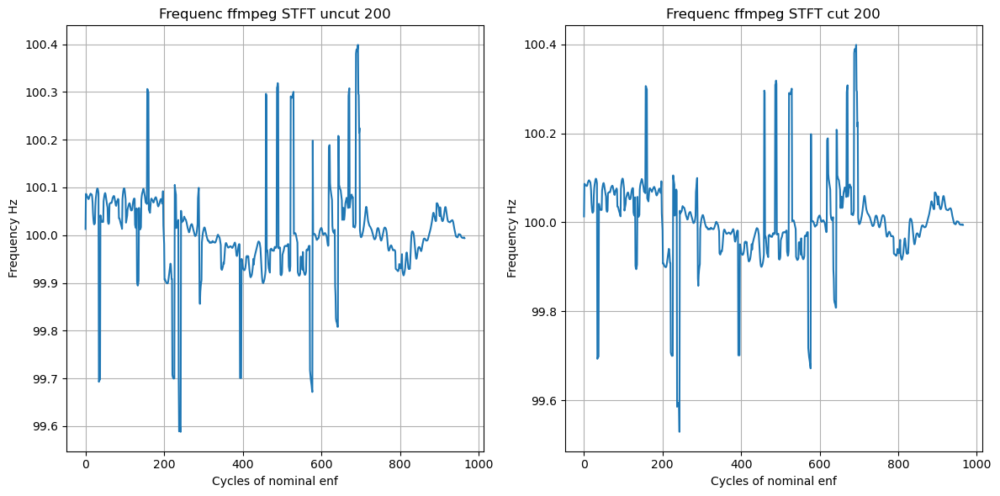

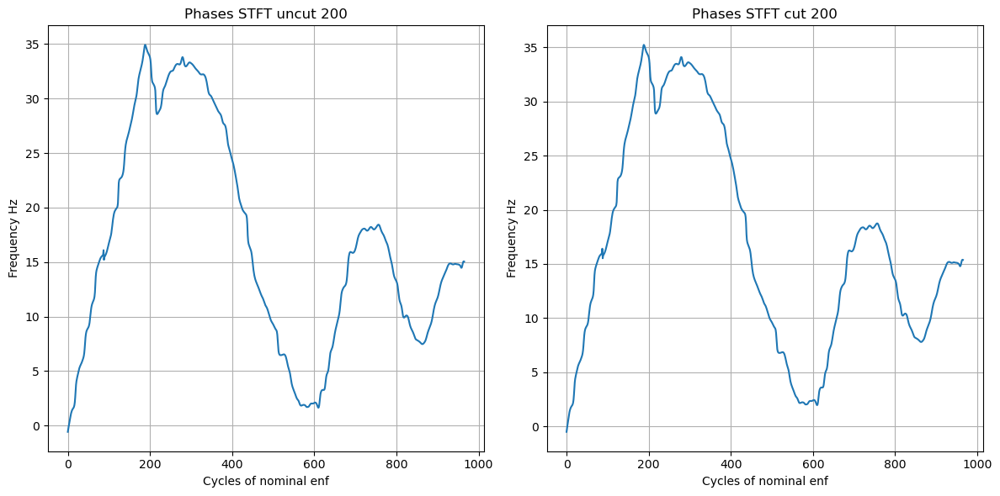

 59%|█████▉    | 16/27 [02:25<00:25,  2.34s/it]

Window Length : 250


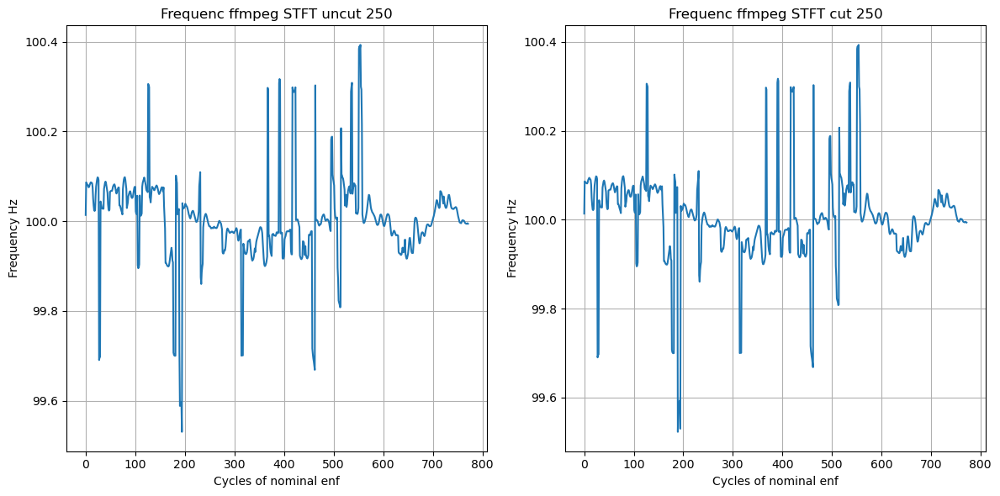

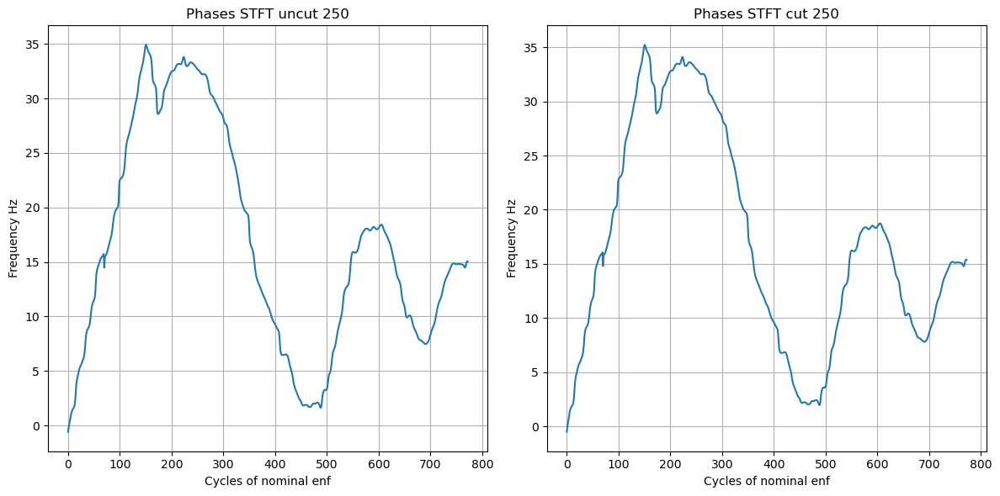

 63%|██████▎   | 17/27 [02:27<00:20,  2.00s/it]

Window Length : 300


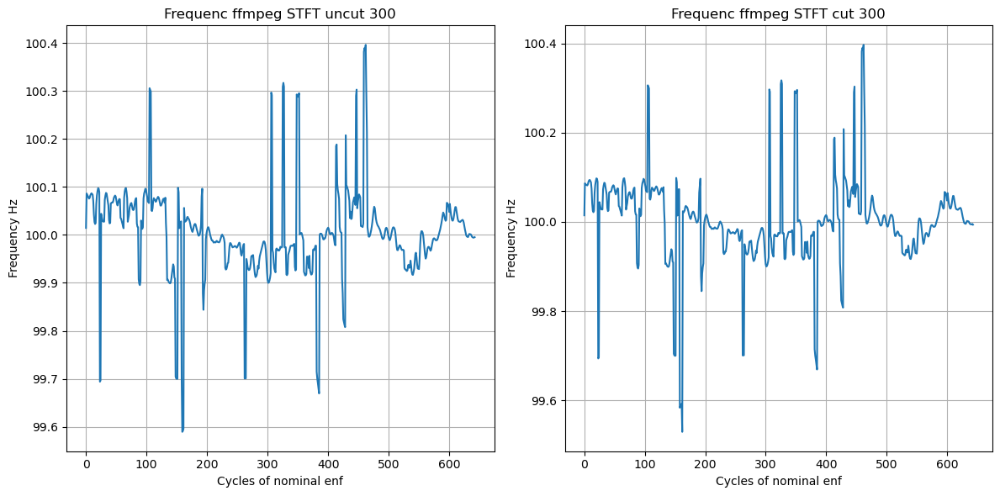

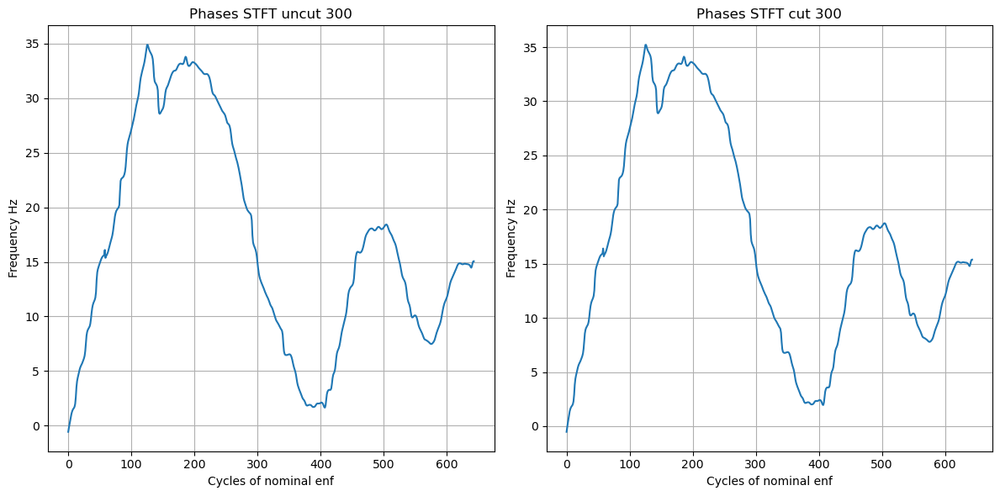

 67%|██████▋   | 18/27 [02:28<00:15,  1.74s/it]

Window Length : 350


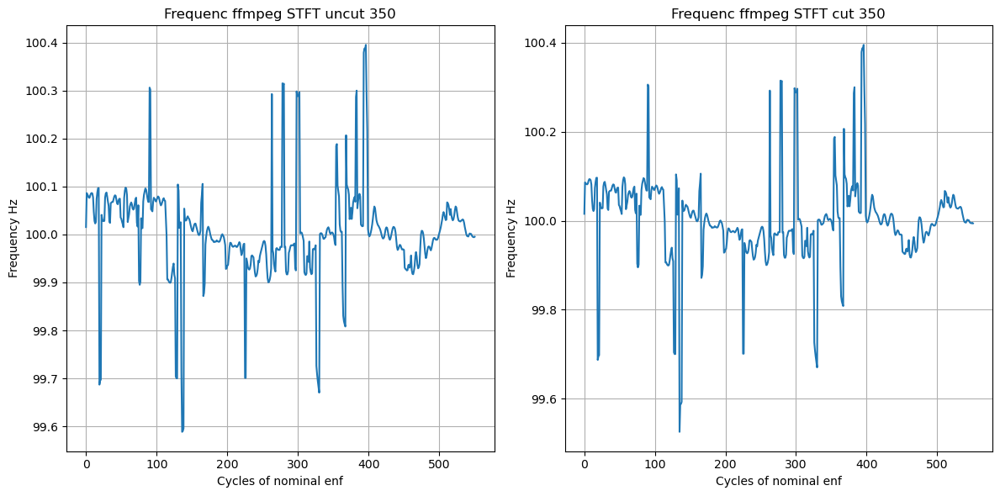

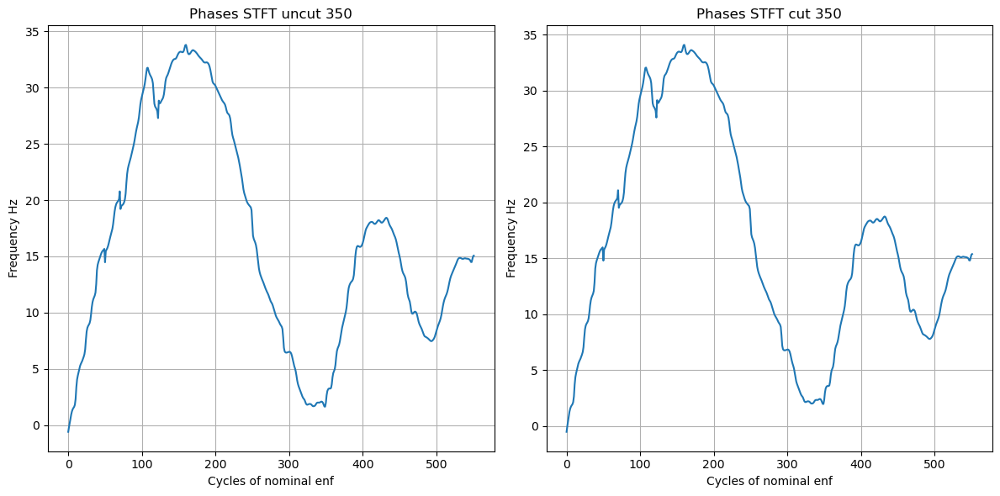

 70%|███████   | 19/27 [02:29<00:12,  1.51s/it]

Window Length : 400


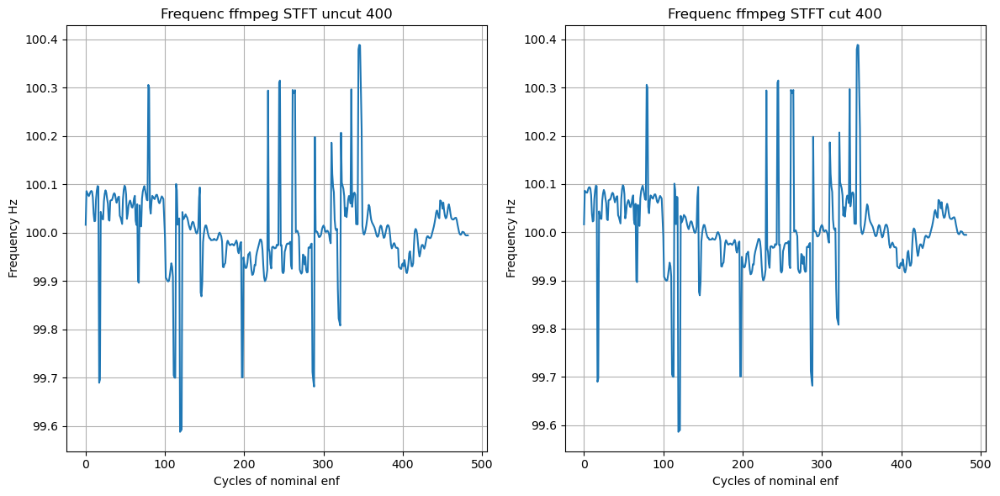

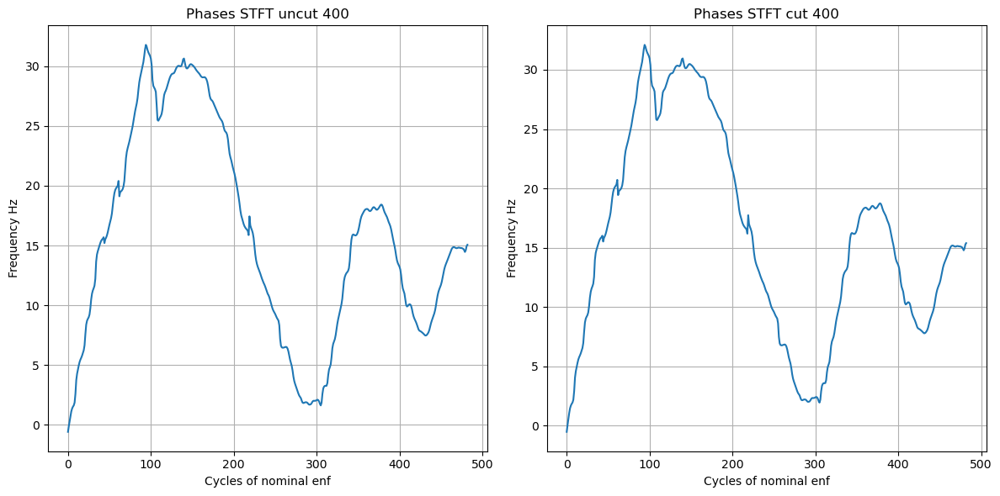

 74%|███████▍  | 20/27 [02:30<00:09,  1.38s/it]

Window Length : 450


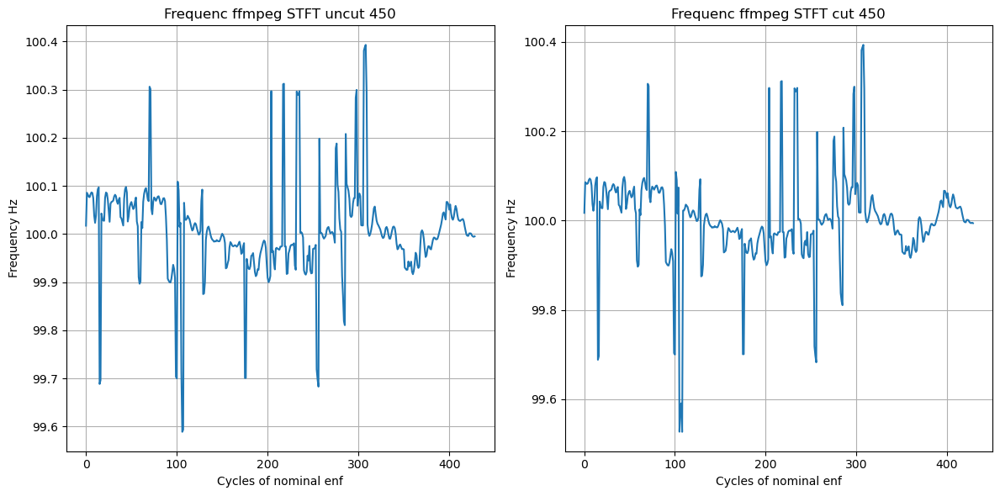

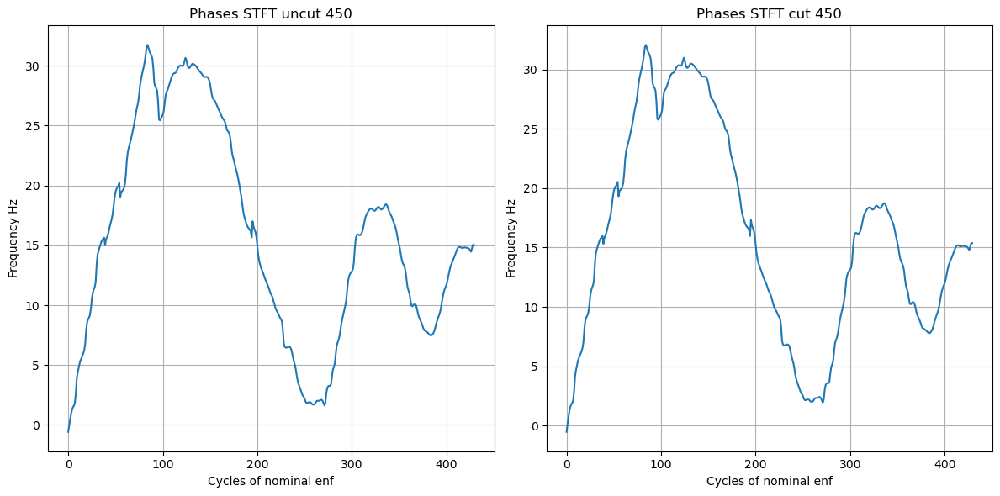

 78%|███████▊  | 21/27 [02:31<00:07,  1.28s/it]

Window Length : 500


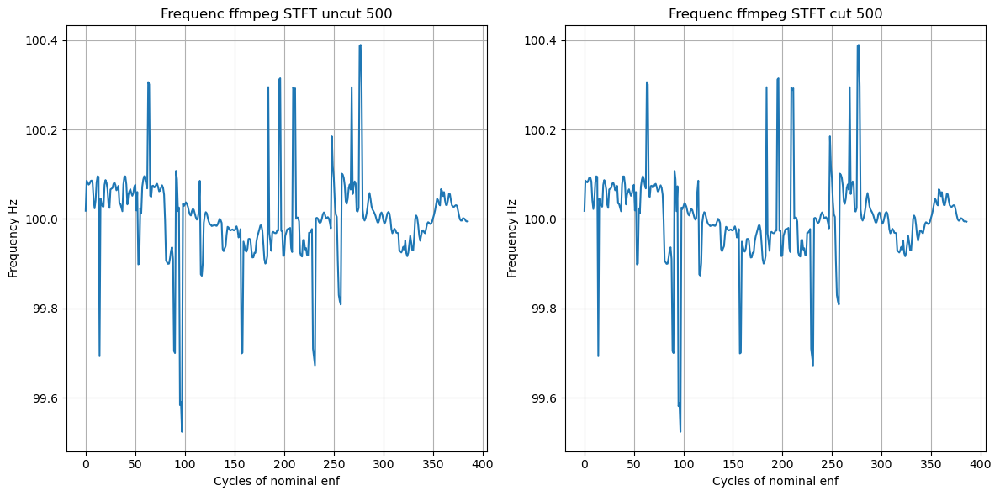

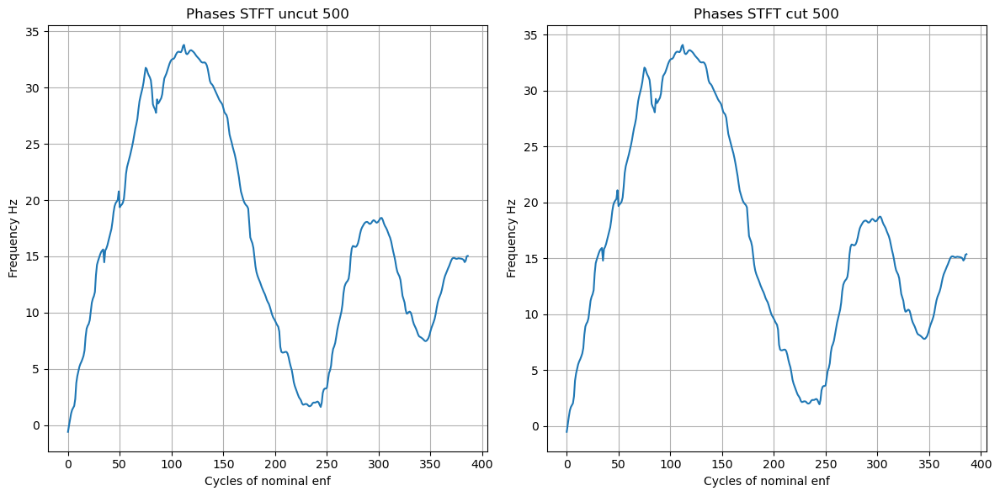

 81%|████████▏ | 22/27 [02:32<00:05,  1.14s/it]

Window Length : 600


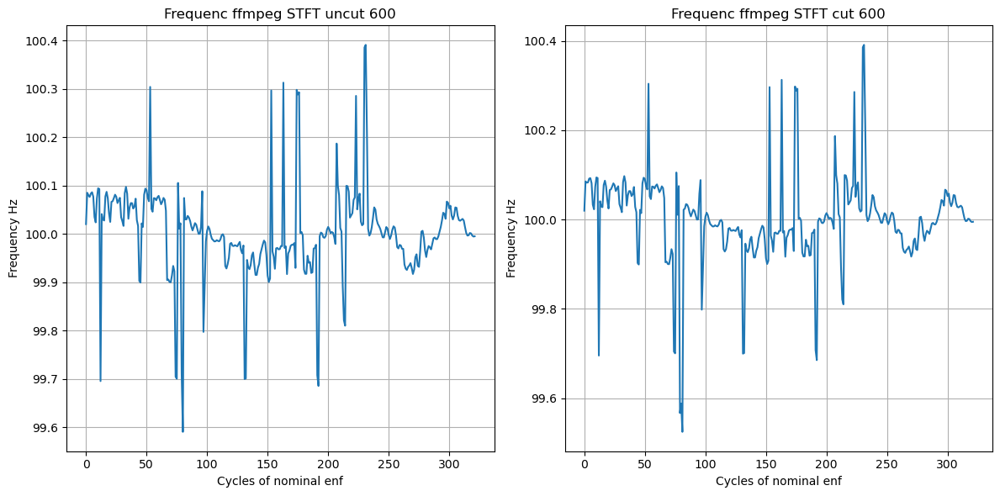

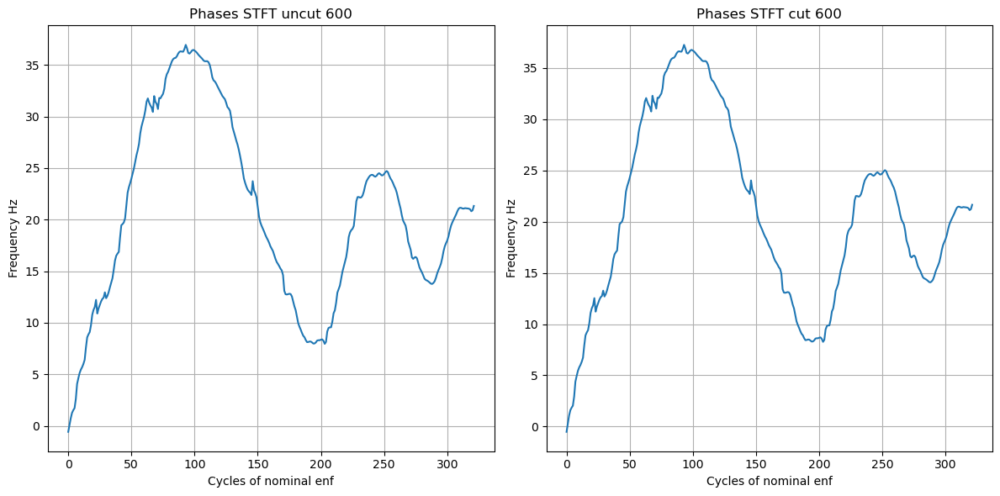

 85%|████████▌ | 23/27 [02:32<00:04,  1.00s/it]

Window Length : 700


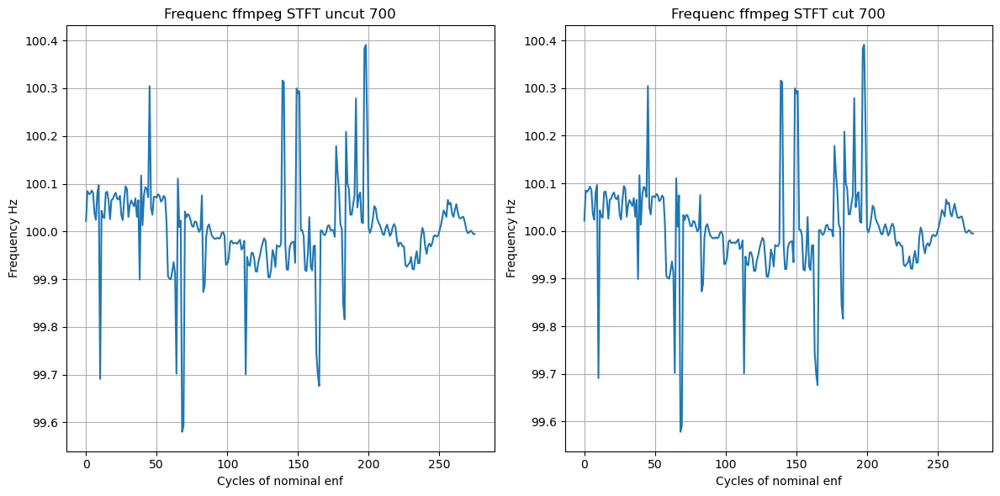

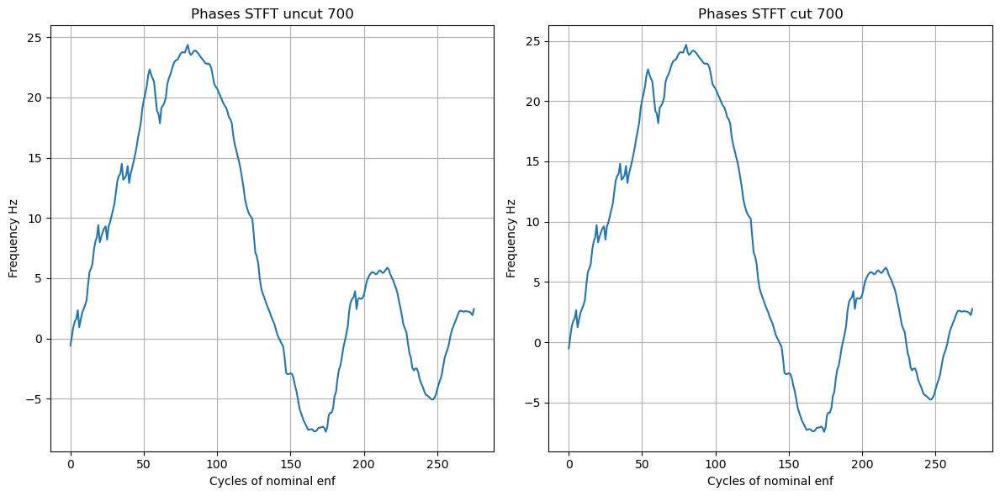

 89%|████████▉ | 24/27 [02:33<00:02,  1.12it/s]

Window Length : 800


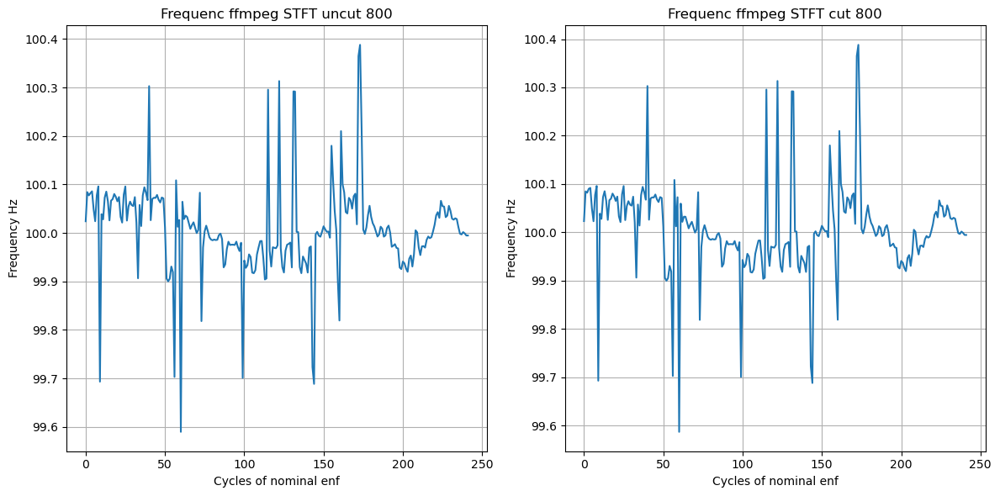

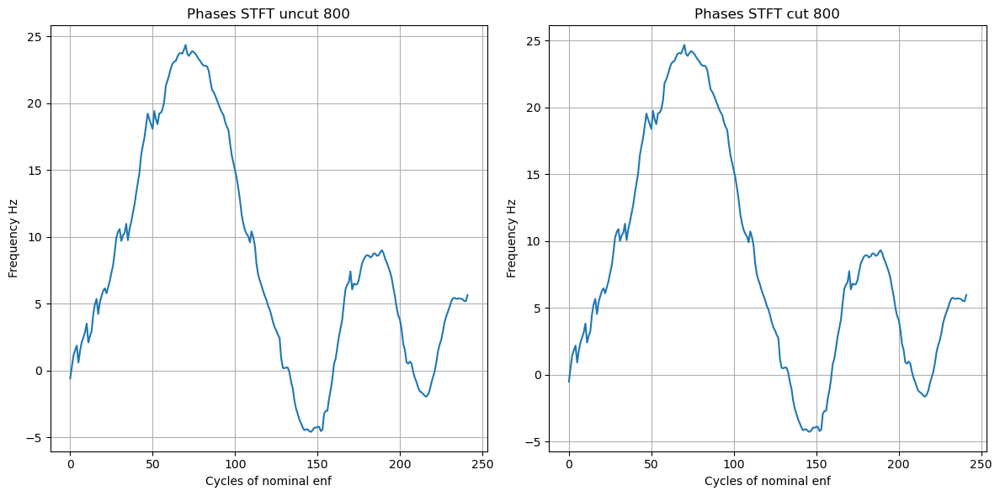

 93%|█████████▎| 25/27 [02:34<00:01,  1.23it/s]

Window Length : 900


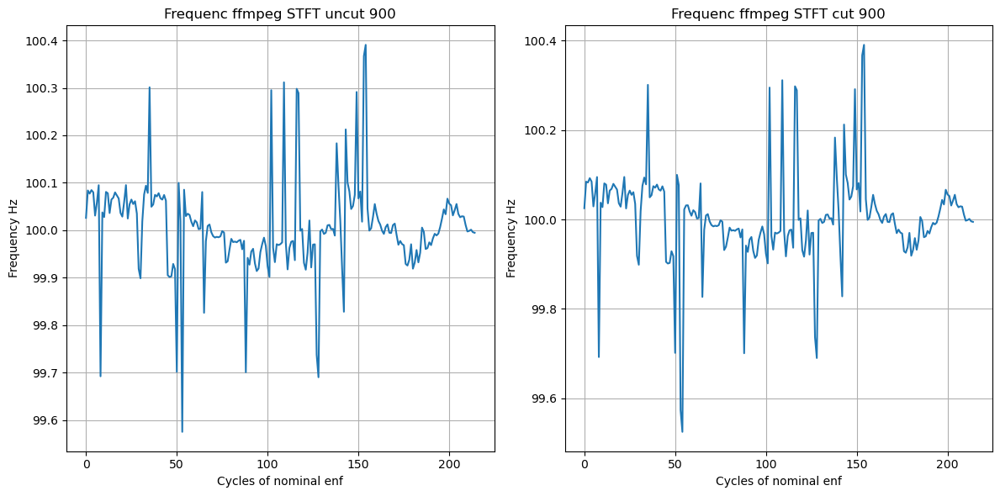

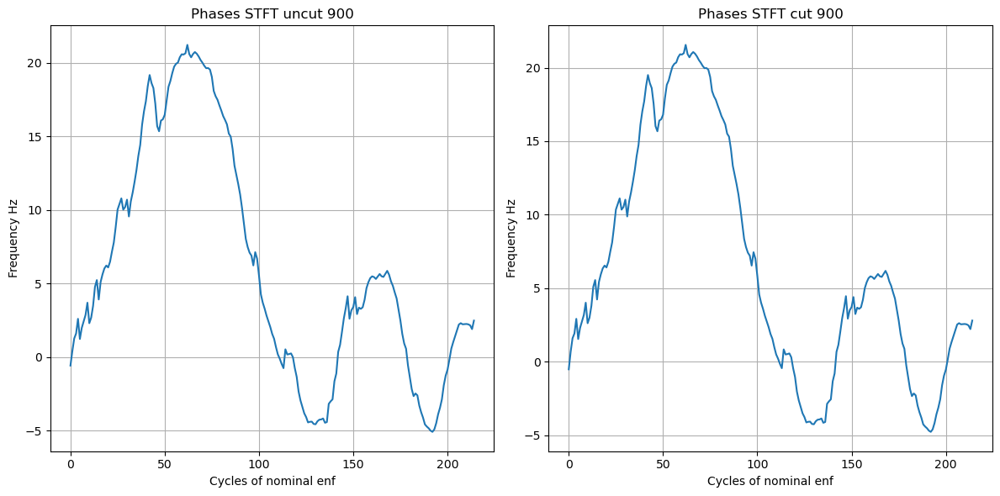

 96%|█████████▋| 26/27 [02:34<00:00,  1.36it/s]

Window Length : 1000


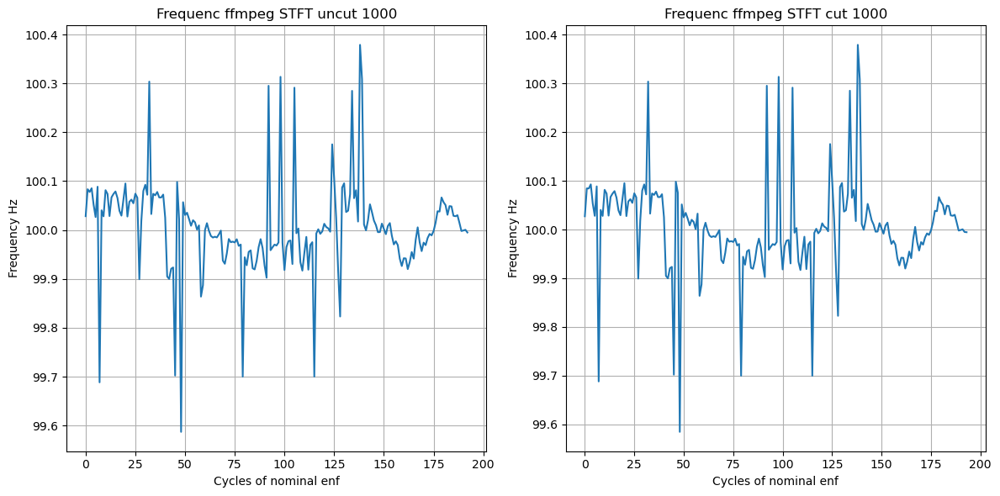

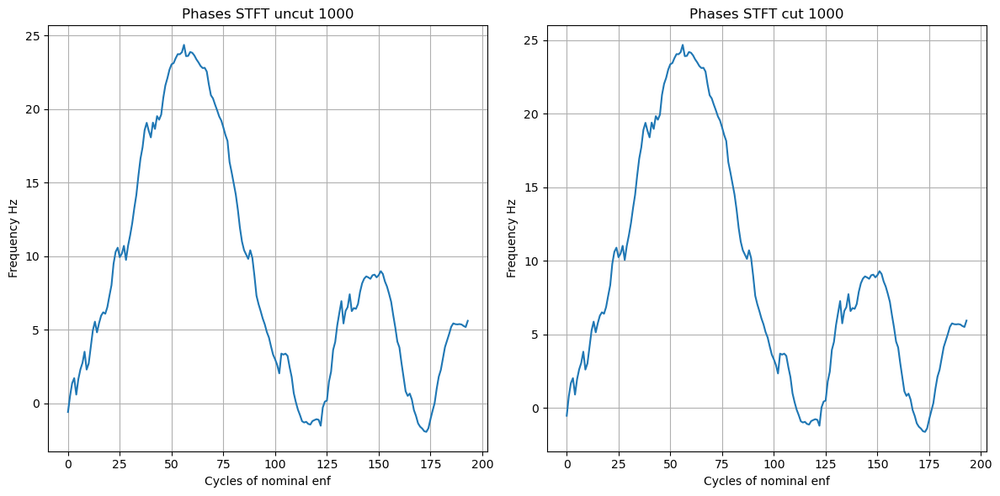

100%|██████████| 27/27 [02:35<00:00,  5.76s/it]


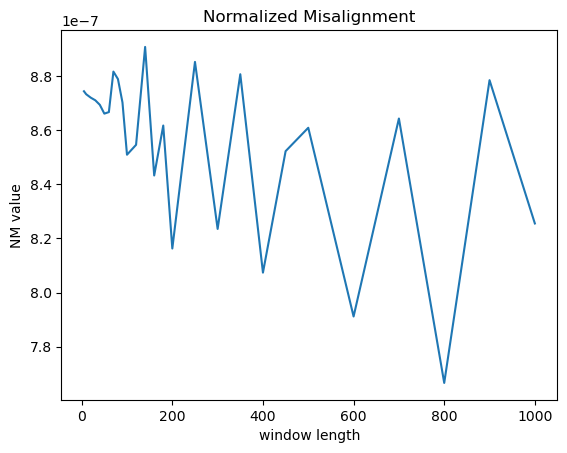

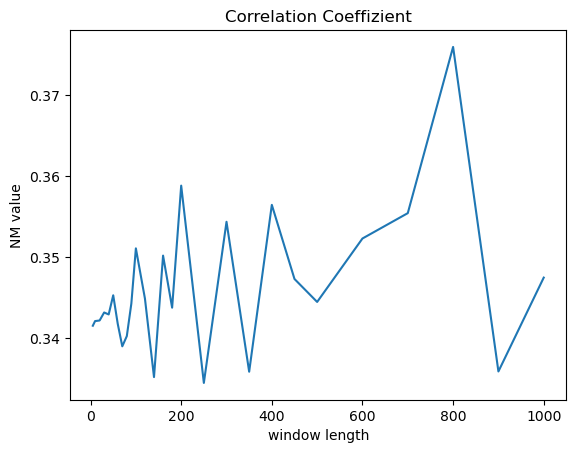

In [40]:
# Window Size comparision
step_size_arr = [5,10,20,30,40,50,60,70,80,90,100,120,140,160,180,200,250,300,350,400,450,500,600,700,800,900,1000]
window_len = 4000

lowcut = 99.5
highcut = 100.5
order = 5
down_sample_rate = 400
nominal_enf = 100
k = 0
N_DFT = 20_000

cut_start = 48_584
cut_len = 4

cut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
cut_data, cut_sample_rate = librosa.load(cut_pth, sr=None)
cut_data = cut_signal(cut_data, cut_start, cut_len)
cut_down_sig_ffmpeg = librosa.resample(cut_data, orig_sr = cut_sample_rate, target_sr = down_sample_rate)
cut_down_sig_ffmpeg = cut_signal(cut_down_sig_ffmpeg, cut_start, cut_len)
cut_band_sig_ffmpeg = bandpass_filter(cut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

uncut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
uncut_data, uncut_sample_rate = librosa.load(uncut_pth, sr=None)
uncut_down_sig_ffmpeg = librosa.resample(uncut_data, orig_sr = uncut_sample_rate, target_sr = down_sample_rate)
uncut_band_sig_ffmpeg = bandpass_filter(uncut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

ref_pth = os.path.join(WUHAN_H1REF_PTH, wuhan_h1ref_files[k])
ref_data, ref_sample_rate = librosa.load(ref_pth, sr=None)
ref_down_sig_ffmpeg = librosa.resample(ref_data, orig_sr=ref_sample_rate, target_sr=down_sample_rate)
ref_band_sig_ffmpeg = bandpass_filter(ref_data, lowcut, highcut, down_sample_rate, order)

NM_values = []
CC_values = []

for i in tqdm(range(len(step_size_arr))):
    step_size = step_size_arr[i]
    print(f"Window Length : {step_size_arr[i]}")

    uncut_freqs = STFT(uncut_band_sig_ffmpeg, down_sample_rate, step_size, window_len)
    cut_freqs = STFT(cut_band_sig_ffmpeg, down_sample_rate, step_size, window_len)
    ref_freqs = STFT(ref_band_sig_ffmpeg , 400, step_size, window_len)
    reduce = len(uncut_freqs)-len(ref_freqs)
    if reduce != 0:
        uncut_freqs = uncut_freqs[:-reduce]

    NM = normalized_misalignment(uncut_freqs, ref_freqs)
    CC = correlation_coeffizient(uncut_freqs, ref_freqs)

    NM_values.append(NM)
    CC_values.append(CC)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot uncut_freqs
    axes[0].plot(uncut_freqs)
    axes[0].set_xlabel("Cycles of nominal enf")
    axes[0].set_ylabel("Frequency Hz")
    axes[0].set_title(f"Frequenc ffmpeg STFT uncut {step_size_arr[i]}")
    axes[0].grid(True)

    # Plot für cut_freqs
    axes[1].plot(cut_freqs)
    axes[1].set_xlabel("Cycles of nominal enf")
    axes[1].set_ylabel("Frequency Hz")
    axes[1].set_title(f"Frequenc ffmpeg STFT cut {step_size_arr[i]}")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Cut and uncut phases DFT1
    phases_uncut = segmented_phase_estimation_DFT1(uncut_band_sig_ffmpeg, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
    phases_cut = segmented_phase_estimation_DFT1(cut_band_sig_ffmpeg, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
    
    
    # Plot uncut_freqs
    axes[0].plot(phases_uncut)
    axes[0].set_xlabel("Cycles of nominal enf")
    axes[0].set_ylabel("Frequency Hz")
    axes[0].set_title(f"Phases STFT uncut {step_size_arr[i]}")
    axes[0].grid(True)

    # Plot für cut_freqs
    axes[1].plot(phases_cut)
    axes[1].set_xlabel("Cycles of nominal enf")
    axes[1].set_ylabel("Frequency Hz")
    axes[1].set_title(f"Phases STFT cut {step_size_arr[i]}")
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()


plt.plot(step_size_arr, NM_values)
plt.xlabel("window length")
plt.ylabel("NM value")
plt.title("Normalized Misalignment")
plt.show()

plt.plot(step_size_arr, CC_values)
plt.xlabel("window length")
plt.ylabel("NM value")
plt.title("Correlation Coeffizient")
plt.show()

In [1]:
# RFA Tau Test
tau = [10, 50, 100, 200, 300, 400, 500, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750, 3000, 3250, 3500, 3750, 4000]
I = 3
epsilon = 1e-20

#Bandpass Filter
lowcut = 99.5
highcut = 100.5
order = 5
down_sample_rate = 400
nominal_enf = 100
k = 0
N_DFT = 20_000

#Cut
cut_start = 48_584
cut_len = 4891

step_size = 8
window_len = 3201

cut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
cut_data, cut_sample_rate = librosa.load(cut_pth, sr=None)
cut_data = cut_signal(cut_data, cut_start, cut_len)
cut_down_sig_ffmpeg = librosa.resample(cut_data, orig_sr = cut_sample_rate, target_sr = down_sample_rate)
cut_down_sig_ffmpeg = cut_signal(cut_down_sig_ffmpeg, cut_start, cut_len)
cut_band_sig_ffmpeg = bandpass_filter(cut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

uncut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
uncut_data, uncut_sample_rate = librosa.load(uncut_pth, sr=None)
uncut_down_sig_ffmpeg = librosa.resample(uncut_data, orig_sr = uncut_sample_rate, target_sr = down_sample_rate)
uncut_band_sig_ffmpeg = bandpass_filter(uncut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

ref_pth = os.path.join(WUHAN_H1REF_PTH, wuhan_h1ref_files[k])
ref_data, ref_sample_rate = librosa.load(ref_pth, sr=None)
ref_down_sig_ffmpeg = librosa.resample(ref_data, orig_sr=ref_sample_rate, target_sr=down_sample_rate)
ref_band_sig_ffmpeg = bandpass_filter(ref_data, lowcut, highcut, down_sample_rate, order)

NM_DFT1 = []
CC_DFT1 = []
NM_STFT = []
CC_STFT = []


for j in tqdm(range(len(tau))):
    tau_val = tau[j]
    print(f"Tau : {tau_val}")

    print("BEGIN RFA DFT1")
    cut_denoised_arr_DFT1, cut_freqs_arr_DFT1  = RFA_DFT1(cut_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, step_size, window_len, N_DFT)
    uncut_denoised_arr_DFT1, uncut_freqs_arr_DFT1 = RFA_DFT1(uncut_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, step_size, window_len, N_DFT)
    ref_denoised_arr_DFT1, ref_freqs_arr_DFT1 = RFA_DFT1(ref_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, step_size, window_len, N_DFT)
    
    print("BEGIN RFA STFT")
    cut_denoised_arr_STFT, cut_freqs_arr_STFT  = RFA_STFT(cut_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, window_len, step_size)
    uncut_denoised_arr_STFT, uncut_freqs_arr_STFT = RFA_STFT(uncut_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, window_len, step_size)
    ref_denoised_arr_STFT, ref_freqs_arr_STFT = RFA_STFT(ref_band_sig_ffmpeg, down_sample_rate, tau_val, I, nominal_enf, window_len, step_size)
    
    DFT1_NM_arr = []
    DFT1_CC_arr = []
    STFT_NM_arr = []
    STFT_CC_arr = []

    print("BEGIN WITH TAU")
    for i in tqdm(range(I)):

        cut_denoised_DFT1 = cut_freqs_arr_DFT1[i]
        uncut_denoised_DFT1 = uncut_freqs_arr_DFT1[i]
        ref_denoised_DFT1 = ref_freqs_arr_DFT1[i]
        reduce_DFT1 = len(uncut_denoised_DFT1)-len(ref_denoised_DFT1)
        if reduce_DFT1 != 0:
            uncut_denoised_DFT1= uncut_denoised_DFT1[:-reduce_DFT1]
        
        DFT1_NM_arr.append(normalized_misalignment(uncut_denoised_DFT1, ref_denoised_DFT1))
        print(normalized_misalignment(uncut_denoised_DFT1, ref_denoised_DFT1))
        DFT1_CC_arr.append(correlation_coeffizient(uncut_denoised_DFT1, ref_denoised_DFT1))

        cut_denoised_STFT = cut_freqs_arr_STFT[i]
        uncut_denoised_STFT = uncut_freqs_arr_STFT[i]
        ref_denoised_STFT = ref_freqs_arr_STFT[i]
        reduce_STFT = len(uncut_denoised_STFT)-len(ref_denoised_STFT)
        if reduce_STFT != 0:
            uncut_denoised_STFT = uncut_denoised_STFT[:-reduce_STFT]

        STFT_NM_arr.append(normalized_misalignment(uncut_denoised_STFT, ref_denoised_STFT))
        STFT_CC_arr.append(correlation_coeffizient(uncut_denoised_STFT, ref_denoised_STFT))

        ## Cut and uncut freqs DFT1 ##
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Plot I = 1
        axes[0].plot(cut_denoised_DFT1)
        axes[0].set_xlabel("ENF sequences")
        axes[0].set_ylabel("Frequency in Hz")
        axes[0].set_title(f"Cut DFT1 I = {i+1} and tau = {tau_val}")
        axes[0].grid(True)

        # Plot I = 2
        axes[1].plot(uncut_denoised_DFT1)
        axes[0].set_xlabel("ENF sequences")
        axes[0].set_ylabel("Frequency in Hz")
        axes[1].set_title(f"Uncut DFT1 I = {i+1} and tau = {tau_val}")
        axes[1].grid(True)

        plt.tight_layout()
        plt.show()

        ## Cut and uncut freqs STFT ##
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Plot I = 1
        axes[0].plot(cut_denoised_STFT)
        axes[0].set_xlabel("ENF sequences")
        axes[0].set_ylabel("Frequency in Hz")
        axes[0].set_title(f"Cut STFT I = {i+1} and tau = {tau_val}")
        axes[0].grid(True)

        # Plot I = 2
        axes[1].plot(uncut_denoised_STFT)
        axes[0].set_xlabel("ENF sequences")
        axes[0].set_ylabel("Frequency in Hz")
        axes[1].set_title(f"Uncut STFT I = {i+1} and tau = {tau_val}")
        axes[1].grid(True)

        plt.tight_layout()
        plt.show()

        ## Cut and uncut phases DFT1 ##
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        phases_uncut = segmented_phase_estimation_DFT1(uncut_denoised_DFT1, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
        phases_cut = segmented_phase_estimation_DFT1(cut_denoised_DFT1, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
        
        # Plot für cut phase
        axes[0].plot(np.degrees(phases_cut))
        axes[0].set_xlabel("Cycles of nominal enf")
        axes[0].set_ylabel("Phase in °")
        axes[0].set_title(f"Phases STFT cut I = {i+1} and tau = {tau_val}")
        axes[0].grid(True)

        # Plot uncut phase
        axes[1].plot(np.degrees(phases_uncut))
        axes[1].set_xlabel("Cycles of nominal enf")
        axes[1].set_ylabel("Phase in °")
        axes[1].set_title(f"Phases STFT uncut I = {i+1} and tau = {tau_val}")
        axes[1].grid(True)

        plt.tight_layout()
        plt.show()

        ## Cut and uncut  phase STFT ##
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        phases_uncut = segmented_phase_estimation_DFT1(uncut_denoised_STFT, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
        phases_cut = segmented_phase_estimation_DFT1(cut_denoised_STFT, down_sample_rate, N_DFT, nominal_enf, step_size, window_len)
        
        # Plot für cut phase
        axes[0].plot(np.degrees(phases_cut))
        axes[0].set_xlabel("Cycles of nominal enf")
        axes[0].set_ylabel("Phase in °")
        axes[0].set_title(f"Phases STFT cut I = {i+1} and tau = {tau_val}")
        axes[0].grid(True)

        # Plot uncut phase
        axes[1].plot(np.degrees(phases_uncut))
        axes[1].set_xlabel("Cycles of nominal enf")
        axes[1].set_ylabel("Phase in °")
        axes[1].set_title(f"Phases STFT uncut I = {i+1} and tau = {tau_val}")
        axes[1].grid(True)

        plt.tight_layout()
        plt.show()

        print(f"END with TAU {tau_val}")
    
    print(DFT1_NM_arr)
    NM_DFT1.append(DFT1_NM_arr)
    CC_DFT1.append(DFT1_CC_arr)
    NM_STFT.append(STFT_NM_arr)
    CC_STFT.append(STFT_CC_arr)


# Plot the RFA statistics
NM_DFT1 = np.array(NM_DFT1)
CC_DFT1 = np.array(CC_DFT1)
NM_STFT = np.array(NM_STFT)
CC_STFT = np.array(CC_STFT)

## NM DFT1
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# Plot I = 1
axes[0].plot(tau, NM_DFT1[:,0])
axes[0].set_xlabel("Tau")
axes[0].set_ylabel("NM value")
axes[0].set_title(f"NM DFT1 I = {1}")
axes[0].grid(True)

# Plot I = 2
axes[1].plot(tau, NM_DFT1[:,1])
axes[1].set_xlabel("Tau")
axes[1].set_ylabel("NM value")
axes[1].set_title(f"NM DFT1 I = {2}")
axes[1].grid(True)

# Plot I = 3
axes[2].plot(tau, NM_DFT1[:,2])
axes[2].set_xlabel("Tau")
axes[2].set_ylabel("NM value")
axes[2].set_title(f"NM DFT1 I = {3}")
axes[2].grid(True)

plt.tight_layout()
plt.show()

# NM STFT
fig, axes = plt.subplots(1, 3, figsize=(12, 6))
# Plot I = 1
axes[0].plot(tau, NM_STFT[:,0])
axes[0].set_xlabel("Tau")
axes[0].set_ylabel("NM value")
axes[0].set_title(f"NM STFT I = {1}")
axes[0].grid(True)

# Plot I = 2
axes[1].plot(tau, NM_STFT[:,1])
axes[1].set_xlabel("Tau")
axes[1].set_ylabel("NM value")
axes[1].set_title(f"NM STFT I = {2}")
axes[1].grid(True)

# Plot I = 3
axes[2].plot(tau, NM_STFT[:,2])
axes[2].set_xlabel("Tau")
axes[2].set_ylabel("NM value")
axes[2].set_title(f"NM STFT I = {3}")
axes[2].grid(True)

plt.tight_layout()
plt.show()


## CC DFT1
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# Plot I = 1
axes[0].plot(tau, CC_DFT1[:,0])
axes[0].set_xlabel("Tau")
axes[0].set_ylabel("CC value")
axes[0].set_title(f"CC DFT1 I = {1}")
axes[0].grid(True)

# Plot I = 2
axes[1].plot(tau, CC_DFT1[:,1])
axes[1].set_xlabel("Tau")
axes[1].set_ylabel("CC value")
axes[1].set_title(f"CC DFT1 I = {2}")
axes[1].grid(True)

# Plot I = 3
axes[2].plot(tau, CC_DFT1[:,2])
axes[2].set_xlabel("Tau")
axes[2].set_ylabel("CC value")
axes[2].set_title(f"CC DFT1 I = {3}")
axes[2].grid(True)

plt.tight_layout()
plt.show()


## CC STFT
fig, axes = plt.subplots(1, 3, figsize=(12, 6))
# Plot I = 1
axes[0].plot(tau, CC_STFT[:,0])
axes[0].set_xlabel("Tau")
axes[0].set_ylabel("CC value")
axes[0].set_title(f"CC STFT I = {1}")
axes[0].grid(True)

# Plot I = 2
axes[1].plot(tau, CC_STFT[:,1])
axes[1].set_xlabel("Tau")
axes[1].set_ylabel("CC value")
axes[1].set_title(f"CC STFT I = {2}")
axes[1].grid(True)

# Plot I = 3
axes[2].plot(tau, CC_STFT[:,2])
axes[2].set_xlabel("Tau")
axes[2].set_ylabel("CC value")
axes[2].set_title(f"CC STFT I = {3}")
axes[2].grid(True)

plt.tight_layout()
plt.show()

NameError: name 'os' is not defined

In [5]:
# RFA
@jit(nopython=True, fastmath=True)
def z_SFM(sig, n, fs, alpha, tau):
    """Computes the z_SFM value with JIT optimization."""
    sum_sig = np.sum(sig[n - tau : n + tau + 1])
    z = np.exp(1j * 2 * np.pi * (1 / fs) * alpha * sum_sig)
    return z


@jit(nopython=True, parallel=True, fastmath=True)
def kernel_function(sig, f, n, fs, alpha, tau_values, tau_dash_values):
    """Computes the kernel function using JIT and vectorized operations."""
    auto_corr = np.empty(len(tau_values), dtype=np.complex128)
    auto_corr_dash = np.empty(len(tau_dash_values), dtype=np.complex128)

    for i in range(len(tau_values)):
        auto_corr[i] = z_SFM(sig, n, fs, alpha, tau_values[i])
        auto_corr_dash[i] = z_SFM(sig, n, fs, alpha, tau_dash_values[i])

    sin_vals = np.sin(2 * np.pi * (1 / fs) * f * tau_values)
    cos_vals = np.cos(2 * np.pi * (1 / fs) * f * tau_values)

    # Precompute exponents to save time in kernel calculation
    kernel = (auto_corr**sin_vals) * (auto_corr_dash**cos_vals)
    return np.angle(kernel)


@jit(nopython=True, parallel=True, fastmath=True)
def rfa_kernel_phases(sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values):
    for n in prange(Nx - 1):
        f = f_start[n]
        print("test")
        kernel_phases = kernel_function(sig, f, n, fs, alpha, tau_values, tau_dash_values)
        denoised_sig[n] = np.sum(kernel_phases) / ((tau + 1) * tau * np.pi * alpha)

    return denoised_sig


# Use DFT1 as STFT method for the instantaneous frequency estimation
def RFA_DFT1(sig, fs, tau, var_I, estimated_enf, window_len, step_size, N_DFT):
    """Optimized Recursive Frequency Adaptation algorithm with partial JIT optimization."""
    Nx = len(sig)
    alpha = 1 / (4 * fs * np.max(sig))
    f_start = estimated_enf * np.ones(Nx)
    tau_values = np.arange(1, tau + 1)
    tau_dash_values = tau_values + int(np.round(fs / (4 * estimated_enf)))

    for k in range(var_I):
        denoised_sig = np.zeros(Nx)

        denoised_sig = rfa_kernel_phases(
            sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values
        )

        # Peak frequency estimation
        peak_freqs = segmented_freq_estimation_DFT1(denoised_sig, fs, N_DFT, step_size, window_len)

        plt.figure(figsize=(10, 4))
        plt.plot(peak_freqs)
        plt.title('Downsampled noisy tone')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
        plt.grid()
        plt.show()

        base_repeats = Nx // len(peak_freqs)
        remainder = Nx % len(peak_freqs)
        repeat_counts = np.full(len(peak_freqs), base_repeats)
        repeat_counts[:remainder] += 1
        new_freqs = np.repeat(peak_freqs, repeat_counts)

        f_diff = new_freqs - f_start
        f_start = new_freqs

        val = np.sum(f_diff**2) / np.sum(f_start**2)

        sig = denoised_sig  # Update the signal for the next iteration
        
    return sig


## Use STFT
def RFA_STFT(sig, fs, tau, var_I, estimated_enf, window_len, step_size):
    """Optimized Recursive Frequency Adaptation algorithm with partial JIT optimization."""

    Nx = len(sig)
    alpha = 1 / (4 * fs * np.max(sig))
    f_start = estimated_enf * np.ones(Nx)
    tau_values = np.arange(1, tau + 1)
    tau_dash_values = tau_values + int(np.round(fs / (4 * estimated_enf)))

    for k in range(var_I):
        denoised_sig = np.zeros(Nx)

        denoised_sig = rfa_kernel_phases(
            sig, denoised_sig, Nx, f_start, fs, alpha, tau, tau_values, tau_dash_values
        )

        # Peak frequency estimation via STFT
        peak_freqs = STFT(denoised_sig, fs, step_size, window_len)

        plt.figure(figsize=(10, 4))
        plt.plot(peak_freqs)
        plt.title('Downsampled noisy tone')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
        plt.grid()
        plt.show()
        
        base_repeats = Nx // len(peak_freqs)
        remainder = Nx % len(peak_freqs)
        repeat_counts = np.full(len(peak_freqs), base_repeats)
        repeat_counts[:remainder] += 1
        new_freqs = np.repeat(peak_freqs, repeat_counts)

        f_diff = new_freqs - f_start
        f_start = new_freqs

        val = np.sum(f_diff**2) / np.sum(f_start**2)

        sig = denoised_sig  # Update the signal for the next iteration

    return sig

In [5]:
from scipy.io import wavfile

# Window Size comparision
#RFA
tau = int(2500)
I = 3
epsilon = 1e-20

#Bandpass Filter
lowcut = 99.5
highcut = 100.5
order = 5
down_sample_rate = 400
nominal_enf = 100
k = 0
N_DFT = 20_000

#Cut
cut_start = 48_584
cut_len = 4891

step_size = 4000
window_len = 8001

cut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
cut_sample_rate, cut_data = wavfile.read(cut_pth)
cut_down_sig_ffmpeg, _ = downsample_ffmpeg(cut_data, cut_sample_rate, down_sample_rate)
cut_down_sig_ffmpeg = cut_signal(cut_down_sig_ffmpeg, cut_start, cut_len)
cut_band_sig_ffmpeg = bandpass_filter(cut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

uncut_pth = os.path.join(WUHAN_H1_PTH, wuhan_h1_files[k])
uncut_sample_rate, uncut_data = wavfile.read(uncut_pth)
uncut_down_sig_ffmpeg, _ = downsample_ffmpeg(uncut_data, uncut_sample_rate, down_sample_rate)
uncut_band_sig_ffmpeg = bandpass_filter(uncut_down_sig_ffmpeg, lowcut, highcut, down_sample_rate, order)

ref_pth = os.path.join(WUHAN_H1REF_PTH, wuhan_h1ref_files[k])
ref_sample_rate, ref_data = wavfile.read(ref_pth)
ref_down_sig_ffmpeg, _ = downsample_ffmpeg(ref_data, ref_sample_rate, down_sample_rate)
ref_band_sig_ffmpeg = bandpass_filter(ref_data, lowcut, highcut, down_sample_rate, order)

print("Start with RFA")

uncut_stft = RFA_DFT1(uncut_band_sig_ffmpeg, down_sample_rate, tau, I, nominal_enf, window_len, step_size, N_DFT)
print("test")
cut_stft = RFA_DFT1(cut_band_sig_ffmpeg, down_sample_rate, tau, I, nominal_enf, window_len, step_size, N_DFT)

uncut_DFT1 = RFA_STFT(uncut_band_sig_ffmpeg, down_sample_rate, tau, I, nominal_enf, window_len, step_size)
cut_DFT1 = RFA_STFT(cut_band_sig_ffmpeg, down_sample_rate, tau, I, nominal_enf, window_len, step_size)

Start with RFA
